# **Aravindan_N_TSF_Project_Notebook**

## **Problem:**

For this particular assignment, the data of different types of wine sales in the 20th century is to be analysed. Both of these data are from the same company but of different wines. As an analyst in the ABC Estate Wines, you are tasked to analyse and forecast Wine Sales in the 20th century.

Data set for the Problem: Sparkling.csv and Rose.csv

Please do perform the following questions on each of these two data sets separately.

## **Load the necessarry packages**

In [ ]:
!pip install statsmodels --upgrade

     |████████████████████████████████| 9.8 MB 5.0 MB/s 
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.10.2
    Uninstalling statsmodels-0.10.2:
      Successfully uninstalled statsmodels-0.10.2


In [ ]:
# loading packages
# basic + dates 
import numpy as np
import pandas as pd
from pandas import datetime
from datetime import datetime
import statsmodels

# data visualization
import matplotlib.pyplot as plt
import seaborn as sns # advanced vizs
%matplotlib inline

# statistics
from statsmodels.distributions.empirical_distribution import ECDF
from statsmodels.tsa.stattools import adfuller

# time series analysis
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf, month_plot

import warnings
warnings.filterwarnings("ignore")

# Metrics
from sklearn import metrics

# Models
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
from statsmodels.tsa.arima.model import ARIMA

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  """


In [ ]:
print(statsmodels.__version__)

0.13.2


### **1. Read the data as an appropriate Time Series data and plot the data**

In [ ]:
# Read the Sparkling Data

sparkling  = pd.read_csv('Sparkling.csv')

# Read the Rose Data

rose = pd.read_csv('Rose.csv')

In [ ]:
# Check the head of the sparkling data
sparkling.head()

,YearMonth,Sparkling
0,1980-01,1686
1,1980-02,1591
2,1980-03,2304
3,1980-04,1712
4,1980-05,1471


In [ ]:
# Check the head of the rose data
rose.head()

,YearMonth,Rose
0,1980-01,112.0
1,1980-02,118.0
2,1980-03,129.0
3,1980-04,99.0
4,1980-05,116.0


In [ ]:
# Check the tail of the sparkling data
sparkling.tail()

,YearMonth,Sparkling
182,1995-03,1897
183,1995-04,1862
184,1995-05,1670
185,1995-06,1688
186,1995-07,2031


In [ ]:
# Check the tail of the rose data
rose.tail()

,YearMonth,Rose
182,1995-03,45.0
183,1995-04,52.0
184,1995-05,28.0
185,1995-06,40.0
186,1995-07,62.0


In [ ]:
def date_parse(x):
    return datetime.strptime(x, '%Y-%m')

In [ ]:
# Modify the sparkling & rose data frame to have Time Stamp as the index

sparkling  = pd.read_csv('/content/drive/MyDrive/PGP-DSBA/Time Series Forecasting/Week 4/Sparkling.csv', index_col=0,parse_dates=True,date_parser=date_parse)

rose = pd.read_csv('/content/drive/MyDrive/PGP-DSBA/Time Series Forecasting/Week 4/Rose.csv', index_col=0,parse_dates=True,date_parser=date_parse)

In [ ]:
# Head of the sparkling data set
sparkling.head()

,Sparkling
YearMonth,
1980-01-01,1686
1980-02-01,1591
1980-03-01,2304
1980-04-01,1712
1980-05-01,1471


In [ ]:
# Tail of the sparkling data set
sparkling.tail()

,Sparkling
YearMonth,
1995-03-01,1897
1995-04-01,1862
1995-05-01,1670
1995-06-01,1688
1995-07-01,2031


In [ ]:
# Head of the rose data set
rose.head()

,Rose
YearMonth,
1980-01-01,112.0
1980-02-01,118.0
1980-03-01,129.0
1980-04-01,99.0
1980-05-01,116.0


In [ ]:
# Tail of the rose data set
rose.tail()

,Rose
YearMonth,
1995-03-01,45.0
1995-04-01,52.0
1995-05-01,28.0
1995-06-01,40.0
1995-07-01,62.0


In [ ]:
# Rename columns for ease of handling

sparkling.rename(columns={'Sparkling':'Sparkling_Sales'},inplace=True)
rose.rename(columns={'Rose':'Rose_Sales'},inplace=True)

In [ ]:
# Head of the sparkling data set after renaming
sparkling.head()

,Sparkling_Sales
YearMonth,
1980-01-01,1686
1980-02-01,1591
1980-03-01,2304
1980-04-01,1712
1980-05-01,1471


In [ ]:
# Head of the rose data set after renaming
rose.head()

,Rose_Sales
YearMonth,
1980-01-01,112.0
1980-02-01,118.0
1980-03-01,129.0
1980-04-01,99.0
1980-05-01,116.0


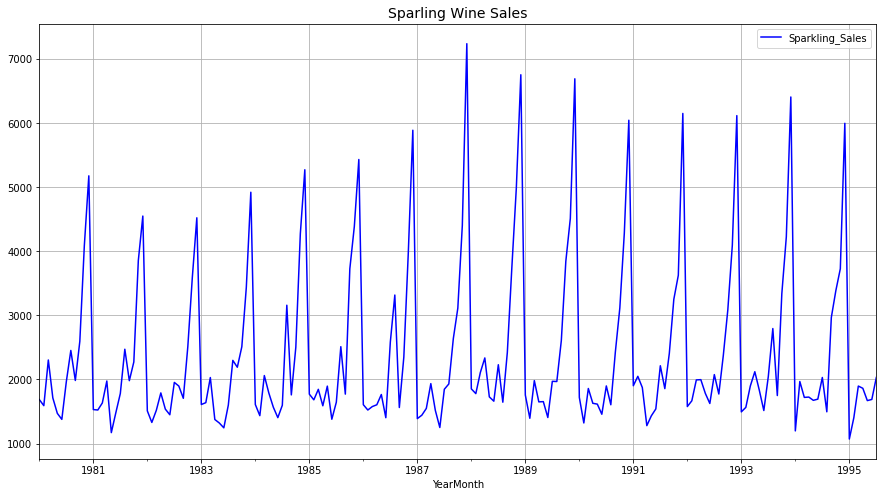

In [ ]:
plt.rcParams['figure.figsize'] = 15,8
sparkling.plot(color='blue')
plt.title('Sparling Wine Sales', size=14)
plt.grid()

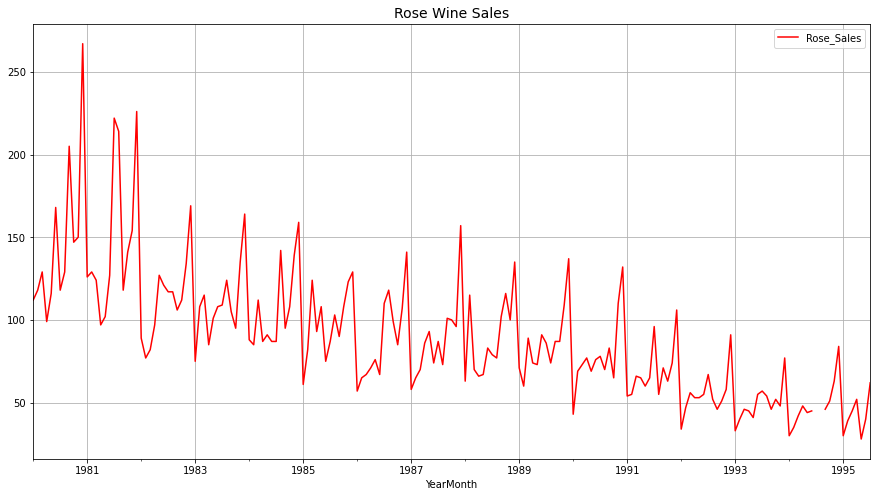

In [ ]:
plt.rcParams['figure.figsize'] = 15,8
rose.plot(color='red')
plt.title('Rose Wine Sales', size=14)
plt.grid()

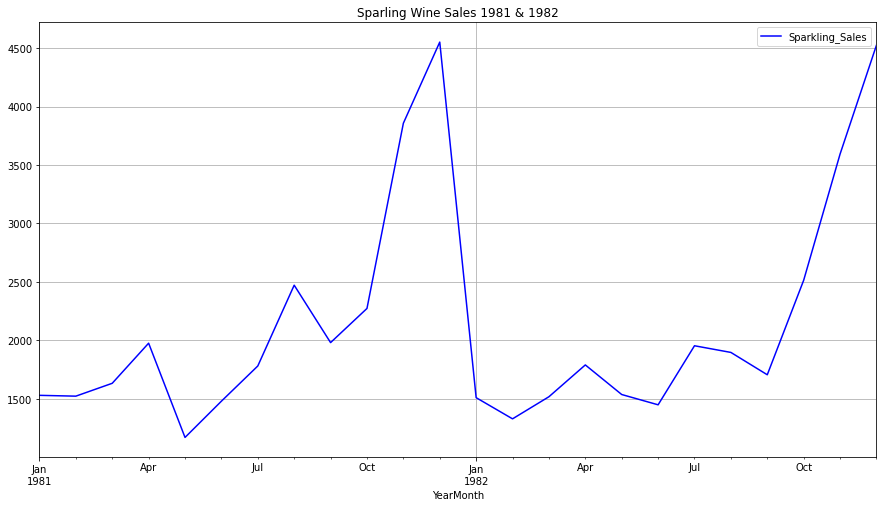

In [ ]:
sparkling[(sparkling.index.year == 1981)|(sparkling.index.year == 1982)].plot(color='blue')
plt.title('Sparling Wine Sales 1981 & 1982')
plt.grid()

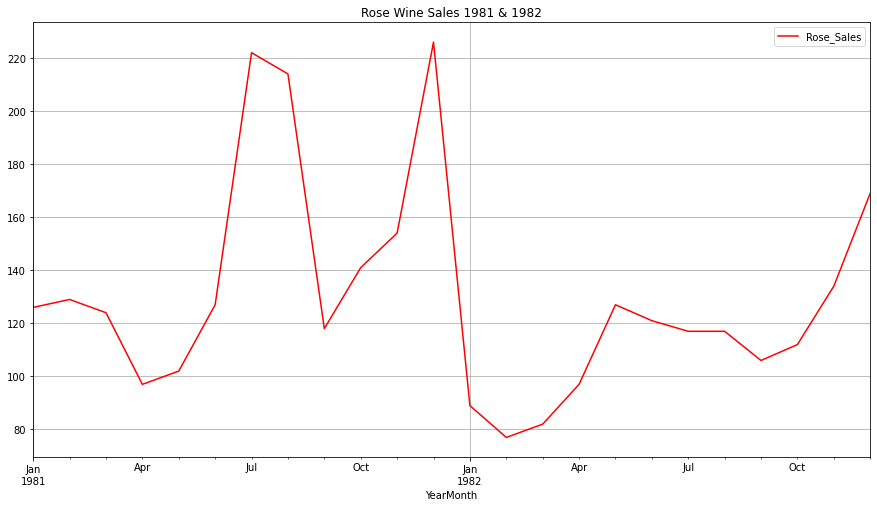

In [ ]:
rose[(rose.index.year == 1981)|(rose.index.year == 1982)].plot(color='red')
plt.title('Rose Wine Sales 1981 & 1982')
plt.grid()

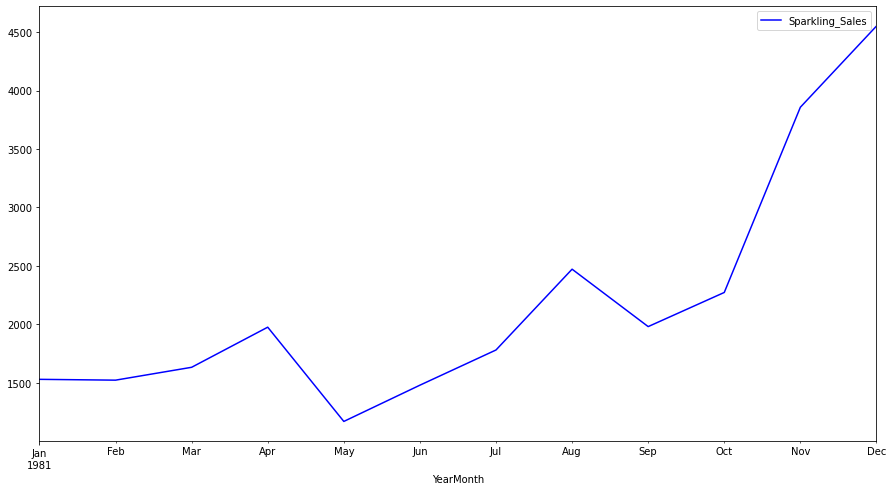

In [ ]:
sparkling['1981'].plot(color='blue')

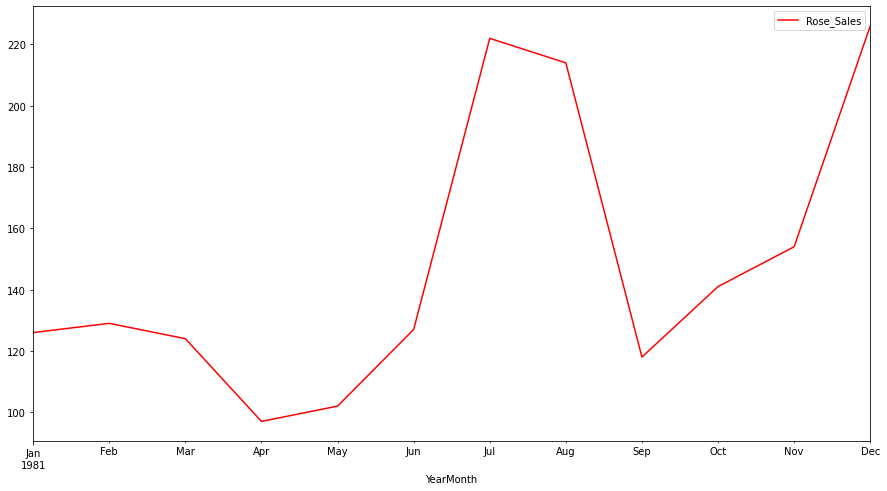

In [ ]:
rose['1981'].plot(color='red')

*   There is yearly seasonality. No. of units sold is at it peak in December every year due to Holiday season(Christmas).
*   There are smaller peaks in April(Easter)
*   Schools reopen is September after labor day.Fall in sales could be due to that
*   After october end Halloween,Thanksgiving,Christmas - high sales

## **2. Perform appropriate Exploratory Data Analysis to understand the data and also perform decomposition**

In [ ]:
# Information about the sparkling dataset
sparkling.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 187 entries, 1980-01-01 to 1995-07-01
Data columns (total 1 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   Sparkling_Sales  187 non-null    int64
dtypes: int64(1)
memory usage: 2.9 KB


In [ ]:
# Information about the rose dataset
rose.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 187 entries, 1980-01-01 to 1995-07-01
Data columns (total 1 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Rose_Sales  185 non-null    float64
dtypes: float64(1)
memory usage: 2.9 KB


In [ ]:
# Check for null values in the sparkling dataset
sparkling.isnull().sum()

Sparkling_Sales    0
dtype: int64

In [ ]:
# Check for null values in the sparkling dataset
rose.isnull().sum()

Rose_Sales    2
dtype: int64

In [ ]:
rose[rose['Rose_Sales'].isnull()]

,Rose_Sales
YearMonth,
1994-07-01,NaN
1994-08-01,NaN


Since the data has monthly frequency, we can resample to month start frequency

In [ ]:
rose.converted  = rose.Rose_Sales
ts = rose.converted.resample('MS').mean() 
rose.Rose_Sales = ts.interpolate(method = 'linear')
rose.Rose_Sales['1994']

YearMonth
1994-01-01    30.000000
1994-02-01    35.000000
1994-03-01    42.000000
1994-04-01    48.000000
1994-05-01    44.000000
1994-06-01    45.000000
1994-07-01    45.333333
1994-08-01    45.666667
1994-09-01    46.000000
1994-10-01    51.000000
1994-11-01    63.000000
1994-12-01    84.000000
Name: Rose_Sales, dtype: float64

In [ ]:
# Basic measures of descriptive statistics for the sparkling dataset
sparkling_df_stat = sparkling.describe().T
sparkling_df_stat

,count,mean,std,min,25%,50%,75%,max
Sparkling_Sales,187.0,2402.417112,1295.11154,1070.0,1605.0,1874.0,2549.0,7242.0


In [ ]:
sparkling_df_stat['Skew']=sparkling.skew(axis=0)
sparkling_df_stat['Kurtosis']=sparkling.kurtosis(axis=0)
sparkling_df_stat

,count,mean,std,min,25%,50%,75%,max,Skew,Kurtosis
Sparkling_Sales,187.0,2402.417112,1295.11154,1070.0,1605.0,1874.0,2549.0,7242.0,1.817612,2.709292


In [ ]:
# Basic measures of descriptive statistics for the sparkling dataset
rose_df_stat = rose.describe().T
rose_df_stat

,count,mean,std,min,25%,50%,75%,max
Rose_Sales,187.0,89.914439,39.238325,28.0,62.5,85.0,111.0,267.0


In [ ]:
rose_df_stat['Skew']=rose.skew(axis=0)
rose_df_stat['Kurtosis']=rose.kurtosis(axis=0)
rose_df_stat

,count,mean,std,min,25%,50%,75%,max,Skew,Kurtosis
Rose_Sales,187.0,89.914439,39.238325,28.0,62.5,85.0,111.0,267.0,1.26751,2.811788


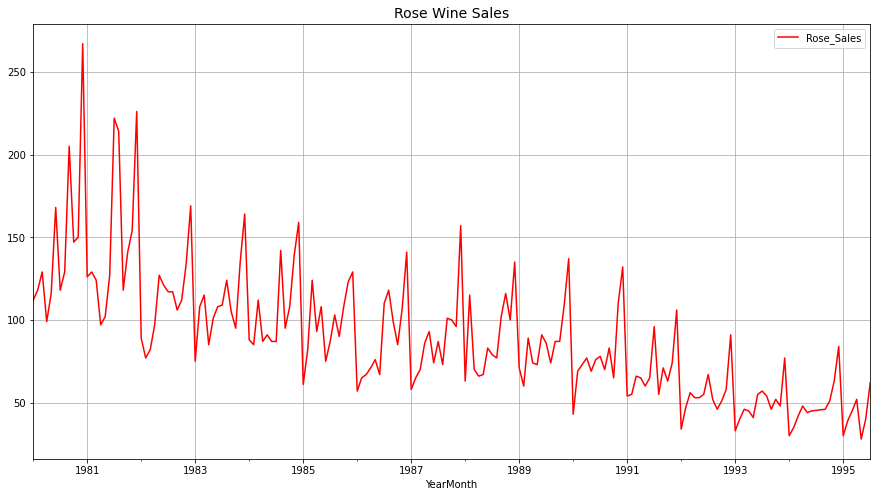

In [ ]:
plt.rcParams['figure.figsize'] = 15,8
rose.plot(color='red')
plt.title('Rose Wine Sales', size=14)
plt.grid()

### **ECDF Plots**

Text(0, 0.5, 'Distribution')

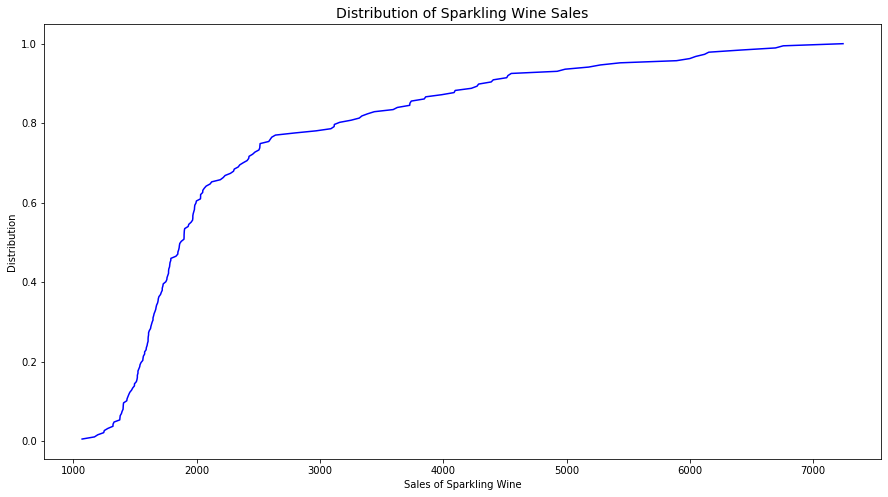

In [ ]:
# ECDF plot for sparkling data
plt.figure(figsize = (15, 8))
cdf = ECDF(sparkling['Sparkling_Sales'])
plt.plot(cdf.x, cdf.y, label = "statmodels", color = 'blue')
plt.title('Distribution of Sparkling Wine Sales', fontsize=14)
plt.xlabel('Sales of Sparkling Wine')
plt.ylabel('Distribution')

Text(0, 0.5, 'Distribution')

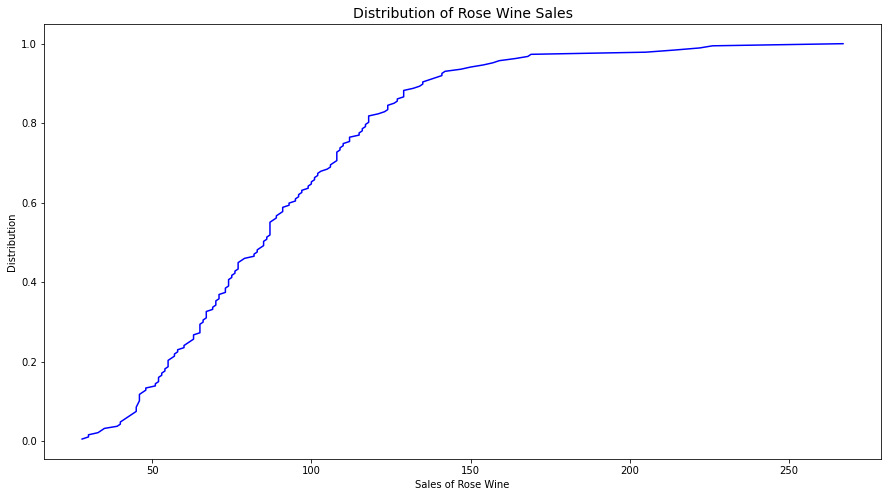

In [ ]:
# ECDF plot for rose data
plt.figure(figsize = (15, 8))
cdf = ECDF(rose['Rose_Sales'])
plt.plot(cdf.x, cdf.y, label = "statmodels", color = 'blue')
plt.title('Distribution of Rose Wine Sales', fontsize=14)
plt.xlabel('Sales of Rose Wine')
plt.ylabel('Distribution')

### **Year on year boxplot for Wine Sales**

Text(0.5, 1.0, 'Year on Year Box Plots for Sparkling Wine Sales')

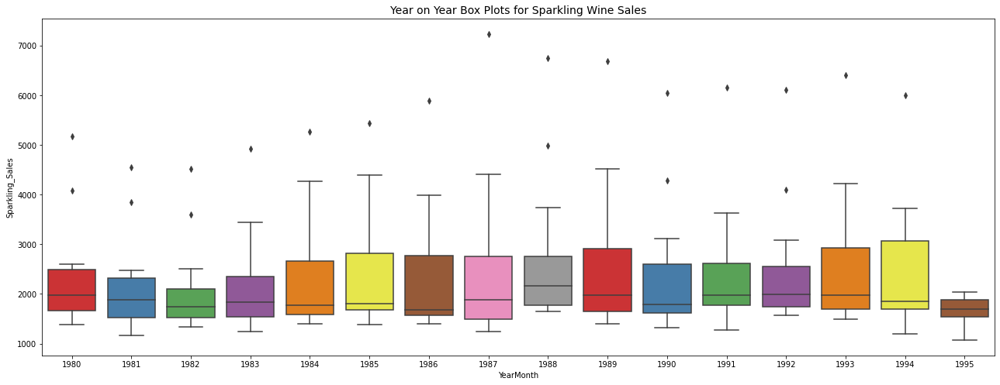

In [ ]:
# Year on Year box plots of sparkling wine sales
plt.figure(figsize=(22,8))
fig1 = sns.boxplot(x=sparkling.index.year,y=sparkling.Sparkling_Sales, palette='Set1');
fig1.set_title('Year on Year Box Plots for Sparkling Wine Sales', fontsize=14)

Text(0.5, 1.0, 'Year on Year Box Plots for Rose Wine Sales')

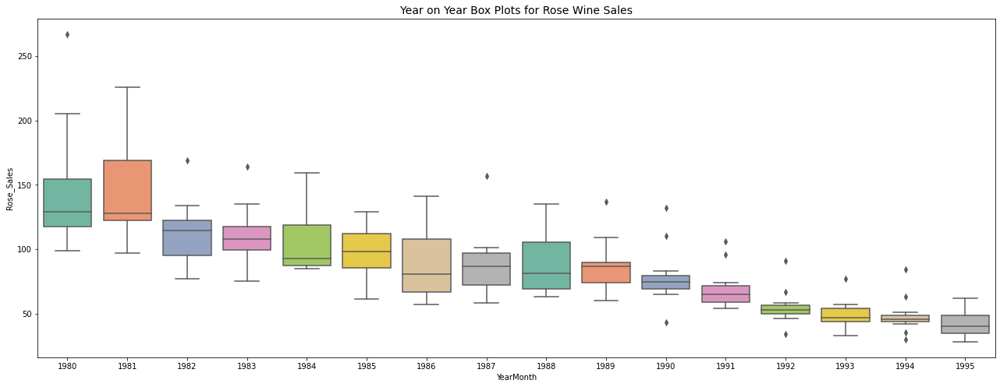

In [ ]:
# Year on Year box plots of rose wine sales
plt.figure(figsize=(22,8))
fig2 = sns.boxplot(x=rose.index.year,y=rose.Rose_Sales, palette='Set2');
fig2.set_title('Year on Year Box Plots for Rose Wine Sales', fontsize=14)

Outliers are sales in November and December months

###  **Month on Month Box Plots**

Text(0.5, 0, 'Month')

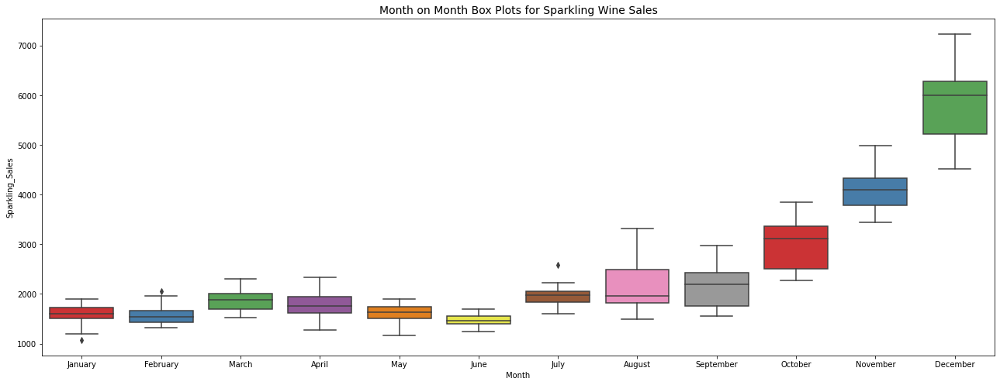

In [ ]:
# Month on Month box plots of sparkling wine sales
plt.figure(figsize=(22,8))
fig3 = sns.boxplot(x=sparkling.index.month_name(),y=sparkling.Sparkling_Sales, palette='Set1');
fig3.set_title('Month on Month Box Plots for Sparkling Wine Sales', fontsize=14)
fig3.set_xlabel('Month')

Text(0.5, 0, 'Month')

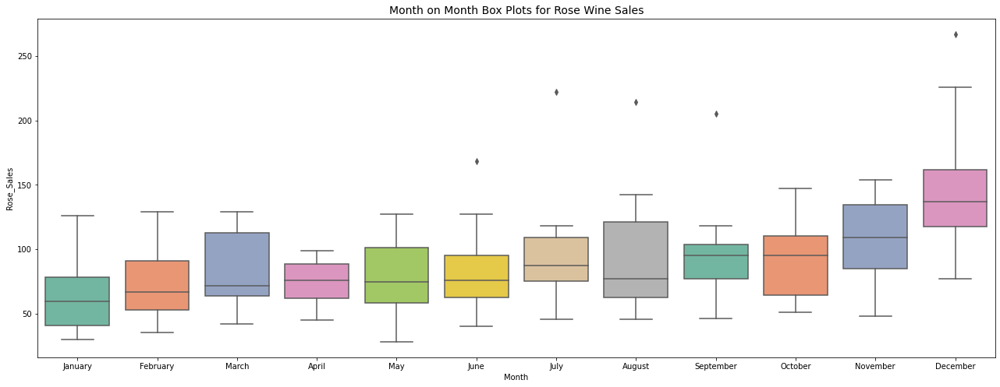

In [ ]:
# Month on Month box plots of rose wine sales
plt.figure(figsize=(22,8))
fig4 = sns.boxplot(x=rose.index.month_name(),y=rose.Rose_Sales, palette='Set2');
fig4.set_title('Month on Month Box Plots for Rose Wine Sales', fontsize=14)
fig4.set_xlabel('Month')

After September there is a huge increase in sales

### **Month Plots**

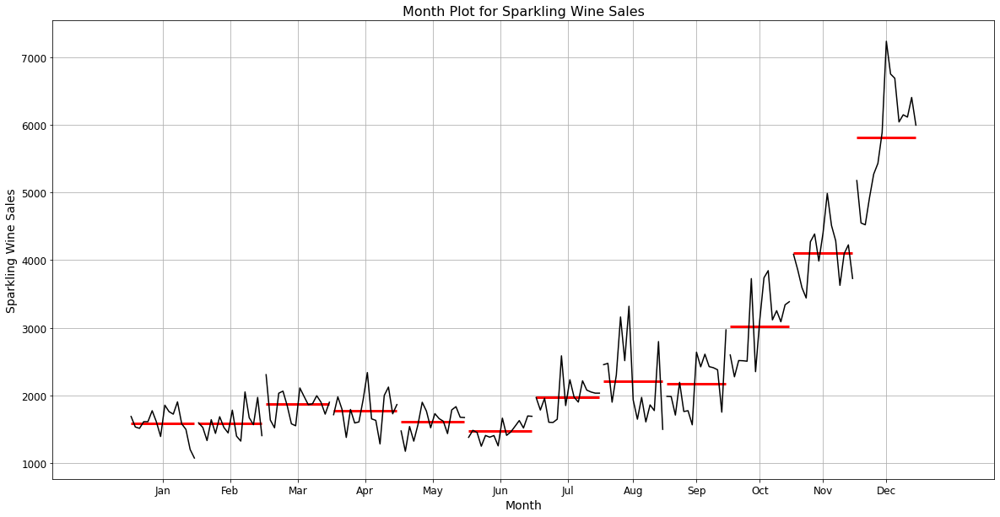

In [ ]:
# Month Plot for Sparkling Wine Sales
fig5, ax5 = plt.subplots(figsize=(20,10))

month_plot(sparkling.Sparkling_Sales,ax=ax5)
plt.title('Month Plot for Sparkling Wine Sales', size=16)
plt.ylabel('Sparkling Wine Sales', fontsize=14)
plt.xlabel('Month', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.grid();

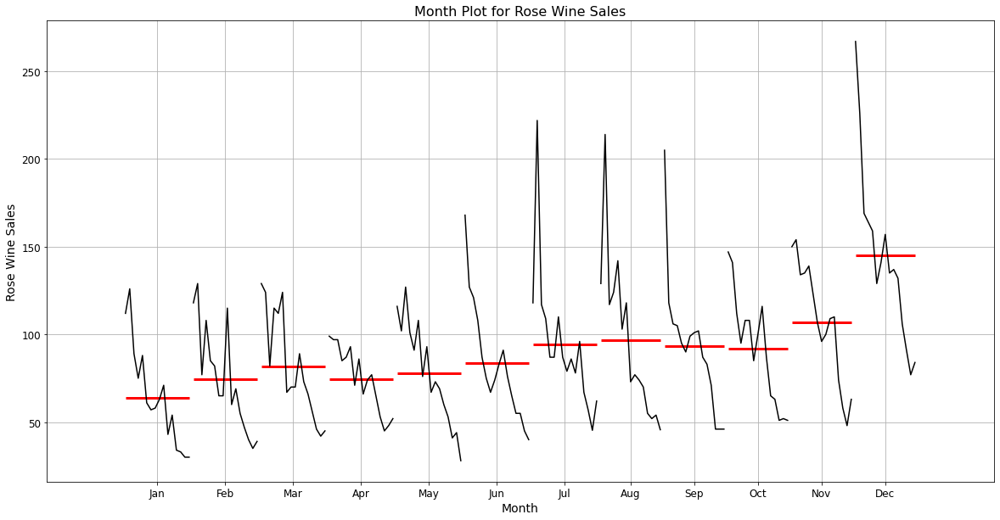

In [ ]:
# Month Plot for rose Wine Sales
fig5, ax5 = plt.subplots(figsize=(20,10))

month_plot(rose.Rose_Sales,ax=ax5)
plt.title('Month Plot for Rose Wine Sales', size=16)
plt.ylabel('Rose Wine Sales', fontsize=14)
plt.xlabel('Month', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.grid();

### **Plots for Different Months for Different Years**

In [ ]:
sparkling_yearly_sales_across_months=pd.pivot_table(sparkling,values='Sparkling_Sales',index=sparkling.index.year,columns=sparkling.index.month)
sparkling_yearly_sales_across_months

YearMonth,1,2,3,4,5,6,7,8,9,10,11,12
YearMonth,,,,,,,,,,,,
1980,1686.0,1591.0,2304.0,1712.0,1471.0,1377.0,1966.0,2453.0,1984.0,2596.0,4087.0,5179.0
1981,1530.0,1523.0,1633.0,1976.0,1170.0,1480.0,1781.0,2472.0,1981.0,2273.0,3857.0,4551.0
1982,1510.0,1329.0,1518.0,1790.0,1537.0,1449.0,1954.0,1897.0,1706.0,2514.0,3593.0,4524.0
1983,1609.0,1638.0,2030.0,1375.0,1320.0,1245.0,1600.0,2298.0,2191.0,2511.0,3440.0,4923.0
1984,1609.0,1435.0,2061.0,1789.0,1567.0,1404.0,1597.0,3159.0,1759.0,2504.0,4273.0,5274.0
1985,1771.0,1682.0,1846.0,1589.0,1896.0,1379.0,1645.0,2512.0,1771.0,3727.0,4388.0,5434.0
1986,1606.0,1523.0,1577.0,1605.0,1765.0,1403.0,2584.0,3318.0,1562.0,2349.0,3987.0,5891.0
1987,1389.0,1442.0,1548.0,1935.0,1518.0,1250.0,1847.0,1930.0,2638.0,3114.0,4405.0,7242.0
1988,1853.0,1779.0,2108.0,2336.0,1728.0,1661.0,2230.0,1645.0,2421.0,3740.0,4988.0,6757.0


Text(0.5, 1.0, 'Sparkling - Monthly sales over years')

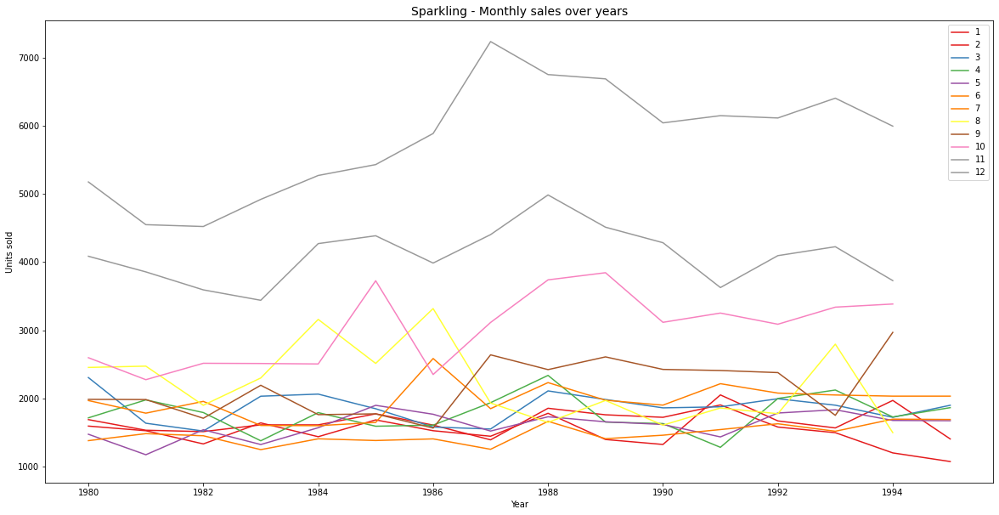

In [ ]:
fig6, ax6 = plt.subplots(figsize=(20,10))
sparkling_yearly_sales_across_months.plot(colormap='Set1', ax=ax6)
plt.legend(loc='best')
plt.ylabel('Units sold')
plt.xlabel('Year')
plt.title('Sparkling - Monthly sales over years', fontsize=14)

In [ ]:
rose_yearly_sales_across_months=pd.pivot_table(rose,values='Rose_Sales',index=rose.index.year,columns=rose.index.month)
rose_yearly_sales_across_months

YearMonth,1,2,3,4,5,6,7,8,9,10,11,12
YearMonth,,,,,,,,,,,,
1980,112.0,118.0,129.0,99.0,116.0,168.0,118.000000,129.000000,205.0,147.0,150.0,267.0
1981,126.0,129.0,124.0,97.0,102.0,127.0,222.000000,214.000000,118.0,141.0,154.0,226.0
1982,89.0,77.0,82.0,97.0,127.0,121.0,117.000000,117.000000,106.0,112.0,134.0,169.0
1983,75.0,108.0,115.0,85.0,101.0,108.0,109.000000,124.000000,105.0,95.0,135.0,164.0
1984,88.0,85.0,112.0,87.0,91.0,87.0,87.000000,142.000000,95.0,108.0,139.0,159.0
1985,61.0,82.0,124.0,93.0,108.0,75.0,87.000000,103.000000,90.0,108.0,123.0,129.0
1986,57.0,65.0,67.0,71.0,76.0,67.0,110.000000,118.000000,99.0,85.0,107.0,141.0
1987,58.0,65.0,70.0,86.0,93.0,74.0,87.000000,73.000000,101.0,100.0,96.0,157.0
1988,63.0,115.0,70.0,66.0,67.0,83.0,79.000000,77.000000,102.0,116.0,100.0,135.0


Text(0.5, 1.0, 'Rose - Monthly sales over years')

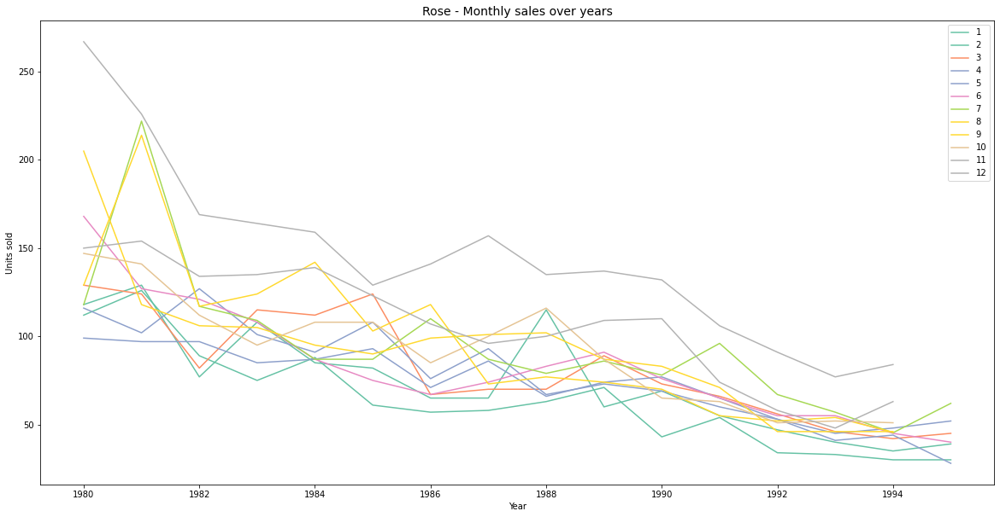

In [ ]:
fig7, ax7 = plt.subplots(figsize=(20,10))
rose_yearly_sales_across_months.plot(colormap='Set2', ax=ax7)
plt.legend(loc='best')
plt.ylabel('Units sold')
plt.xlabel('Year')
plt.title('Rose - Monthly sales over years', fontsize=14)

### **Time Series Heat Maps**

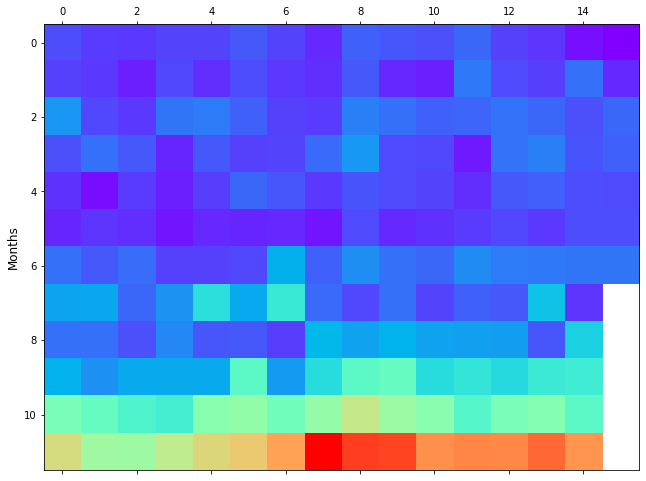

<Figure size 1440x720 with 0 Axes>

In [ ]:
# Heat Map for sparkling sales
plt.matshow(sparkling_yearly_sales_across_months.T, interpolation=None, aspect='auto', cmap='rainbow')
plt.ylabel('Months',fontsize=12)
plt.figure(figsize=(20,10))
plt.show()
#plt.xticks('Years',fontsize=12)

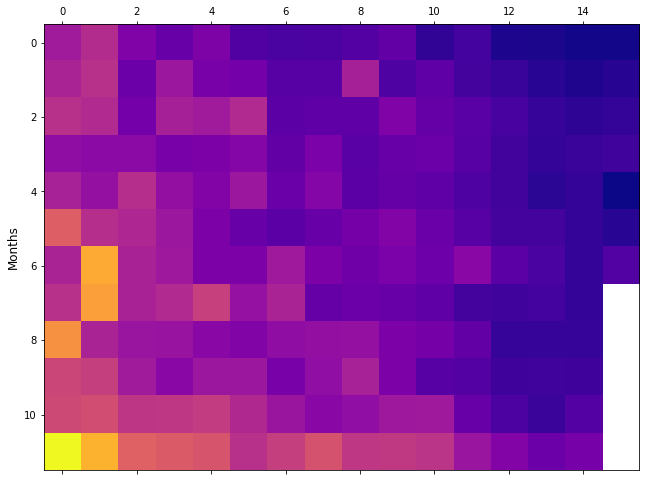

<Figure size 1440x720 with 0 Axes>

In [ ]:
# Heat Map for rose sales
plt.matshow(rose_yearly_sales_across_months.T, interpolation=None, aspect='auto', cmap='plasma')
plt.ylabel('Months',fontsize=12)
plt.figure(figsize=(20,10))
plt.show()
#plt.xticks('Years',fontsize=12)

### **Plot the average RetailSales per month and the month on month percentage change of RetailSales**

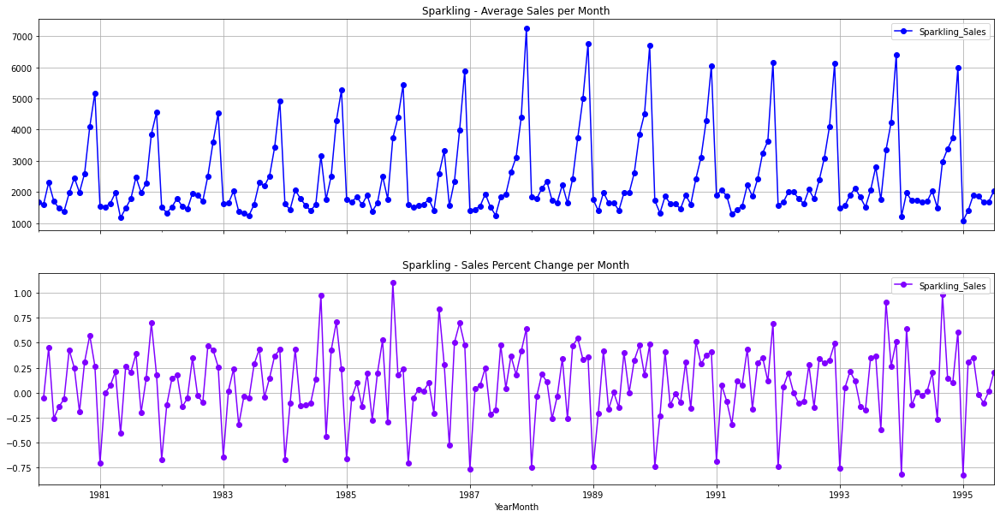

In [ ]:
# group by date and get average Sales, and precent change
average    = sparkling.groupby(sparkling.index)['Sparkling_Sales'].mean()
pct_change = sparkling.groupby(sparkling.index)['Sparkling_Sales'].sum().pct_change()

fig8, (ax1,ax2) = plt.subplots(2,1,sharex=True,figsize=(20,10))

# plot average Sales over time(year-month)
ax1 = average.plot(legend=True,ax=ax1,marker='o',title="Sparkling - Average Sales per Month",grid=True, color='blue')
ax1.set_xticks(range(len(average)))
ax1.set_xticklabels(average.index.tolist())
# plot precent change for Sales over time(year-month)
ax2 = pct_change.plot(legend=True,ax=ax2,marker='o',colormap="rainbow",title="Sparkling - Sales Percent Change per Month",grid=True)

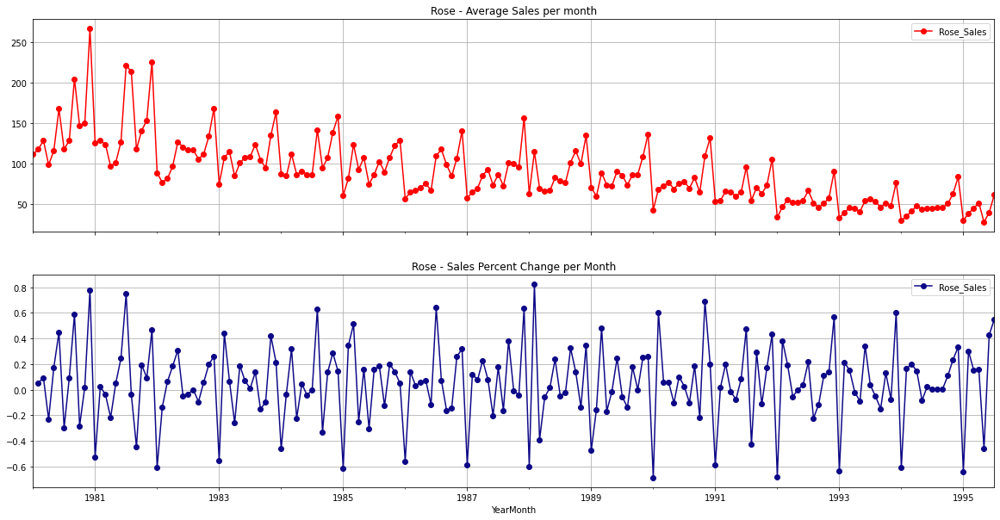

In [ ]:
# group by date and get average Sales, and precent change
average    = rose.groupby(rose.index)['Rose_Sales'].mean()
pct_change = rose.groupby(rose.index)['Rose_Sales'].sum().pct_change()

fig9, (ax1,ax2) = plt.subplots(2,1,sharex=True,figsize=(20,10))

# plot average Sales over time(year-month)
ax1 = average.plot(legend=True,ax=ax1,marker='o',title="Rose - Average Sales per month",grid=True, color='red')
ax1.set_xticks(range(len(average)))
ax1.set_xticklabels(average.index.tolist())
# plot precent change for Sales over time(year-month)
ax2 = pct_change.plot(legend=True,ax=ax2,marker='o',colormap="plasma",title="Rose - Sales Percent Change per Month",grid=True)

### **Yearly Plots**

#### **Sum of Units sold each year**

In [ ]:
sparkling_yearly=sparkling[sparkling.index.year<1995].resample('A').sum()
sparkling_yearly.head()

,Sparkling_Sales
YearMonth,
1980-12-31,28406
1981-12-31,26227
1982-12-31,25321
1983-12-31,26180
1984-12-31,28431


Text(0, 0.5, 'Number of Units Sold')

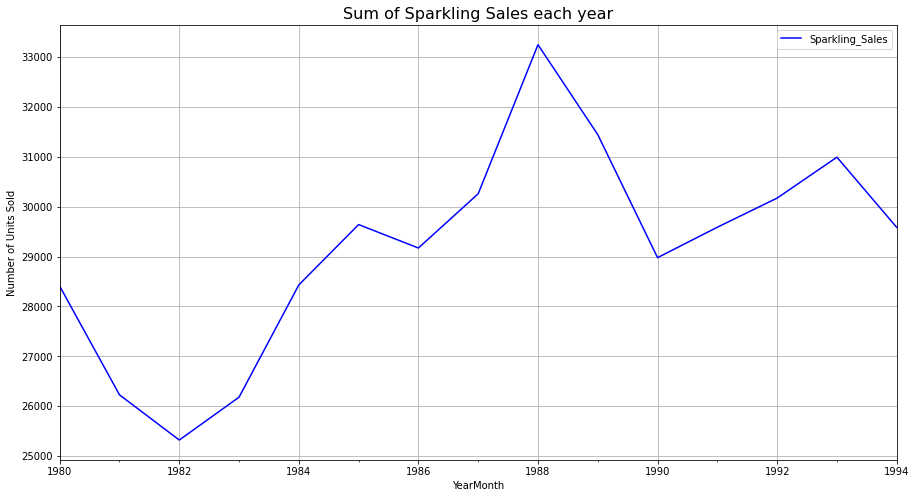

In [ ]:
plt.rcParams['figure.figsize'] = 15,8
sparkling_yearly.plot(color='blue')
plt.grid()
plt.title('Sum of Sparkling Sales each year',fontsize=16)
plt.ylabel('Number of Units Sold')

Text(0, 0.5, 'Average Number of Units Sold')

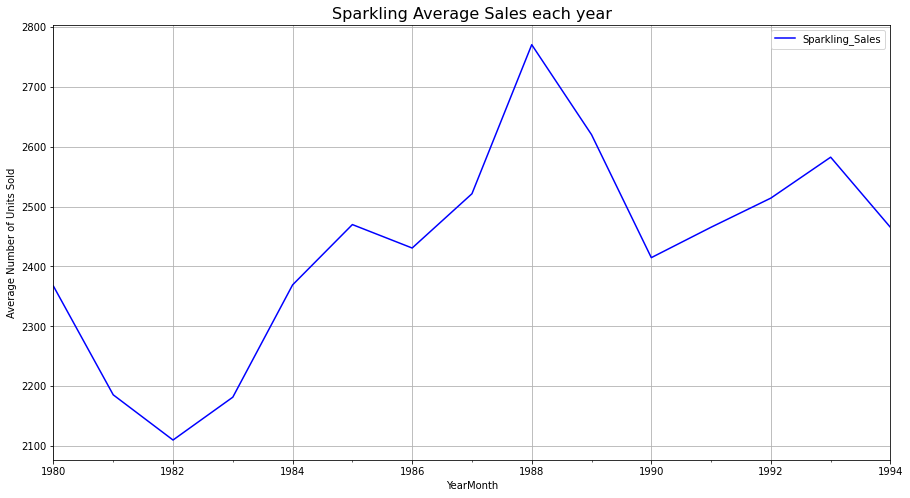

In [ ]:
sparkling_yearly_avg=sparkling[sparkling.index.year<1995].resample('A').mean()
sparkling_yearly_avg.plot(color='blue')
plt.grid()
plt.title('Sparkling Average Sales each year',fontsize=16)
plt.ylabel('Average Number of Units Sold')

Text(0.5, 0, 'Year')

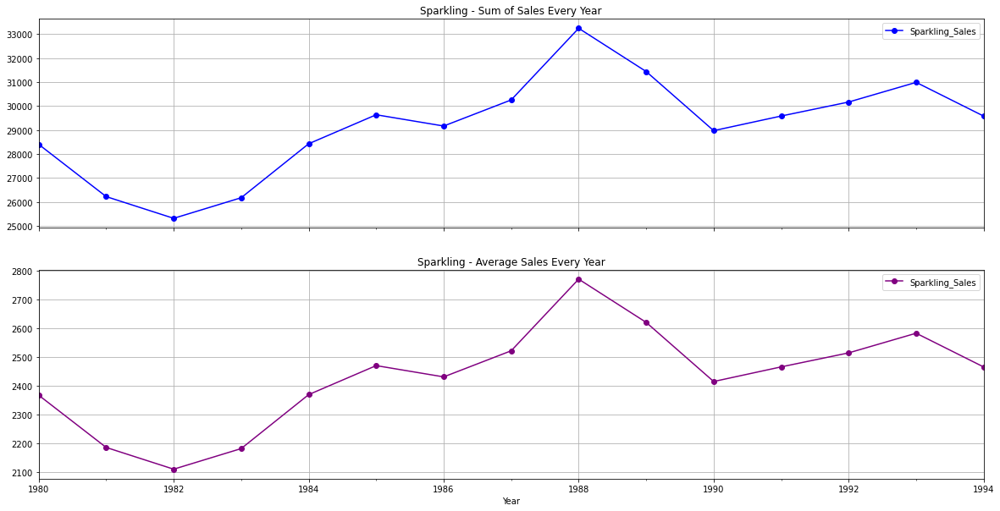

In [ ]:
# group by date and get average Sales, and precent change
sparkling_yearly=sparkling[sparkling.index.year<1995].resample('A').sum()
sparkling_yearly_avg=sparkling[sparkling.index.year<1995].resample('A').mean()

fig10, (ax3,ax4) = plt.subplots(2,1,sharex=True,figsize=(20,10))

# plot yearly sum of Sales over time(year-month)
ax3 = sparkling_yearly.plot(legend=True,ax=ax3,marker='o',title="Sparkling - Sum of Sales Every Year",grid=True, color='blue')
ax3.set_xticks(range(len(sparkling_yearly)))
# plot precent change for Sales over time(year-month)
ax4 = sparkling_yearly_avg.plot(legend=True,ax=ax4,marker='o',color="purple",title="Sparkling - Average Sales Every Year",grid=True)
ax4.set_xlabel('Year')

In [ ]:
rose_yearly=sparkling[rose.index.year<1995].resample('A').sum()
rose_yearly.head()

,Sparkling_Sales
YearMonth,
1980-12-31,28406
1981-12-31,26227
1982-12-31,25321
1983-12-31,26180
1984-12-31,28431


Text(0, 0.5, 'Number of Units Sold')

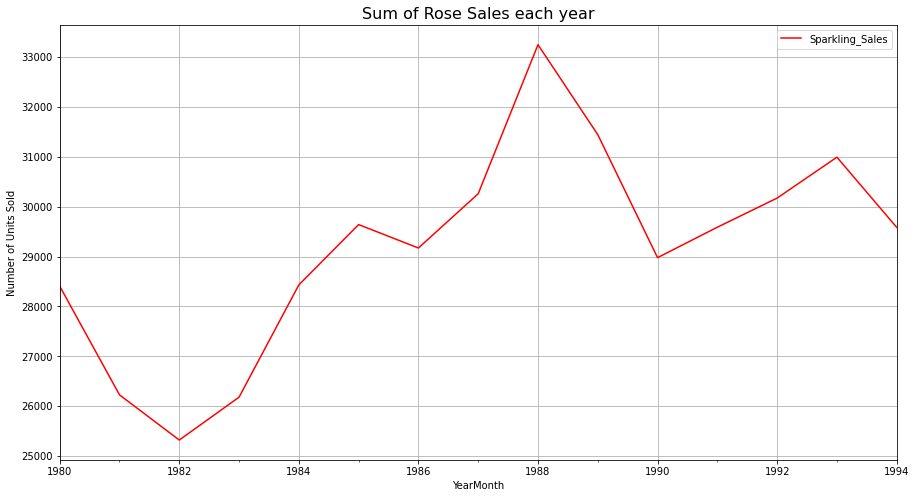

In [ ]:
plt.rcParams['figure.figsize'] = 15,8
rose_yearly.plot(color='red')
plt.grid()
plt.title('Sum of Rose Sales each year',fontsize=16)
plt.ylabel('Number of Units Sold')

Text(0, 0.5, 'Average Number of Units Sold')

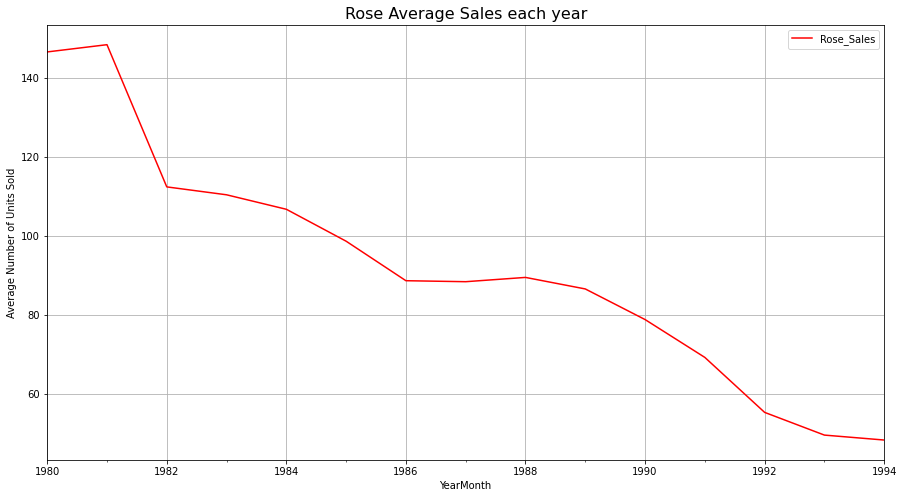

In [ ]:
rose_yearly_avg=rose[rose.index.year<1995].resample('A').mean()
rose_yearly_avg.plot(color='red')
plt.grid()
plt.title('Rose Average Sales each year',fontsize=16)
plt.ylabel('Average Number of Units Sold')

Text(0.5, 0, 'Year')

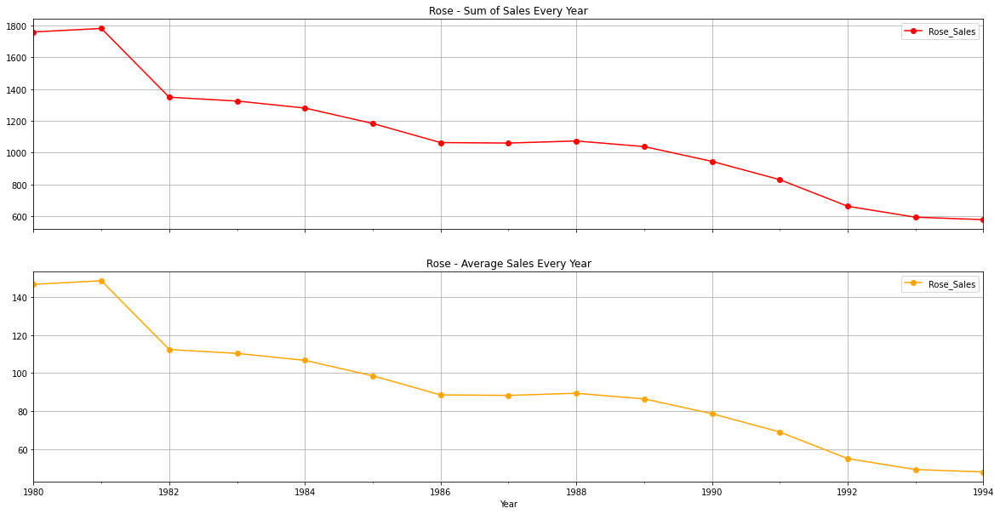

In [ ]:
# group by date and get average Sales, and precent change
rose_yearly=rose[rose.index.year<1995].resample('A').sum()
rose_yearly_avg=rose[rose.index.year<1995].resample('A').mean()

fig11, (ax5,ax6) = plt.subplots(2,1,sharex=True,figsize=(20,10))

# plot yearly sum of Sales over time(year-month)
ax5 = rose_yearly.plot(legend=True,ax=ax5,marker='o',title="Rose - Sum of Sales Every Year",grid=True, color='red')
ax5.set_xticks(range(len(sparkling_yearly)))
# plot precent change for Sales over time(year-month)
ax6 = rose_yearly_avg.plot(legend=True,ax=ax6,marker='o',color="orange",title="Rose - Average Sales Every Year",grid=True)
ax6.set_xlabel('Year')

### **Quarterly Plots**

Text(0.5, 0, 'Year')

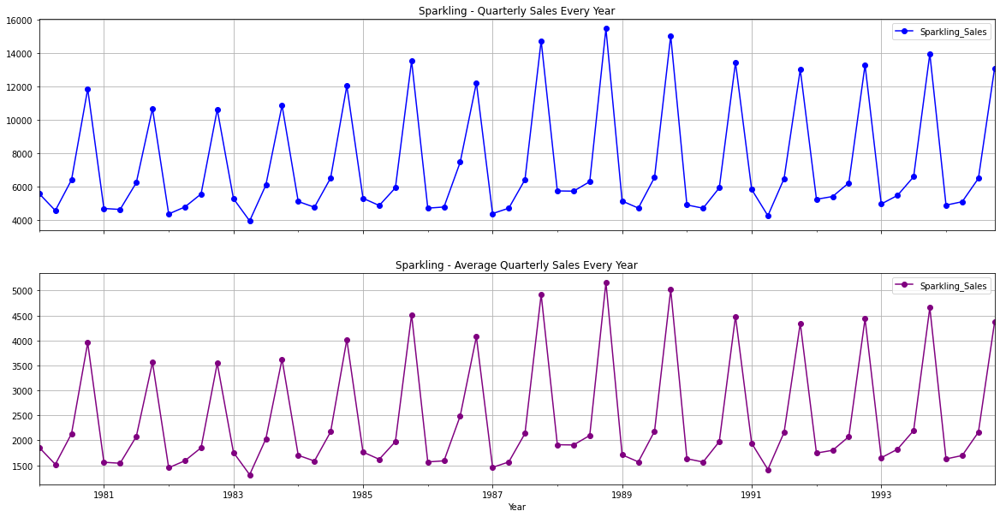

In [ ]:
# group by date and get average Sales, and precent change
sparkling_quarterly=sparkling[sparkling.index.year<1995].resample('Q').sum()
sparkling_quarterly_avg=sparkling[sparkling.index.year<1995].resample('Q').mean()

fig12, (ax7,ax8) = plt.subplots(2,1,sharex=True,figsize=(20,10))

# plot yearly sum of Sales over time(year-month)
ax7 = sparkling_quarterly.plot(legend=True,ax=ax7,marker='o',title="Sparkling - Quarterly Sales Every Year",grid=True, color='blue')
ax7.set_xticks(range(len(sparkling_quarterly)))
# plot precent change for Sales over time(year-month)
ax8 = sparkling_quarterly_avg.plot(legend=True,ax=ax8,marker='o',color="purple",title="Sparkling - Average Quarterly Sales Every Year",grid=True)
ax8.set_xlabel('Year')

Text(0.5, 0, 'Year')

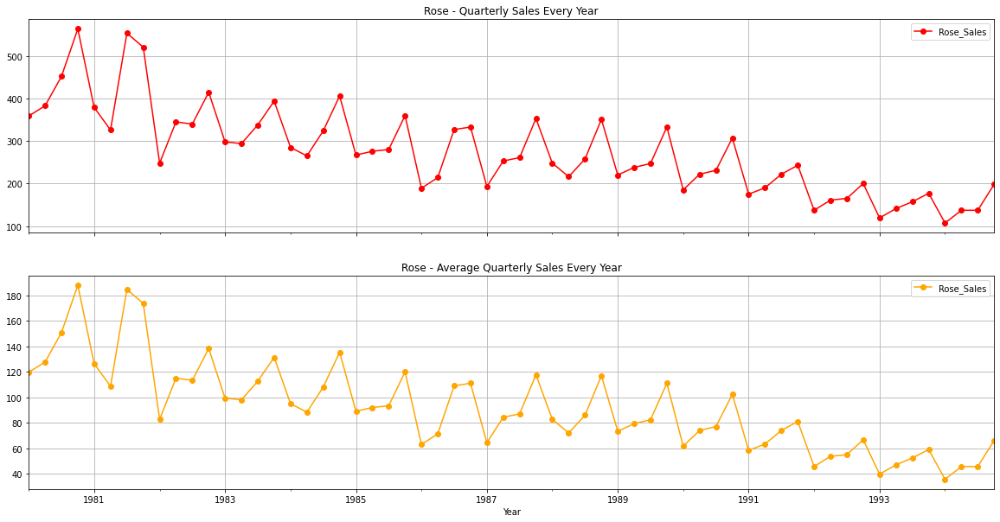

In [ ]:
# group by date and get average Sales, and precent change
rose_quarterly=rose[rose.index.year<1995].resample('Q').sum()
rose_quarterly_avg=rose[rose.index.year<1995].resample('Q').mean()

fig13, (ax9,ax10) = plt.subplots(2,1,sharex=True,figsize=(20,10))

# plot yearly sum of Sales over time(year-month)
ax9 = rose_quarterly.plot(legend=True,ax=ax9,marker='o',title="Rose - Quarterly Sales Every Year",grid=True, color='red')
ax9.set_xticks(range(len(rose_quarterly)))
# plot precent change for Sales over time(year-month)
ax10 = rose_quarterly_avg.plot(legend=True,ax=ax10,marker='o',color="orange",title="Rose - Average Quarterly Sales Every Year",grid=True)
ax10.set_xlabel('Year')

### **Quarterly Turnover Plots**

In [ ]:
quarter=['Q1','Q2','Q3','Q4']

Text(0.5, 1.0, 'Sparkling - Quarterly turn over')

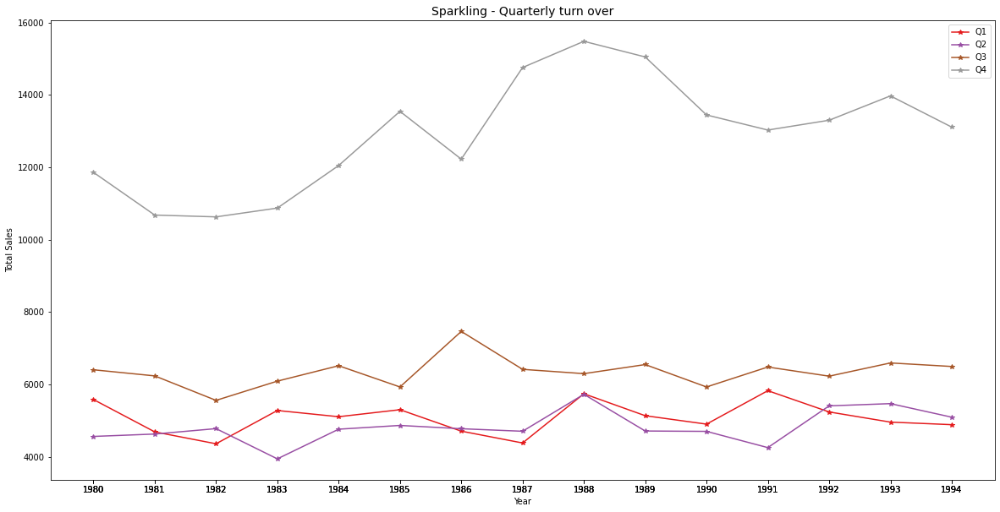

In [ ]:
sparkling_quarterly['Quarter']=quarter*15
sparkling_quarterly_turnover = pd.pivot_table(sparkling_quarterly, values = "Sparkling_Sales", columns = "Quarter", index = sparkling_quarterly.index.year)
fig14, ax11 = plt.subplots(figsize=(20,10))
sparkling_quarterly_turnover.plot(marker='*',colormap='Set1', ax=ax11)
plt.legend(loc='best')
plt.ylabel('Total Sales')
plt.xlabel('Year')
plt.xticks(sparkling_quarterly.index.year)
plt.title('Sparkling - Quarterly turn over', fontsize=14)

Text(0.5, 1.0, 'Rose - Quarterly turn over')

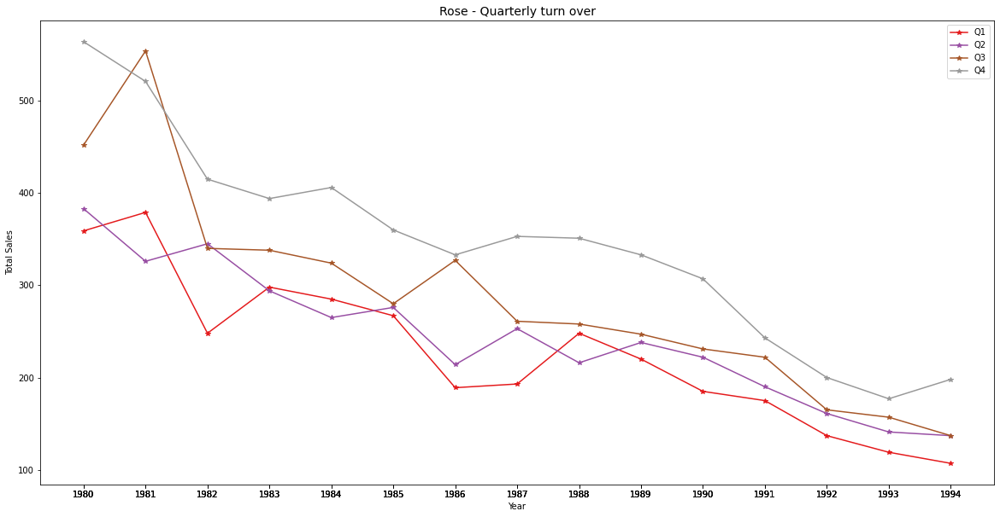

In [ ]:
rose_quarterly['Quarter']=quarter*15
rose_quarterly_turnover = pd.pivot_table(rose_quarterly, values = "Rose_Sales", columns = "Quarter", index = rose_quarterly.index.year)
fig14, ax11 = plt.subplots(figsize=(20,10))
rose_quarterly_turnover.plot(marker='*', colormap='Set1', ax=ax11)
plt.legend(loc='best')
plt.ylabel('Total Sales')
plt.xlabel('Year')
plt.xticks(rose_quarterly.index.year)
plt.title('Rose - Quarterly turn over', fontsize=14)

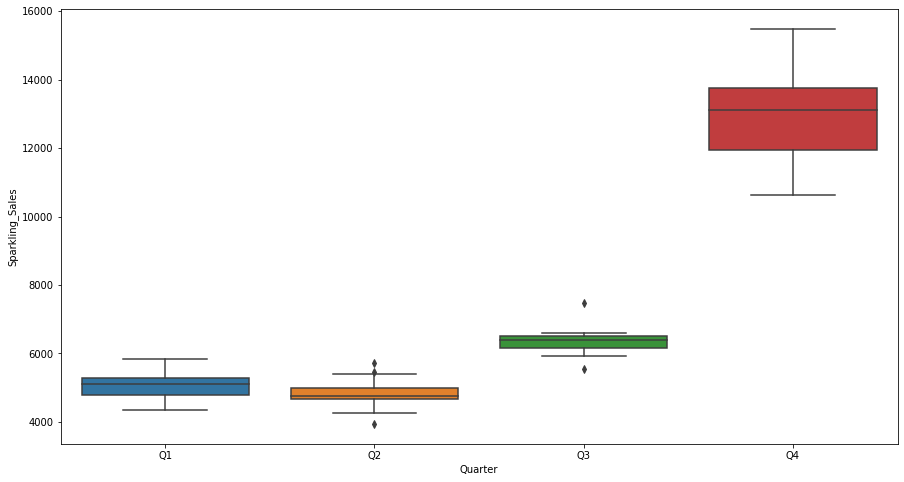

In [ ]:
sns.boxplot(x=sparkling_quarterly.Quarter, y=sparkling_quarterly.Sparkling_Sales)

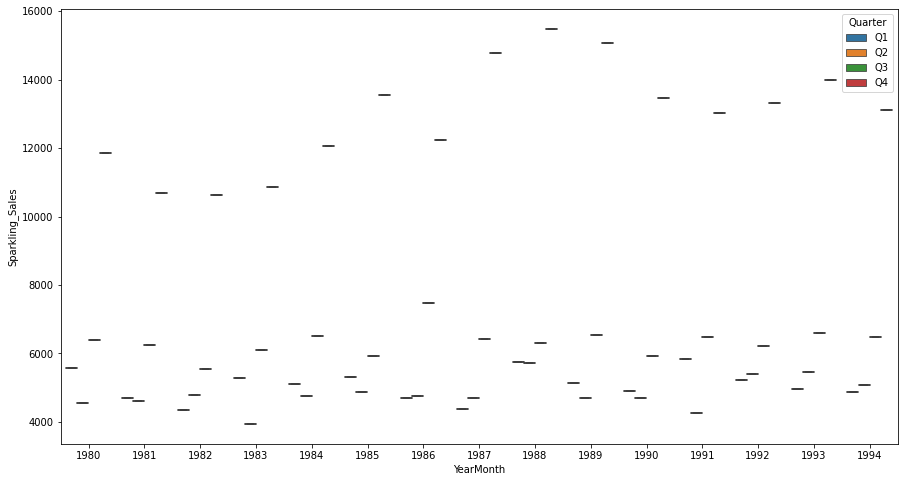

In [ ]:
sns.boxplot(x=sparkling_quarterly.index.year, y=sparkling_quarterly.Sparkling_Sales, hue=sparkling_quarterly.Quarter)

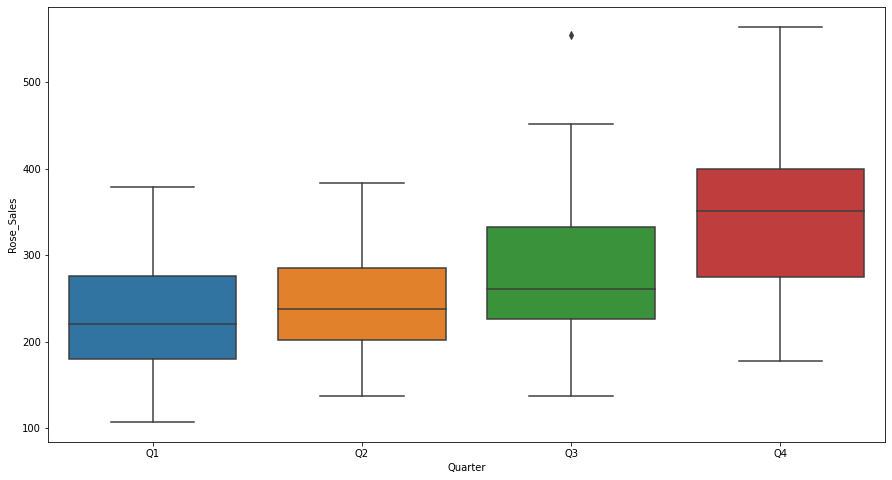

In [ ]:
sns.boxplot(x=rose_quarterly.Quarter, y=rose_quarterly.Rose_Sales)

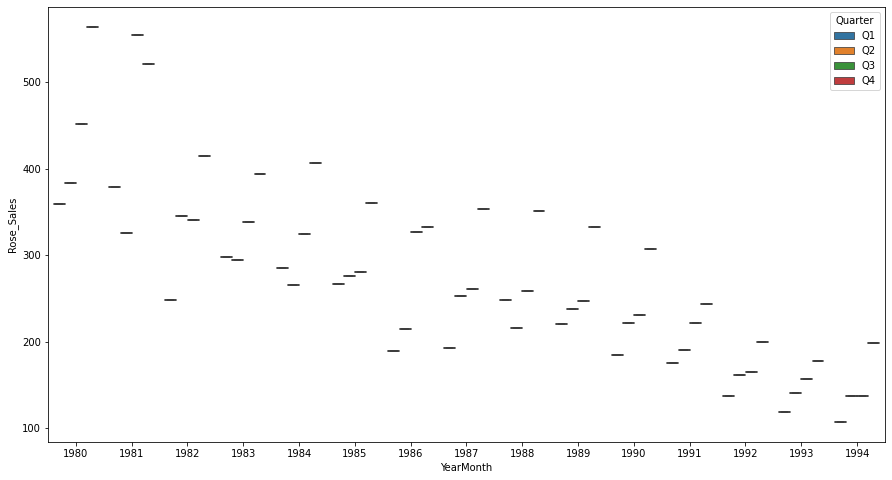

In [ ]:
sns.boxplot(x=rose_quarterly.index.year, y=rose_quarterly.Rose_Sales, hue=rose_quarterly.Quarter)

### **Time Series Lag Scatter Plots**

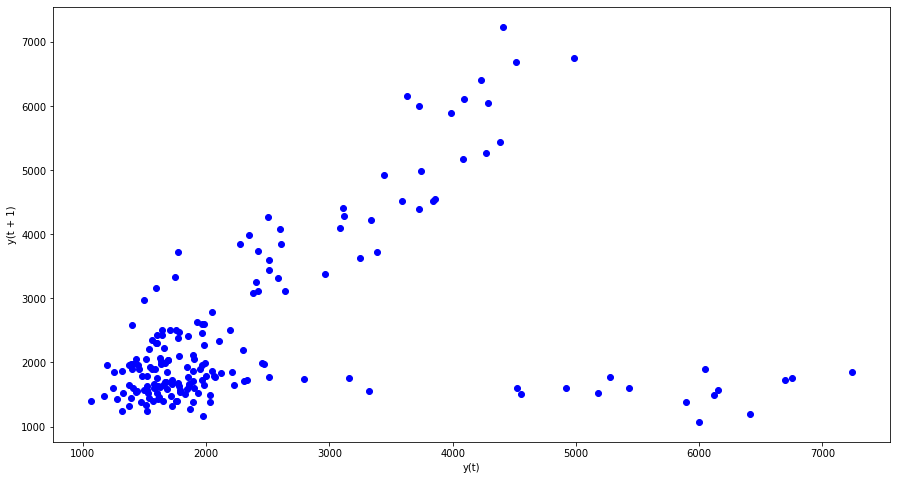

In [ ]:
from pandas.plotting import lag_plot
lag_plot(sparkling.Sparkling_Sales, c='blue')

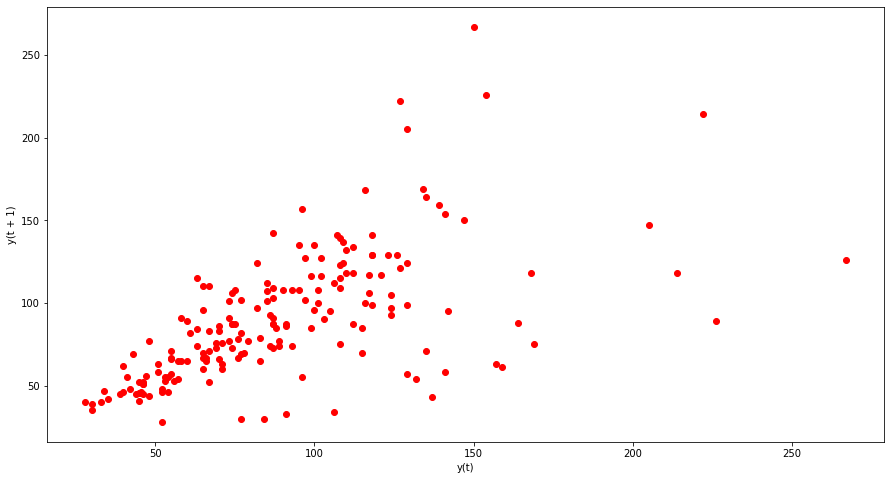

In [ ]:
lag_plot(rose.Rose_Sales, c='red')

For some higher sales values, there is a significant difference between sales value at prvious time point. Sales value is not completely correlated

### **Time Series Decomposition**

### **Sparkling**

#### **Additive Decomposition**

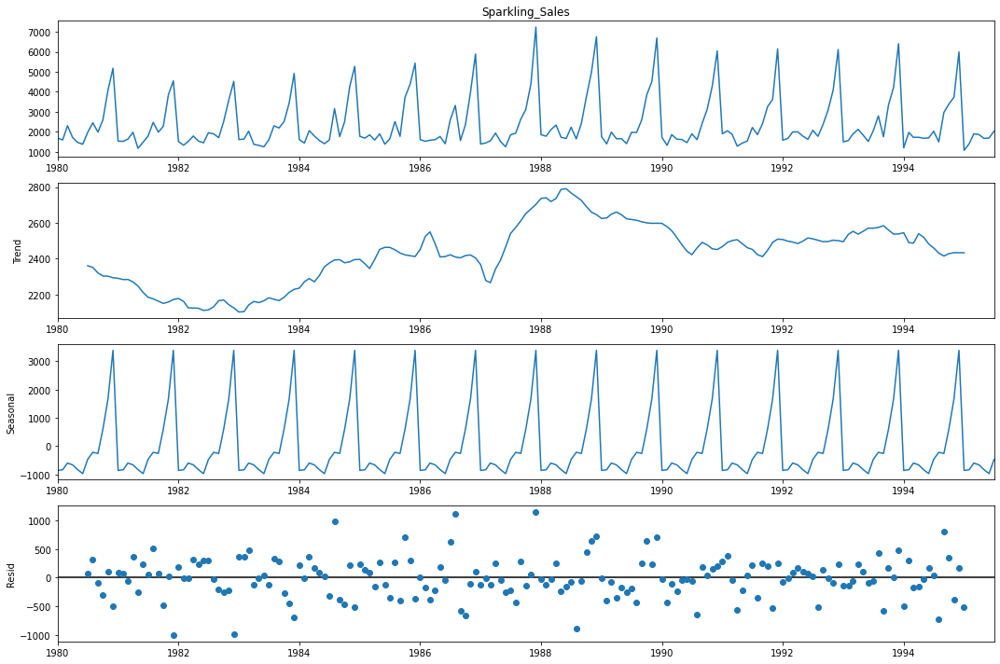

In [ ]:
plt.rcParams['figure.figsize'] = [15, 10] 
sparkling_add_decomposition=seasonal_decompose(sparkling['Sparkling_Sales'],model='additive', period=12)
sparkling_add_decomposition.plot();

#### **Multiplicative Decomposition**

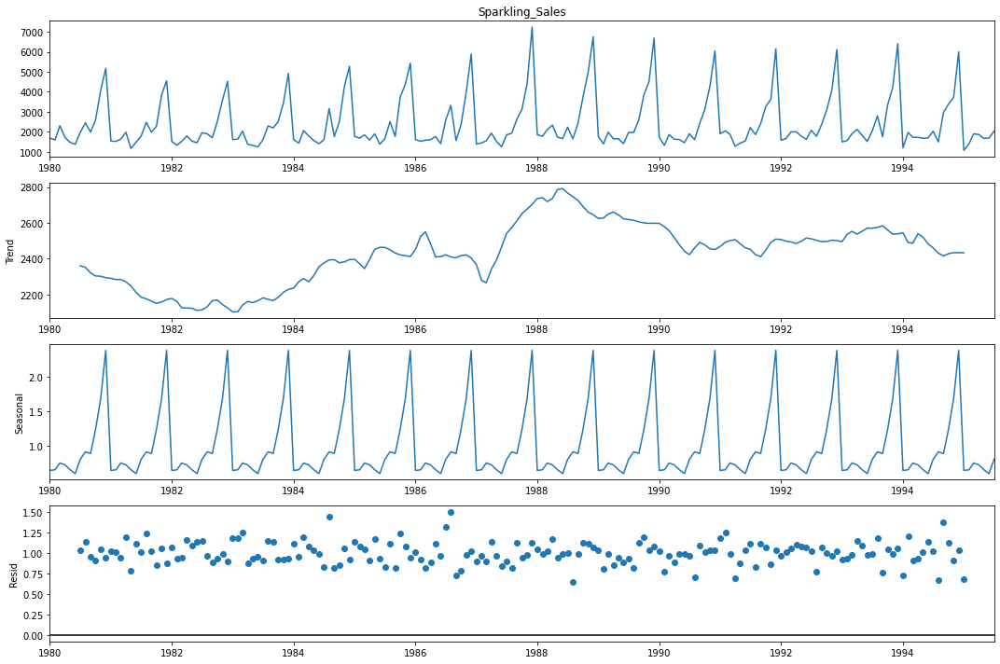

In [ ]:
plt.rcParams['figure.figsize'] = [15, 10] 
sparkling_mul_decomposition=seasonal_decompose(sparkling['Sparkling_Sales'],model='multiplicative', period=12)
sparkling_mul_decomposition.plot();

### **Rose**



#### **Additive Decomposition**

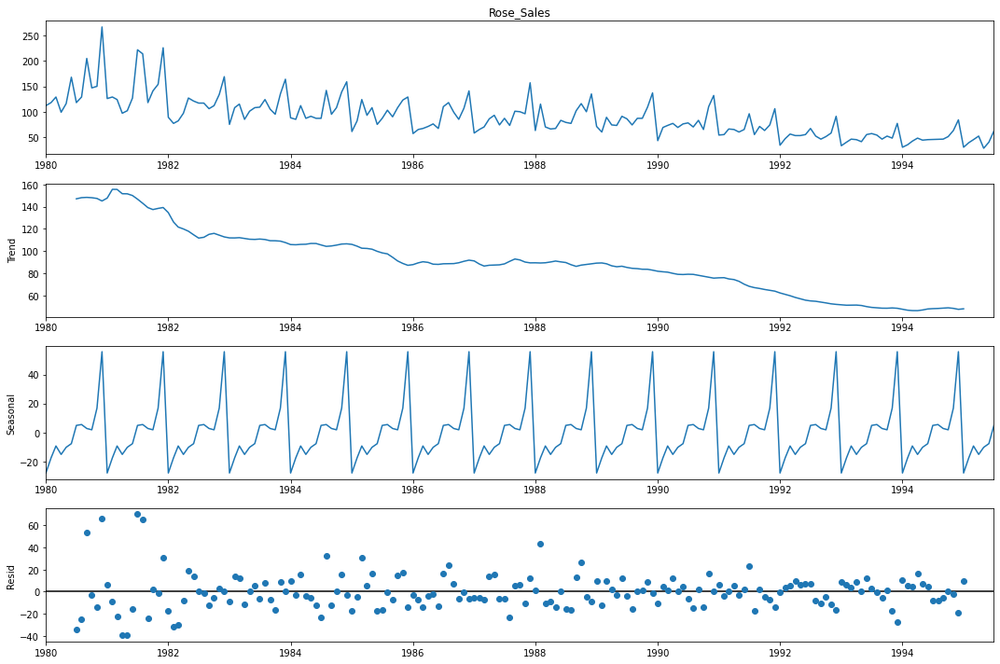

In [ ]:
plt.rcParams['figure.figsize'] = [15, 10] 
rose_add_decomposition=seasonal_decompose(rose['Rose_Sales'],model='additive', period=12)
rose_add_decomposition.plot();

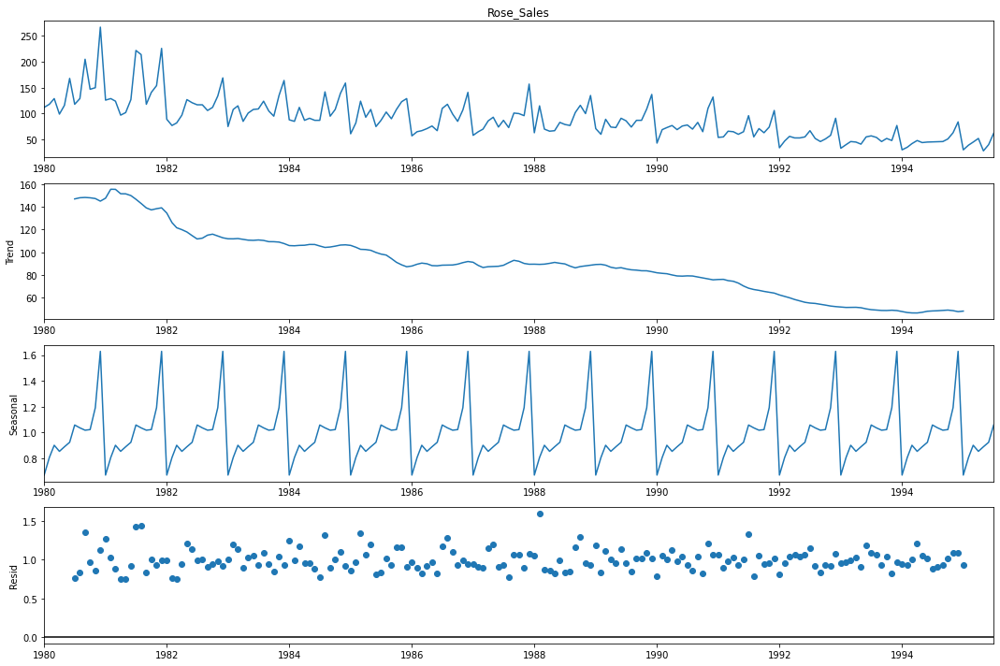

In [ ]:
plt.rcParams['figure.figsize'] = [15, 10] 
rose_mul_decomposition=seasonal_decompose(rose['Rose_Sales'],model='multiplicative', period=12)
rose_mul_decomposition.plot();

Here seasonality is additive

## **3. Split the data into training and test. The test data should start in 1991**

In [ ]:
sparkling_train=sparkling[sparkling.index.year<1991]['Sparkling_Sales']
sparkling_test=sparkling[sparkling.index.year>1990]['Sparkling_Sales']

In [ ]:
print('The shape of the Sparkling train set is:', sparkling_train.shape)
print('The shape of the Sparkling test set is:', sparkling_test.shape)

The shape of the Sparkling train set is: (132,)
The shape of the Sparkling test set is: (55,)


In [ ]:
sparkling_train.head()

YearMonth
1980-01-01    1686
1980-02-01    1591
1980-03-01    2304
1980-04-01    1712
1980-05-01    1471
Name: Sparkling_Sales, dtype: int64

In [ ]:
sparkling_test.head()

YearMonth
1991-01-01    1902
1991-02-01    2049
1991-03-01    1874
1991-04-01    1279
1991-05-01    1432
Name: Sparkling_Sales, dtype: int64

In [ ]:
rose_train=rose[rose.index.year<1991]['Rose_Sales']
rose_test=rose[rose.index.year>1990]['Rose_Sales']

In [ ]:
print('The shape of the Rose train set is:', rose_train.shape)
print('The shape of the Rose test set is:', rose_test.shape)

The shape of the Rose train set is: (132,)
The shape of the Rose test set is: (55,)


In [ ]:
rose_train.head()

YearMonth
1980-01-01    112.0
1980-02-01    118.0
1980-03-01    129.0
1980-04-01     99.0
1980-05-01    116.0
Name: Rose_Sales, dtype: float64

In [ ]:
rose_test.head()

YearMonth
1991-01-01    54.0
1991-02-01    55.0
1991-03-01    66.0
1991-04-01    65.0
1991-05-01    60.0
Name: Rose_Sales, dtype: float64

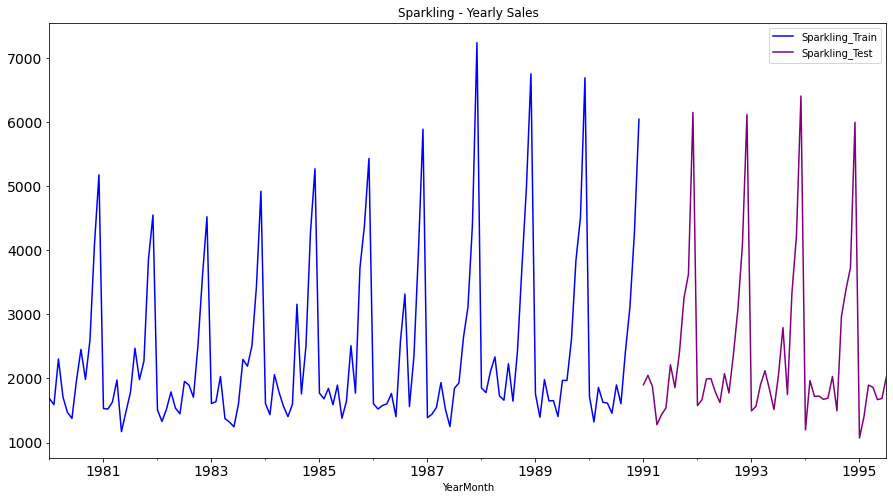

In [ ]:
sparkling_train.plot(figsize=(15,8), title= 'Sparkling - Yearly Sales', fontsize=14,label='Sparkling_Train', color='blue')
sparkling_test.plot(figsize=(15,8), title= 'Sparkling - Yearly Sales', fontsize=14,label='Sparkling_Test', color='purple')
plt.legend()

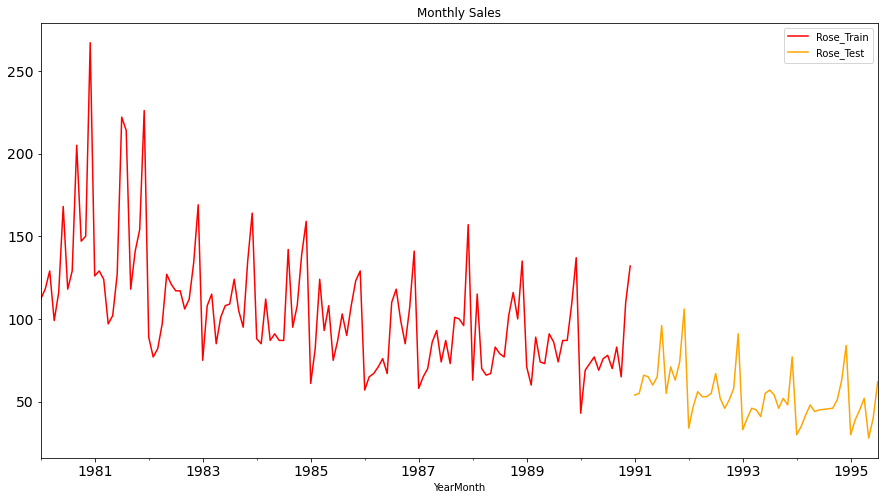

In [ ]:
rose_train.plot(figsize=(15,8), title= 'Monthly Sales', fontsize=14,label='Rose_Train', color='red')
rose_test.plot(figsize=(15,8), title= 'Monthly Sales', fontsize=14,label='Rose_Test', color='orange')
plt.legend()

## **4. Build all the exponential smoothing models on the training data and evaluate the model using RMSE on the test data. Other models such as regression,naïve forecast models and simple average models. should also be built on the training data and check the performance on the test data using RMSE**

## **Function for Accuracy Metrics**

In [ ]:
## Mean Absolute Percentage Error 
def MAPE(y, yhat): 
    y, yhat = np.array(y), np.array(yhat)
    try:
        mape =  round(np.sum(np.abs(yhat - y)) / np.sum(y) * 100,2)
    except:
        print("Observed values are empty")
        mape = np.nan
    return mape

In [ ]:
def calculate_metrics(y,yhat):
    rmse=metrics.mean_squared_error(y,yhat,squared=False)
    mape=MAPE(y,yhat)
    return rmse,mape

## **Model 1: Linear Regression**

#### **Sparkling**

In [ ]:
sparkling_train_time = [i+1 for i in range(len(sparkling_train))]
sparkling_test_time = [i+133 for i in range(len(sparkling_test))]

In [ ]:
sparkling_lr_train=pd.DataFrame(sparkling_train.copy())
sparkling_lr_test=pd.DataFrame(sparkling_test.copy())

In [ ]:
sparkling_lr_train['Time']=sparkling_train_time
sparkling_lr_test['Time']=sparkling_test_time

In [1]:
sparkling_lr=LinearRegression()
sparkling_lr.fit(np.array(sparkling_lr_train['Time']).reshape(-1,1),sparkling_lr_train['Sparkling_Sales'])

NameError: ignored

In [ ]:
sparkling_lr_train['Predict']=sparkling_lr.predict(np.array(sparkling_lr_train['Time']).reshape(-1,1))
sparkling_lr_test['Predict']=sparkling_lr.predict(np.array(sparkling_lr_test['Time']).reshape(-1,1))

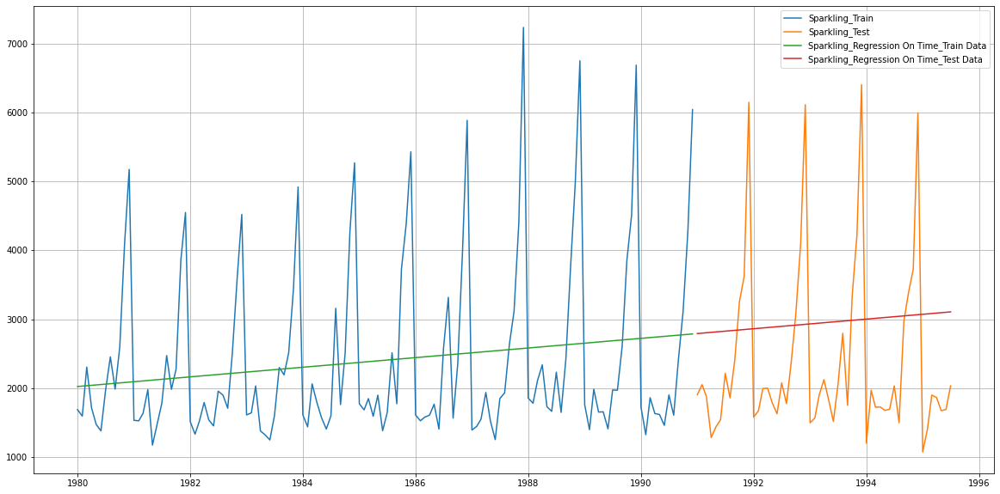

In [ ]:
plt.figure(figsize=(20,10))
plt.plot( sparkling_lr_train['Sparkling_Sales'], label='Sparkling_Train')
plt.plot(sparkling_lr_test['Sparkling_Sales'], label='Sparkling_Test')
plt.plot(sparkling_lr_train['Predict'], label='Sparkling_Regression On Time_Train Data')
plt.plot(sparkling_lr_test['Predict'], label='Sparkling_Regression On Time_Test Data')
plt.legend(loc='best')
plt.grid();

In [ ]:
rmse,mape=calculate_metrics(sparkling_lr_train['Sparkling_Sales'],sparkling_lr_train['Predict'])
sparkling_resultsDf_train = pd.DataFrame({'Train RMSE': [rmse],'Train MAPE': [mape]},index=['Sparkling_RegressionOnTime'])
sparkling_resultsDf_train

,Train RMSE,Train MAPE
Sparkling_RegressionOnTime,1279.322346,40.05


In [ ]:
rmse,mape=calculate_metrics(sparkling_lr_test['Sparkling_Sales'],sparkling_lr_test['Predict'])
sparkling_resultsDf = pd.DataFrame({'Test RMSE': [rmse],'Test MAPE': [mape]},index=['Sparkling_RegressionOnTime'])
sparkling_resultsDf

,Test RMSE,Test MAPE
Sparkling_RegressionOnTime,1389.135175,50.15


#### **Rose**

In [ ]:
rose_train_time = [i+1 for i in range(len(rose_train))]
rose_test_time = [i+133 for i in range(len(rose_test))]

In [ ]:
rose_lr_train=pd.DataFrame(rose_train.copy())
rose_lr_test=pd.DataFrame(rose_test.copy())

In [ ]:
rose_lr_train['Time']=rose_train_time
rose_lr_test['Time']=rose_test_time

In [ ]:
rose_lr=LinearRegression()
rose_lr.fit(np.array(rose_lr_train['Time']).reshape(-1,1),rose_lr_train['Rose_Sales'])

LinearRegression()

In [ ]:
rose_lr_train['Predict']=rose_lr.predict(np.array(rose_lr_train['Time']).reshape(-1,1))
rose_lr_test['Predict']=rose_lr.predict(np.array(rose_lr_test['Time']).reshape(-1,1))

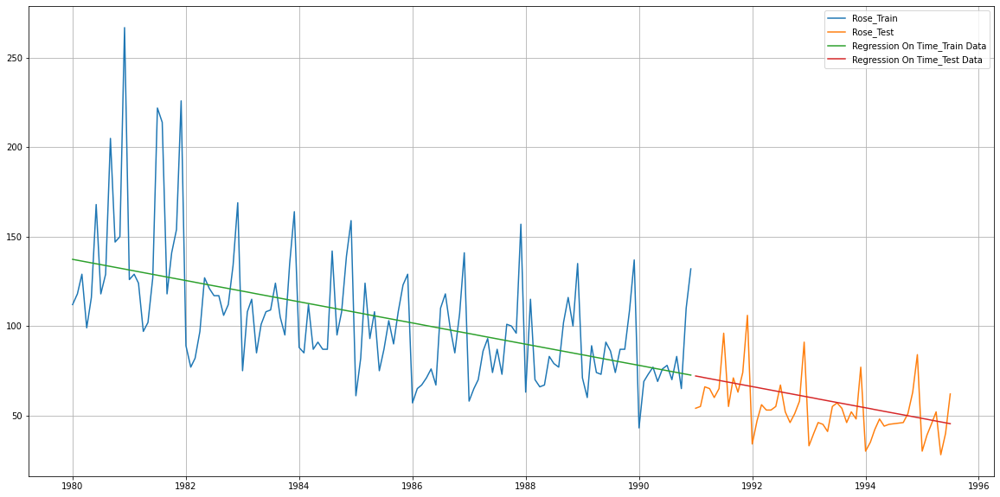

In [ ]:
plt.figure(figsize=(20,10))
plt.plot(rose_lr_train['Rose_Sales'], label='Rose_Train')
plt.plot(rose_lr_test['Rose_Sales'], label='Rose_Test')
plt.plot(rose_lr_train['Predict'], label='Regression On Time_Train Data')
plt.plot(rose_lr_test['Predict'], label='Regression On Time_Test Data')
plt.legend(loc='best')
plt.grid();

In [ ]:
rmse,mape=calculate_metrics(rose_lr_train['Rose_Sales'],rose_lr_train['Predict'])
rose_resultsDf_train = pd.DataFrame({'Train RMSE': [rmse],'Train MAPE': [mape]},index=['Rose_RegressionOnTime'])
rose_resultsDf_train

,Train RMSE,Train MAPE
Rose_RegressionOnTime,30.718135,21.22


In [ ]:
rmse,mape=calculate_metrics(rose_lr_test['Rose_Sales'],rose_lr_test['Predict'])
rose_resultsDf = pd.DataFrame({'Test RMSE': [rmse],'Test MAPE': [mape]},index=['Rose_RegressionOnTime'])
rose_resultsDf

,Test RMSE,Test MAPE
Rose_RegressionOnTime,15.268955,22.82


## **Model 2: Naive Model**

#### **Sparkling**

In [ ]:
sparkling_naive_train = pd.DataFrame(sparkling_train.copy())
sparkling_naive_test = pd.DataFrame(sparkling_test.copy())

In [ ]:
sparkling_naive_train['Predict']=sparkling_train[len(sparkling_train)-1]
sparkling_naive_test['Predict']=sparkling_test[len(sparkling_test)-1]

Text(0.5, 1.0, 'Sparkling - Naive Forecast')

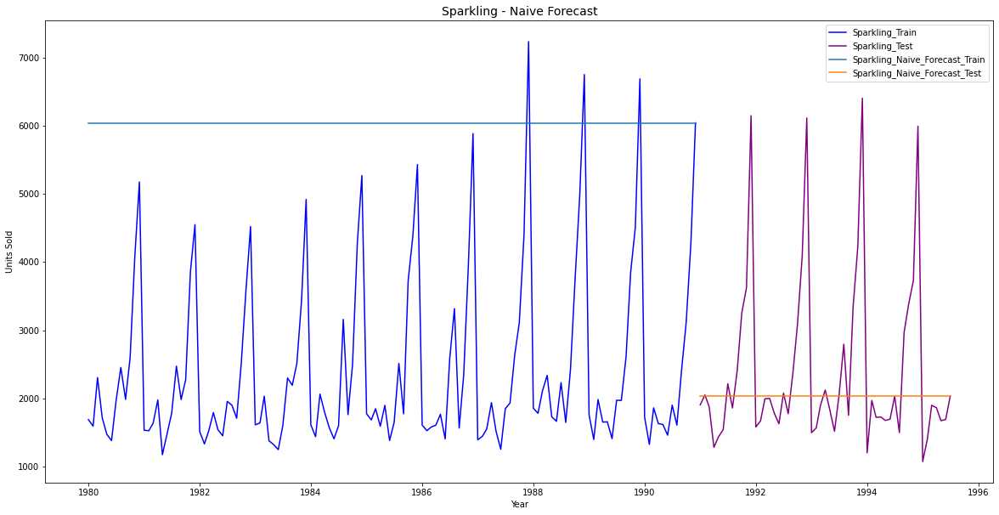

In [ ]:
plt.figure(figsize=(20,10))
plt.plot(sparkling_naive_train['Sparkling_Sales'], label='Sparkling_Train', color = 'blue')
plt.plot(sparkling_naive_test['Sparkling_Sales'], label='Sparkling_Test', color = 'purple')
plt.plot(sparkling_naive_train['Predict'], label='Sparkling_Naive_Forecast_Train')
plt.plot(sparkling_naive_test['Predict'], label='Sparkling_Naive_Forecast_Test')
plt.legend(loc='best')
plt.xlabel('Year')
plt.ylabel('Units Sold')
plt.title("Sparkling - Naive Forecast", fontsize = 14)

In [ ]:
rmse,mape=calculate_metrics(sparkling_naive_train['Sparkling_Sales'],sparkling_naive_train['Predict'])
train_sparkling_tempResultsDf = pd.DataFrame({'Train RMSE': [rmse], 'Train MAPE' : [mape]},index=['Sparkling_Naive'])
train_sparkling_tempResultsDf

,Train RMSE,Train MAPE
Sparkling_Naive,3867.700802,153.17


In [ ]:
rmse,mape=calculate_metrics(sparkling_naive_train['Sparkling_Sales'],sparkling_naive_train['Predict'])
sparkling_tempResultsDf_train = pd.DataFrame({'Train RMSE': [rmse], 'Train MAPE' : [mape]},index=['Sparkling_Naive'])
sparkling_resultsDf_train = pd.concat([sparkling_resultsDf_train, sparkling_tempResultsDf_train])
sparkling_resultsDf_train

,Train RMSE,Train MAPE
Sparkling_RegressionOnTime,1279.322346,40.05
Sparkling_Naive,3867.700802,153.17


In [ ]:
rmse,mape=calculate_metrics(sparkling_naive_test['Sparkling_Sales'],sparkling_naive_test['Predict'])
test_sparkling_tempResultsDf = pd.DataFrame({'Test RMSE': [rmse], 'Test MAPE' : [mape]},index=['Sparkling_Naive'])
test_sparkling_tempResultsDf

,Test RMSE,Test MAPE
Sparkling_Naive,1327.156057,32.9


In [ ]:
rmse,mape=calculate_metrics(sparkling_naive_test['Sparkling_Sales'],sparkling_naive_test['Predict'])
sparkling_tempResultsDf = pd.DataFrame({'Test RMSE': [rmse], 'Test MAPE' : [mape]},index=['Sparkling_Naive'])
sparkling_resultsDf = pd.concat([sparkling_resultsDf, sparkling_tempResultsDf])
sparkling_resultsDf

,Test RMSE,Test MAPE
Sparkling_RegressionOnTime,1389.135175,50.15
Sparkling_Naive,1327.156057,32.90


### **Rose**

In [ ]:
rose_naive_train = pd.DataFrame(rose_train.copy())
rose_naive_test = pd.DataFrame(rose_test.copy())

In [ ]:
rose_naive_train['Predict']=rose_train[len(rose_train)-1]
rose_naive_test['Predict']=rose_test[len(rose_test)-1]

Text(0.5, 1.0, 'Rose - Naive Forecast')

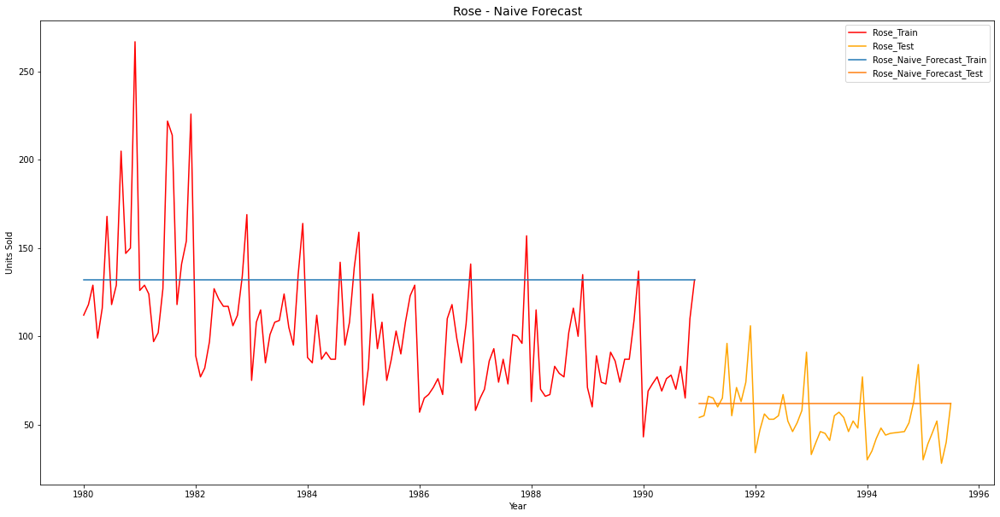

In [ ]:
plt.figure(figsize=(20,10))
plt.plot(rose_naive_train['Rose_Sales'], label='Rose_Train', color = 'red')
plt.plot(rose_naive_test['Rose_Sales'], label='Rose_Test', color = 'orange')
plt.plot(rose_naive_train['Predict'], label='Rose_Naive_Forecast_Train')
plt.plot(rose_naive_test['Predict'], label='Rose_Naive_Forecast_Test')
plt.legend(loc='best')
plt.xlabel('Year')
plt.ylabel('Units Sold')
plt.title("Rose - Naive Forecast", fontsize = 14)

In [ ]:
rmse,mape=calculate_metrics(rose_naive_train['Rose_Sales'],rose_naive_train['Predict'])
rose_tempResultsDf_train = pd.DataFrame({'Train RMSE': [rmse], 'Train MAPE' : [mape]},index=['Rose_Naive'])
rose_resultsDf_train = pd.concat([rose_resultsDf_train, rose_tempResultsDf_train])
rose_resultsDf_train

,Train RMSE,Train MAPE
Rose_RegressionOnTime,30.718135,21.22
Rose_Naive,45.063760,36.38


In [ ]:
rmse,mape=calculate_metrics(rose_naive_train['Rose_Sales'],rose_naive_train['Predict'])
train_rose_tempResultsDf = pd.DataFrame({'Train RMSE': [rmse], 'Train MAPE' : [mape]},index=['Rose_Naive'])
train_rose_tempResultsDf

,Train RMSE,Train MAPE
Rose_Naive,45.06376,36.38


In [ ]:
rmse,mape=calculate_metrics(rose_naive_test['Rose_Sales'],rose_naive_test['Predict'])
rose_tempResultsDf = pd.DataFrame({'Test RMSE': [rmse], 'Test MAPE' : [mape]},index=['Rose_Naive'])
rose_resultsDf = pd.concat([rose_resultsDf, rose_tempResultsDf])
rose_resultsDf

,Test RMSE,Test MAPE
Rose_RegressionOnTime,15.268955,22.82
Rose_Naive,17.740327,27.41


In [ ]:
rmse,mape=calculate_metrics(rose_naive_test['Rose_Sales'],rose_naive_test['Predict'])
test_rose_tempResultsDf = pd.DataFrame({'Test RMSE': [rmse], 'Test MAPE' : [mape]},index=['Rose_Naive'])
rose_tempResultsDf

,Test RMSE,Test MAPE
Rose_Naive,17.740327,27.41


## **Model 3 : Simple Average**

### **Sparkling**

In [ ]:
sparkling_simple_avg_train=pd.DataFrame(sparkling_train.copy())
sparkling_simple_avg_test=pd.DataFrame(sparkling_test.copy())
sparkling_simple_avg_train['Predict'] = sparkling_train.mean()
sparkling_simple_avg_test['Predict'] = sparkling_test.mean()

Text(0.5, 1.0, 'Sparkling - Simple Average Forecast')

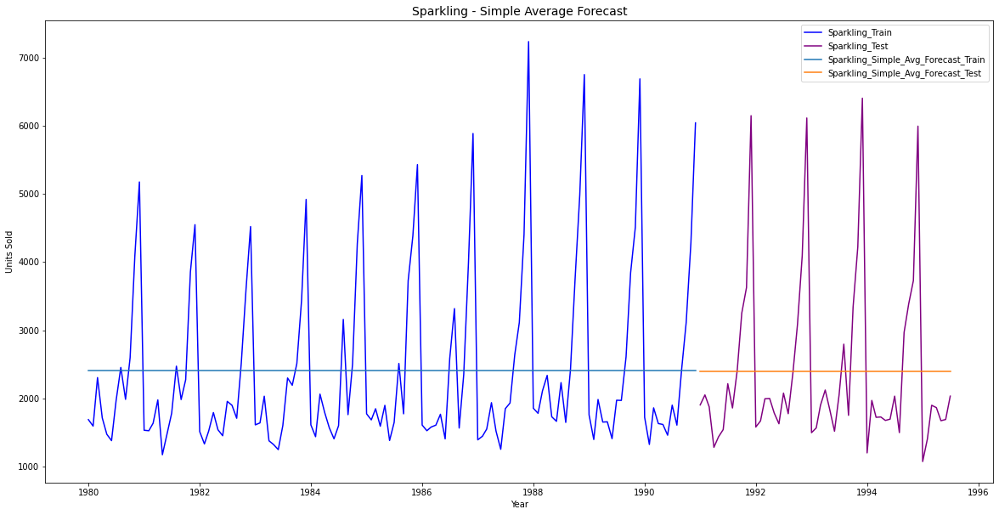

In [ ]:
plt.figure(figsize=(20,10))
plt.plot(sparkling_simple_avg_train['Sparkling_Sales'], label='Sparkling_Train', color = 'blue')
plt.plot(sparkling_simple_avg_test['Sparkling_Sales'], label='Sparkling_Test', color = 'purple')
plt.plot(sparkling_simple_avg_train['Predict'], label='Sparkling_Simple_Avg_Forecast_Train')
plt.plot(sparkling_simple_avg_test['Predict'], label='Sparkling_Simple_Avg_Forecast_Test')
plt.legend(loc='best')
plt.xlabel('Year')
plt.ylabel('Units Sold')
plt.title("Sparkling - Simple Average Forecast", fontsize = 14)

In [ ]:
rmse,mape=calculate_metrics(sparkling_simple_avg_train['Sparkling_Sales'],sparkling_simple_avg_train['Predict'])
sparkling_tempResultsDf_train = pd.DataFrame({'Train RMSE': [rmse], 'Train MAPE' : [mape]},index=['Sparkling_Simple_Average'])
sparkling_resultsDf_train = pd.concat([sparkling_resultsDf_train, sparkling_tempResultsDf_train])
sparkling_resultsDf_train

,Train RMSE,Train MAPE
Sparkling_RegressionOnTime,1279.322346,40.05
Sparkling_Naive,3867.700802,153.17
Sparkling_Simple_Average,1298.483628,40.36


In [ ]:
rmse,mape=calculate_metrics(sparkling_simple_avg_train['Sparkling_Sales'],sparkling_simple_avg_train['Predict'])
train_sparkling_tempResultsDf = pd.DataFrame({'Train RMSE': [rmse], 'Train MAPE' : [mape]},index=['Sparkling_Simple_Average'])
train_sparkling_tempResultsDf

,Train RMSE,Train MAPE
Sparkling_Simple_Average,1298.483628,40.36


In [ ]:
rmse,mape=calculate_metrics(sparkling_simple_avg_test['Sparkling_Sales'],sparkling_simple_avg_test['Predict'])
sparkling_tempResultsDf = pd.DataFrame({'Test RMSE': [rmse], 'Test MAPE' : [mape]},index=['Sparkling_Simple_Average'])
sparkling_resultsDf = pd.concat([sparkling_resultsDf, sparkling_tempResultsDf])
sparkling_resultsDf

,Test RMSE,Test MAPE
Sparkling_RegressionOnTime,1389.135175,50.15
Sparkling_Naive,1327.156057,32.90
Sparkling_Simple_Average,1275.073380,38.81


In [ ]:
rmse,mape=calculate_metrics(sparkling_simple_avg_test['Sparkling_Sales'],sparkling_simple_avg_test['Predict'])
test_sparkling_tempResultsDf = pd.DataFrame({'Test RMSE': [rmse], 'Test MAPE' : [mape]},index=['Sparkling_Simple_Average'])
test_sparkling_tempResultsDf

,Test RMSE,Test MAPE
Sparkling_Simple_Average,1275.07338,38.81


### **Rose**

In [ ]:
rose_simple_avg_train=pd.DataFrame(rose_train.copy())
rose_simple_avg_test=pd.DataFrame(rose_test.copy())
rose_simple_avg_train['Predict'] = rose_train.mean()
rose_simple_avg_test['Predict'] = rose_test.mean()

Text(0.5, 1.0, 'Rose - Simple Average Forecast')

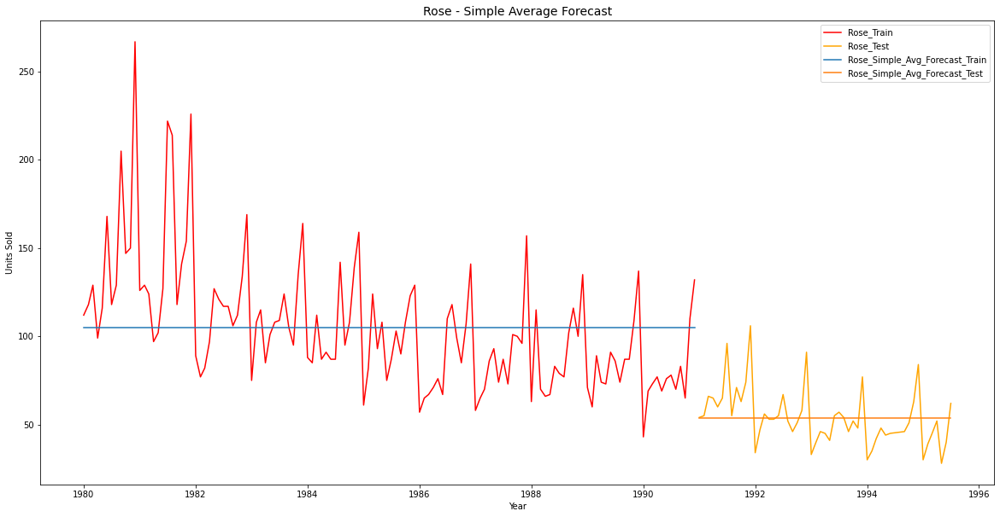

In [ ]:
plt.figure(figsize=(20,10))
plt.plot(rose_simple_avg_train['Rose_Sales'], label='Rose_Train', color = 'red')
plt.plot(rose_simple_avg_test['Rose_Sales'], label='Rose_Test', color = 'orange')
plt.plot(rose_simple_avg_train['Predict'], label='Rose_Simple_Avg_Forecast_Train')
plt.plot(rose_simple_avg_test['Predict'], label='Rose_Simple_Avg_Forecast_Test')
plt.legend(loc='best')
plt.xlabel('Year')
plt.ylabel('Units Sold')
plt.title("Rose - Simple Average Forecast", fontsize = 14)

In [ ]:
rmse,mape=calculate_metrics(rose_simple_avg_train['Rose_Sales'],rose_simple_avg_train['Predict'])
rose_tempResultsDf_train = pd.DataFrame({'Train RMSE': [rmse], 'Train MAPE' : [mape]},index=['Rose_Simple_Average'])
rose_resultsDf_train = pd.concat([rose_resultsDf_train, rose_tempResultsDf_train])
rose_resultsDf_train

,Train RMSE,Train MAPE
Rose_RegressionOnTime,30.718135,21.22
Rose_Naive,45.063760,36.38
Rose_Simple_Average,36.034234,25.39


In [ ]:
rmse,mape=calculate_metrics(rose_simple_avg_test['Rose_Sales'],rose_simple_avg_test['Predict'])
rose_tempResultsDf = pd.DataFrame({'Test RMSE': [rmse], 'Test MAPE' : [mape]},index=['Rose_Simple_Average'])
rose_resultsDf = pd.concat([rose_resultsDf, rose_tempResultsDf])
rose_resultsDf

,Test RMSE,Test MAPE
Rose_RegressionOnTime,15.268955,22.82
Rose_Naive,17.740327,27.41
Rose_Simple_Average,15.759783,21.37


## **Model 4: Moving Average**

### **Sparkling**

In [ ]:
sparkling_MovingAverage = sparkling.copy()
sparkling_MovingAverage['Trailing_2'] = sparkling_MovingAverage['Sparkling_Sales'].rolling(2).mean()
sparkling_MovingAverage['Trailing_3'] = sparkling_MovingAverage['Sparkling_Sales'].rolling(4).mean()
sparkling_MovingAverage['Trailing_6'] = sparkling_MovingAverage['Sparkling_Sales'].rolling(6).mean()
sparkling_MovingAverage['Trailing_9'] = sparkling_MovingAverage['Sparkling_Sales'].rolling(9).mean()

sparkling_MovingAverage.tail()

,Sparkling_Sales,Trailing_2,Trailing_3,Trailing_6,Trailing_9
YearMonth,,,,,
1995-03-01,1897,1649.5,2592.00,2913.666667,2664.000000
1995-04-01,1862,1879.5,1557.75,2659.833333,2645.222222
1995-05-01,1670,1766.0,1707.75,2316.666667,2664.666667
1995-06-01,1688,1679.0,1779.25,1598.166667,2522.444444
1995-07-01,2031,1859.5,1812.75,1758.333333,2372.000000


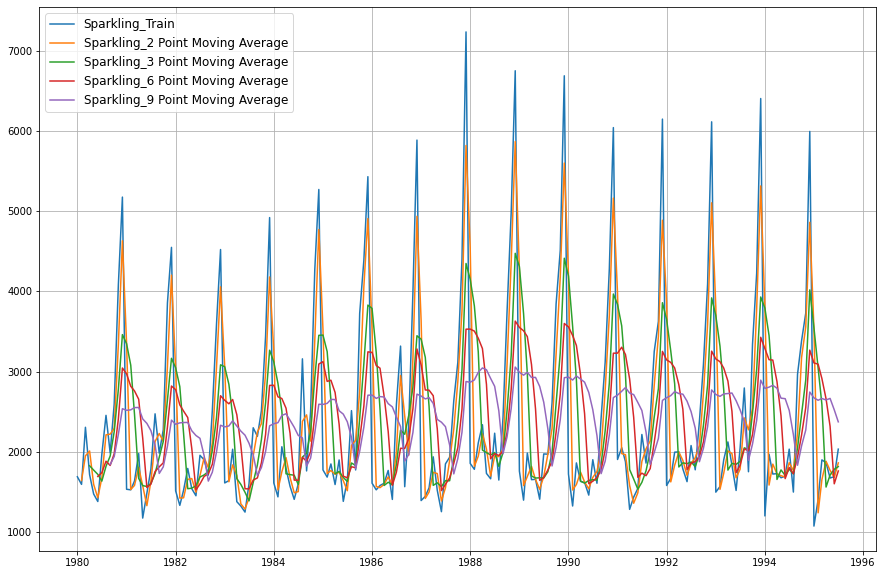

In [ ]:
plt.figure(figsize=(15,10))
plt.plot(sparkling_MovingAverage['Sparkling_Sales'], label='Sparkling_Train')
plt.plot(sparkling_MovingAverage['Trailing_2'], label='Sparkling_2 Point Moving Average')
plt.plot(sparkling_MovingAverage['Trailing_3'], label='Sparkling_3 Point Moving Average')
plt.plot(sparkling_MovingAverage['Trailing_6'],label = 'Sparkling_6 Point Moving Average')
plt.plot(sparkling_MovingAverage['Trailing_9'],label = 'Sparkling_9 Point Moving Average')
plt.legend(loc = 'best',fontsize=12)
plt.grid();

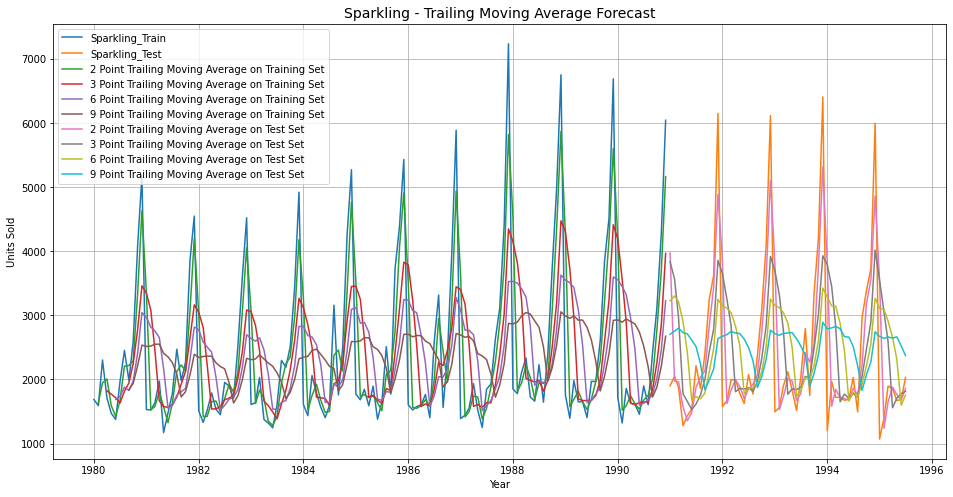

In [ ]:
sparkling_trailing_MovingAverage_train=sparkling_MovingAverage[sparkling_MovingAverage.index.year<1991]
sparkling_trailing_MovingAverage_test=sparkling_MovingAverage[sparkling_MovingAverage.index.year>1990]

## Plotting on both the Training and Test data

plt.figure(figsize=(16,8))
plt.plot(sparkling_trailing_MovingAverage_train['Sparkling_Sales'], label='Sparkling_Train')
plt.plot(sparkling_trailing_MovingAverage_test['Sparkling_Sales'], label='Sparkling_Test')

plt.plot(sparkling_trailing_MovingAverage_train['Trailing_2'], label='2 Point Trailing Moving Average on Training Set')
plt.plot(sparkling_trailing_MovingAverage_train['Trailing_3'], label='3 Point Trailing Moving Average on Training Set')
plt.plot(sparkling_trailing_MovingAverage_train['Trailing_6'],label = '6 Point Trailing Moving Average on Training Set')
plt.plot(sparkling_trailing_MovingAverage_train['Trailing_9'],label = '9 Point Trailing Moving Average on Training Set')

plt.plot(sparkling_trailing_MovingAverage_test['Trailing_2'], label='2 Point Trailing Moving Average on Test Set')
plt.plot(sparkling_trailing_MovingAverage_test['Trailing_3'], label='3 Point Trailing Moving Average on Test Set')
plt.plot(sparkling_trailing_MovingAverage_test['Trailing_6'],label = '6 Point Trailing Moving Average on Test Set')
plt.plot(sparkling_trailing_MovingAverage_test['Trailing_9'],label = '9 Point Trailing Moving Average on Test Set')
plt.title('Sparkling - Trailing Moving Average Forecast',fontsize=14)
plt.legend(loc = 'best')
plt.xlabel('Year')
plt.ylabel('Units Sold')
plt.grid();

In [ ]:
rmse,mape=calculate_metrics(sparkling_trailing_MovingAverage_test['Sparkling_Sales'],sparkling_trailing_MovingAverage_test['Trailing_2'])
sparkling_tempResultsDf = pd.DataFrame({'Test RMSE': [rmse], 'Test MAPE' : [mape]},index=['Sparkling_Trailing_MA_2'])
sparkling_resultsDf = pd.concat([sparkling_resultsDf, sparkling_tempResultsDf])
sparkling_resultsDf

,Test RMSE,Test MAPE
Sparkling_RegressionOnTime,1389.135175,50.15
Sparkling_Naive,1327.156057,32.90
Sparkling_Simple_Average,1275.073380,38.81
Sparkling_Trailing_MA_2,813.400684,19.70


In [ ]:
rmse,mape=calculate_metrics(sparkling_trailing_MovingAverage_test['Sparkling_Sales'],sparkling_trailing_MovingAverage_test['Trailing_3'])
sparkling_tempResultsDf = pd.DataFrame({'Test RMSE': [rmse], 'Test MAPE' : [mape]},index=['Sparkling_Trailing_MA_3'])
sparkling_resultsDf = pd.concat([sparkling_resultsDf, sparkling_tempResultsDf])
sparkling_resultsDf

,Test RMSE,Test MAPE
Sparkling_RegressionOnTime,1389.135175,50.15
Sparkling_Naive,1327.156057,32.90
Sparkling_Simple_Average,1275.073380,38.81
Sparkling_Trailing_MA_2,813.400684,19.70
Sparkling_Trailing_MA_3,1156.589694,35.96


In [ ]:
rmse,mape=calculate_metrics(sparkling_trailing_MovingAverage_test['Sparkling_Sales'],sparkling_trailing_MovingAverage_test['Trailing_6'])
sparkling_tempResultsDf = pd.DataFrame({'Test RMSE': [rmse], 'Test MAPE' : [mape]},index=['Sparkling_Trailing_MA_6'])
sparkling_resultsDf = pd.concat([sparkling_resultsDf, sparkling_tempResultsDf])
sparkling_resultsDf

,Test RMSE,Test MAPE
Sparkling_RegressionOnTime,1389.135175,50.15
Sparkling_Naive,1327.156057,32.90
Sparkling_Simple_Average,1275.073380,38.81
Sparkling_Trailing_MA_2,813.400684,19.70
Sparkling_Trailing_MA_3,1156.589694,35.96
Sparkling_Trailing_MA_6,1283.927428,43.86


In [ ]:
rmse,mape=calculate_metrics(sparkling_trailing_MovingAverage_test['Sparkling_Sales'],sparkling_trailing_MovingAverage_test['Trailing_9'])
sparkling_tempResultsDf = pd.DataFrame({'Test RMSE': [rmse], 'Test MAPE' : [mape]},index=['Sparkling_Trailing_MA_9'])
sparkling_resultsDf = pd.concat([sparkling_resultsDf, sparkling_tempResultsDf])
sparkling_resultsDf

,Test RMSE,Test MAPE
Sparkling_RegressionOnTime,1389.135175,50.15
Sparkling_Naive,1327.156057,32.90
Sparkling_Simple_Average,1275.073380,38.81
Sparkling_Trailing_MA_2,813.400684,19.70
Sparkling_Trailing_MA_3,1156.589694,35.96
Sparkling_Trailing_MA_6,1283.927428,43.86
Sparkling_Trailing_MA_9,1346.278315,46.86


In [ ]:
sparkling_resultsDf.iloc[3:]

,Test RMSE,Test MAPE
Sparkling_Trailing_MA_2,813.400684,19.70
Sparkling_Trailing_MA_3,1156.589694,35.96
Sparkling_Trailing_MA_6,1283.927428,43.86
Sparkling_Trailing_MA_9,1346.278315,46.86


In [ ]:
sparkling_resultsDf.sort_values('Test RMSE')

,Test RMSE,Test MAPE
Sparkling_Trailing_MA_2,813.400684,19.70
Sparkling_Trailing_MA_3,1156.589694,35.96
Sparkling_Simple_Average,1275.073380,38.81
Sparkling_Trailing_MA_6,1283.927428,43.86
Sparkling_Naive,1327.156057,32.90
Sparkling_Trailing_MA_9,1346.278315,46.86
Sparkling_RegressionOnTime,1389.135175,50.15


### **Rose**

In [ ]:
rose_MovingAverage = rose.copy()
rose_MovingAverage['Trailing_2'] = rose_MovingAverage['Rose_Sales'].rolling(2).mean()
rose_MovingAverage['Trailing_3'] = rose_MovingAverage['Rose_Sales'].rolling(4).mean()
rose_MovingAverage['Trailing_6'] = rose_MovingAverage['Rose_Sales'].rolling(6).mean()
rose_MovingAverage['Trailing_9'] = rose_MovingAverage['Rose_Sales'].rolling(9).mean()

rose_MovingAverage.tail()

,Rose_Sales,Trailing_2,Trailing_3,Trailing_6,Trailing_9
YearMonth,,,,,
1995-03-01,45.0,42.0,49.50,52.000000,49.888889
1995-04-01,52.0,48.5,41.50,52.166667,50.629630
1995-05-01,28.0,40.0,41.00,46.333333,48.666667
1995-06-01,40.0,34.0,41.25,39.000000,48.000000
1995-07-01,62.0,51.0,45.50,44.333333,49.222222


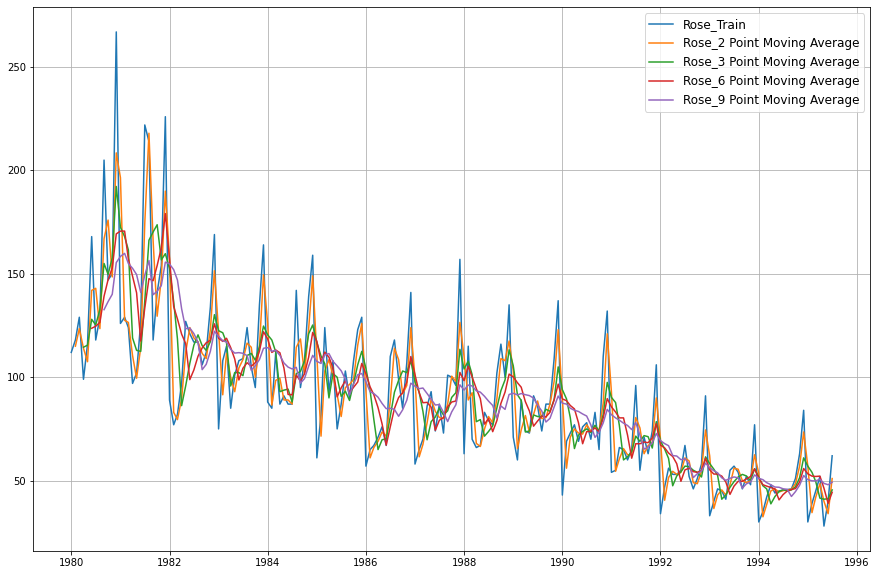

In [ ]:
plt.figure(figsize=(15,10))
plt.plot(rose_MovingAverage['Rose_Sales'], label='Rose_Train')
plt.plot(rose_MovingAverage['Trailing_2'], label='Rose_2 Point Moving Average')
plt.plot(rose_MovingAverage['Trailing_3'], label='Rose_3 Point Moving Average')
plt.plot(rose_MovingAverage['Trailing_6'],label = 'Rose_6 Point Moving Average')
plt.plot(rose_MovingAverage['Trailing_9'],label = 'Rose_9 Point Moving Average')
plt.legend(loc = 'best',fontsize=12)
plt.grid();

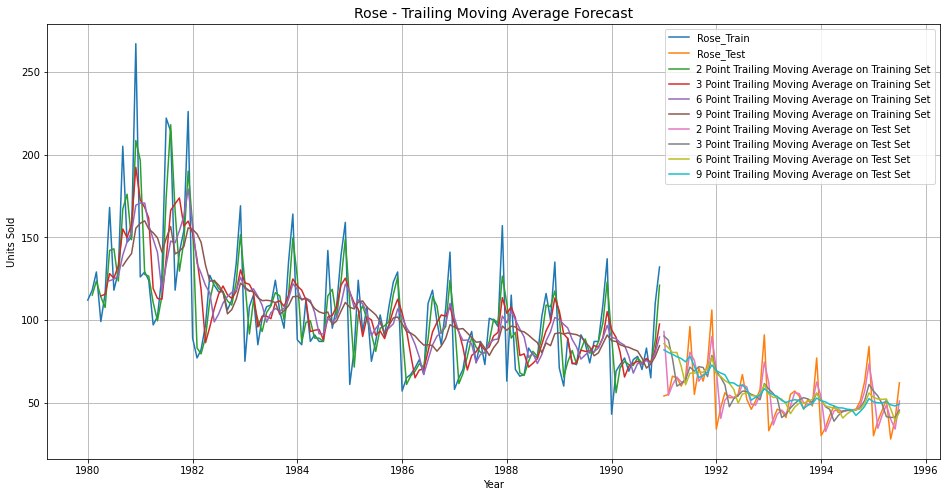

In [ ]:
rose_trailing_MovingAverage_train=rose_MovingAverage[rose_MovingAverage.index.year<1991]
rose_trailing_MovingAverage_test=rose_MovingAverage[rose_MovingAverage.index.year>1990]

## Plotting on both the Training and Test data

plt.figure(figsize=(16,8))
plt.plot(rose_trailing_MovingAverage_train['Rose_Sales'], label='Rose_Train')
plt.plot(rose_trailing_MovingAverage_test['Rose_Sales'], label='Rose_Test')

plt.plot(rose_trailing_MovingAverage_train['Trailing_2'], label='2 Point Trailing Moving Average on Training Set')
plt.plot(rose_trailing_MovingAverage_train['Trailing_3'], label='3 Point Trailing Moving Average on Training Set')
plt.plot(rose_trailing_MovingAverage_train['Trailing_6'],label = '6 Point Trailing Moving Average on Training Set')
plt.plot(rose_trailing_MovingAverage_train['Trailing_9'],label = '9 Point Trailing Moving Average on Training Set')

plt.plot(rose_trailing_MovingAverage_test['Trailing_2'], label='2 Point Trailing Moving Average on Test Set')
plt.plot(rose_trailing_MovingAverage_test['Trailing_3'], label='3 Point Trailing Moving Average on Test Set')
plt.plot(rose_trailing_MovingAverage_test['Trailing_6'],label = '6 Point Trailing Moving Average on Test Set')
plt.plot(rose_trailing_MovingAverage_test['Trailing_9'],label = '9 Point Trailing Moving Average on Test Set')
plt.title('Rose - Trailing Moving Average Forecast',fontsize=14)
plt.legend(loc = 'best')
plt.xlabel('Year')
plt.ylabel('Units Sold')
plt.grid();

In [ ]:
rmse,mape=calculate_metrics(rose_trailing_MovingAverage_test['Rose_Sales'],rose_trailing_MovingAverage_test['Trailing_2'])
rose_tempResultsDf = pd.DataFrame({'Test RMSE': [rmse], 'Test MAPE' : [mape]},index=['Rose_Trailing_MA_2'])
rose_resultsDf = pd.concat([rose_resultsDf, rose_tempResultsDf])
rose_resultsDf

,Test RMSE,Test MAPE
Rose_RegressionOnTime,15.268955,22.82
Rose_Naive,17.740327,27.41
Rose_Simple_Average,15.759783,21.37
Rose_Trailing_MA_2,11.529278,13.54


In [ ]:
rmse,mape=calculate_metrics(rose_trailing_MovingAverage_test['Rose_Sales'],rose_trailing_MovingAverage_test['Trailing_3'])
rose_tempResultsDf = pd.DataFrame({'Test RMSE': [rmse], 'Test MAPE' : [mape]},index=['Rose_Trailing_MA_3'])
rose_resultsDf = pd.concat([rose_resultsDf, rose_tempResultsDf])
rose_resultsDf

,Test RMSE,Test MAPE
Rose_RegressionOnTime,15.268955,22.82
Rose_Naive,17.740327,27.41
Rose_Simple_Average,15.759783,21.37
Rose_Trailing_MA_2,11.529278,13.54
Rose_Trailing_MA_3,14.451403,19.49


In [ ]:
rmse,mape=calculate_metrics(rose_trailing_MovingAverage_test['Rose_Sales'],rose_trailing_MovingAverage_test['Trailing_6'])
rose_tempResultsDf = pd.DataFrame({'Test RMSE': [rmse], 'Test MAPE' : [mape]},index=['Rose_Trailing_MA_6'])
rose_resultsDf = pd.concat([rose_resultsDf, rose_tempResultsDf])
rose_resultsDf

,Test RMSE,Test MAPE
Rose_RegressionOnTime,15.268955,22.82
Rose_Naive,17.740327,27.41
Rose_Simple_Average,15.759783,21.37
Rose_Trailing_MA_2,11.529278,13.54
Rose_Trailing_MA_3,14.451403,19.49
Rose_Trailing_MA_6,14.566327,20.82


In [ ]:
rmse,mape=calculate_metrics(rose_trailing_MovingAverage_test['Rose_Sales'],rose_trailing_MovingAverage_test['Trailing_9'])
rose_tempResultsDf = pd.DataFrame({'Test RMSE': [rmse], 'Test MAPE' : [mape]},index=['Rose_Trailing_MA_9'])
rose_resultsDf = pd.concat([rose_resultsDf, rose_tempResultsDf])
rose_resultsDf

,Test RMSE,Test MAPE
Rose_RegressionOnTime,15.268955,22.82
Rose_Naive,17.740327,27.41
Rose_Simple_Average,15.759783,21.37
Rose_Trailing_MA_2,11.529278,13.54
Rose_Trailing_MA_3,14.451403,19.49
Rose_Trailing_MA_6,14.566327,20.82
Rose_Trailing_MA_9,14.727630,21.01


In [ ]:
rose_resultsDf.iloc[3:]

,Test RMSE,Test MAPE
Rose_Trailing_MA_2,11.529278,13.54
Rose_Trailing_MA_3,14.451403,19.49
Rose_Trailing_MA_6,14.566327,20.82
Rose_Trailing_MA_9,14.727630,21.01


In [ ]:
rose_resultsDf.sort_values('Test RMSE')

,Test RMSE,Test MAPE
Rose_Trailing_MA_2,11.529278,13.54
Rose_Trailing_MA_3,14.451403,19.49
Rose_Trailing_MA_6,14.566327,20.82
Rose_Trailing_MA_9,14.727630,21.01
Rose_RegressionOnTime,15.268955,22.82
Rose_Simple_Average,15.759783,21.37
Rose_Naive,17.740327,27.41


## **Compare Various Time Series Plots**

### **Sparkling**

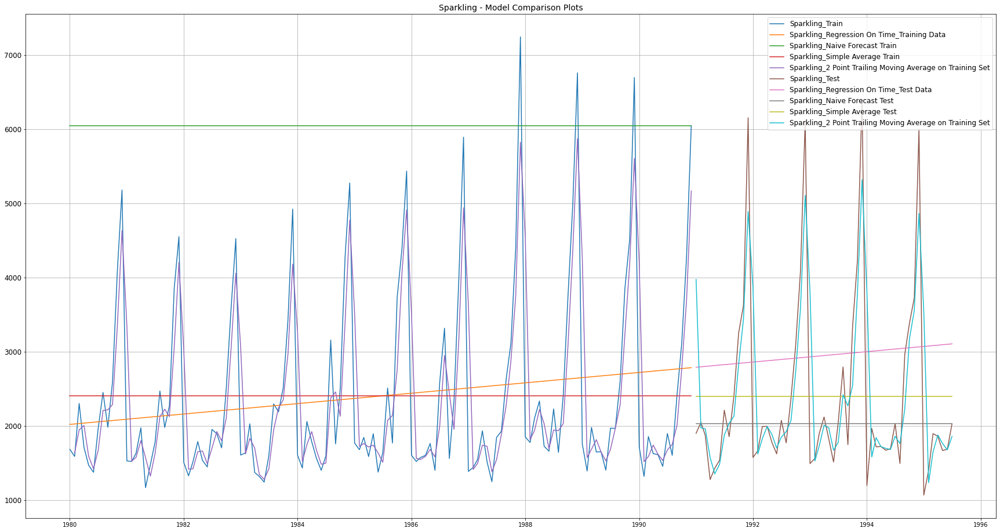

In [ ]:
## Plotting on both Training and Test data

plt.figure(figsize=(30,16))
plt.plot(sparkling_train, label='Sparkling_Train')


plt.plot(sparkling_lr_train['Predict'], label='Sparkling_Regression On Time_Training Data')
plt.plot(sparkling_naive_train.index,sparkling_naive_train['Predict'], label='Sparkling_Naive Forecast Train')
plt.plot(sparkling_simple_avg_train.index,sparkling_simple_avg_train['Predict'], label='Sparkling_Simple Average Train')
plt.plot(sparkling_trailing_MovingAverage_train['Trailing_2'], label='Sparkling_2 Point Trailing Moving Average on Training Set')

plt.plot(sparkling_test, label='Sparkling_Test')

plt.plot(sparkling_lr_test['Predict'], label='Sparkling_Regression On Time_Test Data')
plt.plot(sparkling_naive_test.index,sparkling_naive_test['Predict'], label='Sparkling_Naive Forecast Test')
plt.plot(sparkling_simple_avg_test.index,sparkling_simple_avg_test['Predict'], label='Sparkling_Simple Average Test')
plt.plot(sparkling_trailing_MovingAverage_test['Trailing_2'], label='Sparkling_2 Point Trailing Moving Average on Training Set')

plt.legend(loc='best',fontsize=12)
plt.title("Sparkling - Model Comparison Plots",fontsize=14)
plt.yticks(fontsize=12)
plt.grid();

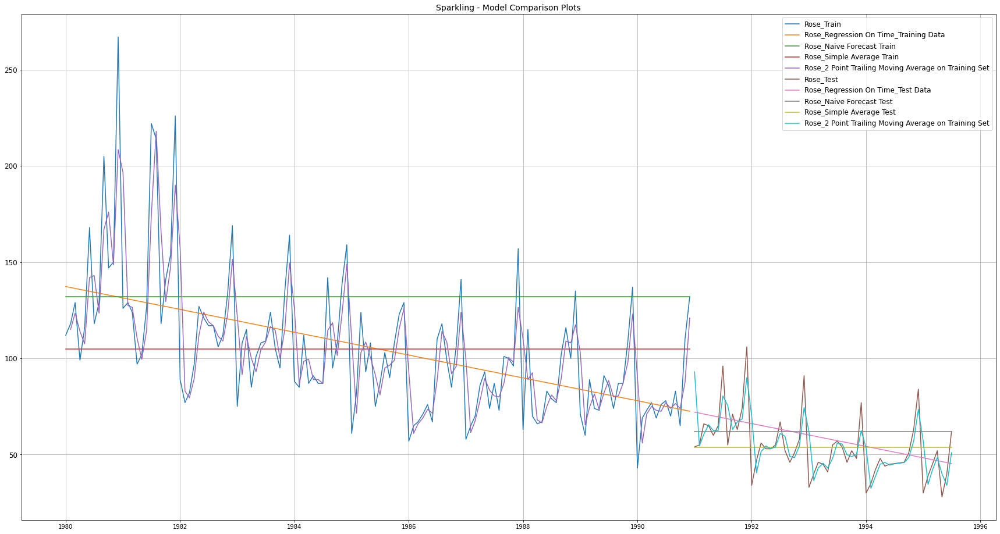

In [ ]:
## Plotting on both Training and Test data

plt.figure(figsize=(30,16))
plt.plot(rose_train, label='Rose_Train')


plt.plot(rose_lr_train['Predict'], label='Rose_Regression On Time_Training Data')
plt.plot(rose_naive_train.index,rose_naive_train['Predict'], label='Rose_Naive Forecast Train')
plt.plot(rose_simple_avg_train.index,rose_simple_avg_train['Predict'], label='Rose_Simple Average Train')
plt.plot(rose_trailing_MovingAverage_train['Trailing_2'], label='Rose_2 Point Trailing Moving Average on Training Set')

plt.plot(rose_test, label='Rose_Test')

plt.plot(rose_lr_test['Predict'], label='Rose_Regression On Time_Test Data')
plt.plot(rose_naive_test.index,rose_naive_test['Predict'], label='Rose_Naive Forecast Test')
plt.plot(rose_simple_avg_test.index,rose_simple_avg_test['Predict'], label='Rose_Simple Average Test')
plt.plot(rose_trailing_MovingAverage_test['Trailing_2'], label='Rose_2 Point Trailing Moving Average on Training Set')

plt.legend(loc='best',fontsize=12)
plt.title("Sparkling - Model Comparison Plots",fontsize=14)
plt.yticks(fontsize=12)
plt.grid();

## **Model 5: Simple Exponential Smoothing**

### **Sparkling**

In [ ]:
sparkling_SES_train = pd.DataFrame(sparkling_train.copy())
sparkling_SES_test = pd.DataFrame(sparkling_test.copy())

In [ ]:
sparkling_model_SES = SimpleExpSmoothing(sparkling_SES_train['Sparkling_Sales'])

In [ ]:
sparkling_model_SES_autofit = sparkling_model_SES.fit(optimized=True,use_brute=True)

In [ ]:
sparkling_model_SES_autofit.params

{'damping_trend': nan,
 'initial_level': 1818.5047538435374,
 'initial_seasons': array([], dtype=float64),
 'initial_trend': nan,
 'lamda': None,
 'remove_bias': False,
 'smoothing_level': 0.04960659880745982,
 'smoothing_seasonal': nan,
 'smoothing_trend': nan,
 'use_boxcox': False}

In [ ]:
sparkling_SES_train['Predict'] = sparkling_model_SES_autofit.fittedvalues
sparkling_SES_train.head()

,Sparkling_Sales,Predict
YearMonth,,
1980-01-01,1686,1818.504754
1980-02-01,1591,1811.931644
1980-03-01,2304,1800.971976
1980-04-01,1712,1825.925486
1980-05-01,1471,1820.274030


In [ ]:
sparkling_SES_test['Predict'] = sparkling_model_SES_autofit.forecast(steps=55)
sparkling_SES_test.head()

,Sparkling_Sales,Predict
YearMonth,,
1991-01-01,1902,2724.929339
1991-02-01,2049,2724.929339
1991-03-01,1874,2724.929339
1991-04-01,1279,2724.929339
1991-05-01,1432,2724.929339


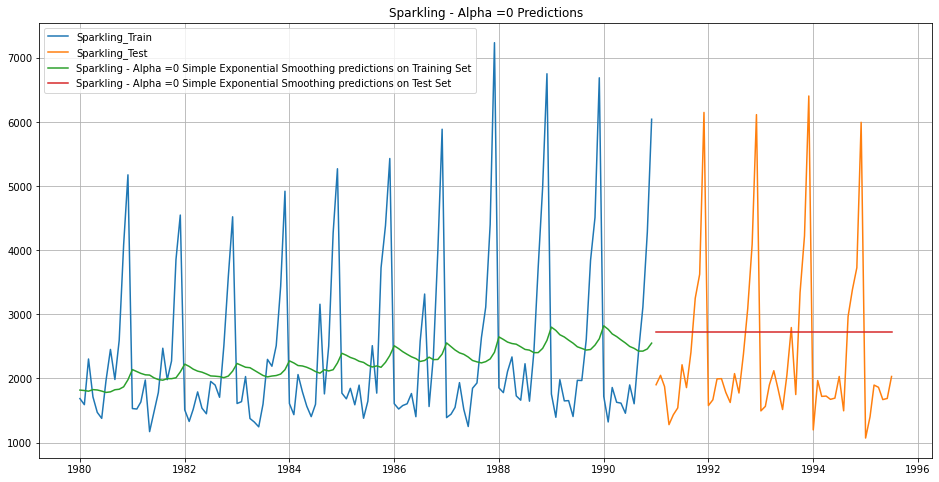

In [ ]:
## Plotting on both the Training and Test data

plt.figure(figsize=(16,8))
plt.plot(sparkling_SES_train['Sparkling_Sales'], label='Sparkling_Train')
plt.plot(sparkling_SES_test['Sparkling_Sales'], label='Sparkling_Test')

plt.plot(sparkling_SES_train['Predict'], label='Sparkling - Alpha =0 Simple Exponential Smoothing predictions on Training Set')
plt.plot(sparkling_SES_test['Predict'], label='Sparkling - Alpha =0 Simple Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Sparkling - Alpha =0 Predictions');

In [ ]:
rmse,mape=calculate_metrics(sparkling_SES_train['Sparkling_Sales'],sparkling_SES_train['Predict'])
sparkling_tempResultsDf_train = pd.DataFrame({'Train RMSE': [rmse], 'Train MAPE' : [mape]},index=['Sparkling_SES Alpha=0'])
sparkling_resultsDf_train = pd.concat([sparkling_resultsDf_train, sparkling_tempResultsDf_train])
sparkling_resultsDf_train

,Train RMSE,Train MAPE
Sparkling_RegressionOnTime,1279.322346,40.05
Sparkling_Naive,3867.700802,153.17
Sparkling_Simple_Average,1298.483628,40.36
Sparkling_SES Alpha=0,1315.232467,39.92


In [ ]:
sparkling_resultsDf_train[3:]

,Train RMSE,Train MAPE
Sparkling_SES Alpha=0,1315.232467,39.92


In [ ]:
rmse,mape=calculate_metrics(sparkling_SES_test['Sparkling_Sales'],sparkling_SES_test['Predict'])
sparkling_tempResultsDf = pd.DataFrame({'Test RMSE': [rmse], 'Test MAPE' : [mape]},index=['Sparkling_SES Alpha=0'])
sparkling_resultsDf = pd.concat([sparkling_resultsDf, sparkling_tempResultsDf])
sparkling_resultsDf

,Test RMSE,Test MAPE
Sparkling_RegressionOnTime,1389.135175,50.15
Sparkling_Naive,1327.156057,32.90
Sparkling_Simple_Average,1275.073380,38.81
Sparkling_Trailing_MA_2,813.400684,19.70
Sparkling_Trailing_MA_3,1156.589694,35.96
Sparkling_Trailing_MA_6,1283.927428,43.86
Sparkling_Trailing_MA_9,1346.278315,46.86
Sparkling_SES Alpha=0,1316.034674,45.47


In [ ]:
sparkling_resultsDf[7:]

,Test RMSE,Test MAPE
Sparkling_SES Alpha=0,1316.034674,45.47


In [ ]:
## First we will define an empty dataframe to store our values from the loop

sparkling_resultsDf_SES = pd.DataFrame({'Alpha Values':[],'Train RMSE':[],'Train MAPE':[]
                                ,'Test RMSE': [],'Test MAPE': []})
sparkling_resultsDf_SES

,Alpha Values,Train RMSE,Train MAPE,Test RMSE,Test MAPE


In [ ]:
for i in np.arange(0,1,0.1):
    sparkling_model_SES_alpha_i = sparkling_model_SES.fit(smoothing_level=i,optimized=True,use_brute=True)
    sparkling_SES_train['Predict',i] = sparkling_model_SES_alpha_i.fittedvalues
    sparkling_SES_test['Predict',i] = sparkling_model_SES_alpha_i.forecast(steps=55)
    
    rmse_SES_train_i = metrics.mean_squared_error(sparkling_SES_train['Sparkling_Sales'],sparkling_SES_train['Predict',i],squared=False)
    mape_SES_train_i = MAPE(sparkling_SES_train['Sparkling_Sales'],sparkling_SES_train['Predict',i])
    
    rmse_SES_test_i = metrics.mean_squared_error(sparkling_SES_test['Sparkling_Sales'],sparkling_SES_test['Predict',i],squared=False)
    mape_SES_test_i = MAPE(sparkling_SES_test['Sparkling_Sales'],sparkling_SES_test['Predict',i])
    
    sparkling_resultsDf_SES = sparkling_resultsDf_SES.append({'Alpha Values':i,'Train RMSE':rmse_SES_train_i 
                                      ,'Train MAPE': mape_SES_train_i,'Test RMSE':rmse_SES_test_i
                                      ,'Test MAPE':mape_SES_test_i}, ignore_index=True)

In [ ]:
sparkling_resultsDf_SES.sort_values('Test RMSE').head()

,Alpha Values,Train RMSE,Train MAPE,Test RMSE,Test MAPE
0,0.0,1298.483628,40.36,1275.081797,38.90
1,0.1,1331.786996,42.30,1375.393526,49.53
2,0.2,1355.645331,43.91,1595.206839,60.46
3,0.3,1359.422161,43.80,1935.507132,75.66
4,0.4,1352.562366,42.79,2311.919615,91.55


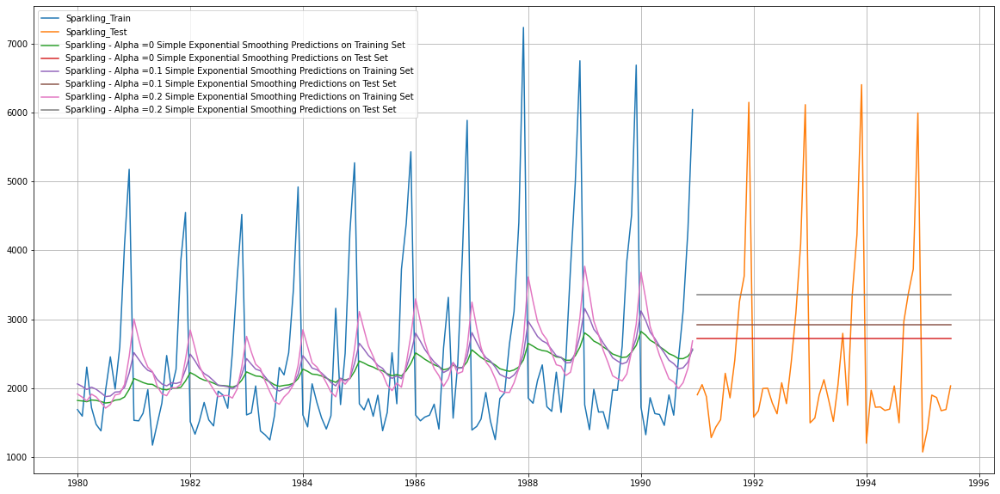

In [ ]:
## Plotting on both the Training and Test data

plt.figure(figsize=(20,10))
plt.plot(sparkling_SES_train['Sparkling_Sales'], label='Sparkling_Train')
plt.plot(sparkling_SES_test['Sparkling_Sales'], label='Sparkling_Test')

plt.plot(sparkling_SES_train['Predict'], label='Sparkling - Alpha =0 Simple Exponential Smoothing Predictions on Training Set')
plt.plot(sparkling_SES_test['Predict'], label='Sparkling - Alpha =0 Simple Exponential Smoothing Predictions on Test Set')

plt.plot(sparkling_SES_train['Predict', 0.1], label='Sparkling - Alpha =0.1 Simple Exponential Smoothing Predictions on Training Set')
plt.plot(sparkling_SES_test['Predict', 0.1], label='Sparkling - Alpha =0.1 Simple Exponential Smoothing Predictions on Test Set')

plt.plot(sparkling_SES_train['Predict', 0.2], label='Sparkling - Alpha =0.2 Simple Exponential Smoothing Predictions on Training Set')
plt.plot(sparkling_SES_test['Predict', 0.2], label='Sparkling - Alpha =0.2 Simple Exponential Smoothing Predictions on Test Set')


plt.legend(loc='best')
plt.grid();

In [ ]:
sparkling_resultsDf_SES_2 = pd.DataFrame({'Train RMSE': [sparkling_resultsDf_SES['Train RMSE'][0],sparkling_resultsDf_SES['Train RMSE'][1]]
                            ,'Train MAPE': [sparkling_resultsDf_SES['Test MAPE'][0],sparkling_resultsDf_SES['Train MAPE'][1]]}
                           ,index=['Sparkling_Alpha=0.1,SimpleExponentialSmoothing','Sparkling_Alpha=0.2,SimpleExponentialSmoothing'])

sparkling_resultsDf_train = pd.concat([sparkling_resultsDf_train, sparkling_resultsDf_SES_2])
sparkling_resultsDf_train

,Train RMSE,Train MAPE
Sparkling_RegressionOnTime,1279.322346,40.05
Sparkling_Naive,3867.700802,153.17
Sparkling_Simple_Average,1298.483628,40.36
Sparkling_SES Alpha=0,1315.232467,39.92
"Sparkling_Alpha=0.1,SimpleExponentialSmoothing",1298.483628,38.90
"Sparkling_Alpha=0.2,SimpleExponentialSmoothing",1331.786996,42.30


In [ ]:
sparkling_resultsDf_train.iloc[3:]

,Train RMSE,Train MAPE
Sparkling_SES Alpha=0,1315.232467,39.92
"Sparkling_Alpha=0.1,SimpleExponentialSmoothing",1298.483628,38.90
"Sparkling_Alpha=0.2,SimpleExponentialSmoothing",1331.786996,42.30


In [ ]:
sparkling_resultsDf_SES_1 = pd.DataFrame({'Test RMSE': [sparkling_resultsDf_SES['Test RMSE'][0],sparkling_resultsDf_SES['Test RMSE'][1]]
                            ,'Test MAPE': [sparkling_resultsDf_SES['Test MAPE'][0],sparkling_resultsDf_SES['Test MAPE'][1]]}
                           ,index=['Sparkling_Alpha=0.1,SimpleExponentialSmoothing','Sparkling_Alpha=0.2,SimpleExponentialSmoothing'])

sparkling_resultsDf = pd.concat([sparkling_resultsDf, sparkling_resultsDf_SES_1])
sparkling_resultsDf

,Test RMSE,Test MAPE
Sparkling_RegressionOnTime,1389.135175,50.15
Sparkling_Naive,1327.156057,32.90
Sparkling_Simple_Average,1275.073380,38.81
Sparkling_Trailing_MA_2,813.400684,19.70
Sparkling_Trailing_MA_3,1156.589694,35.96
Sparkling_Trailing_MA_6,1283.927428,43.86
Sparkling_Trailing_MA_9,1346.278315,46.86
Sparkling_SES Alpha=0,1316.034674,45.47
"Sparkling_Alpha=0.1,SimpleExponentialSmoothing",1275.081797,38.90
"Sparkling_Alpha=0.2,SimpleExponentialSmoothing",1375.393526,49.53


In [ ]:
sparkling_resultsDf.iloc[7:]

,Test RMSE,Test MAPE
Sparkling_SES Alpha=0,1316.034674,45.47
"Sparkling_Alpha=0.1,SimpleExponentialSmoothing",1275.081797,38.90
"Sparkling_Alpha=0.2,SimpleExponentialSmoothing",1375.393526,49.53


### **Rose**

In [ ]:
rose_SES_train = pd.DataFrame(rose_train.copy())
rose_SES_test = pd.DataFrame(rose_test.copy())

In [ ]:
rose_model_SES = SimpleExpSmoothing(rose_SES_train['Rose_Sales'])

In [ ]:
rose_model_SES_autofit = rose_model_SES.fit(optimized=True,use_brute=True)

In [ ]:
rose_model_SES_autofit.params

{'damping_trend': nan,
 'initial_level': 134.38699692184085,
 'initial_seasons': array([], dtype=float64),
 'initial_trend': nan,
 'lamda': None,
 'remove_bias': False,
 'smoothing_level': 0.09874989743650385,
 'smoothing_seasonal': nan,
 'smoothing_trend': nan,
 'use_boxcox': False}

In [ ]:
rose_SES_train['Predict'] = rose_model_SES_autofit.fittedvalues
rose_SES_train.head()

,Rose_Sales,Predict
YearMonth,,
1980-01-01,112.0,134.386997
1980-02-01,118.0,132.176283
1980-03-01,129.0,130.776377
1980-04-01,99.0,130.600960
1980-05-01,116.0,127.480368


In [ ]:
rose_SES_test['Predict'] = rose_model_SES_autofit.forecast(steps=55)
rose_SES_test.head()

,Rose_Sales,Predict
YearMonth,,
1991-01-01,54.0,87.104999
1991-02-01,55.0,87.104999
1991-03-01,66.0,87.104999
1991-04-01,65.0,87.104999
1991-05-01,60.0,87.104999


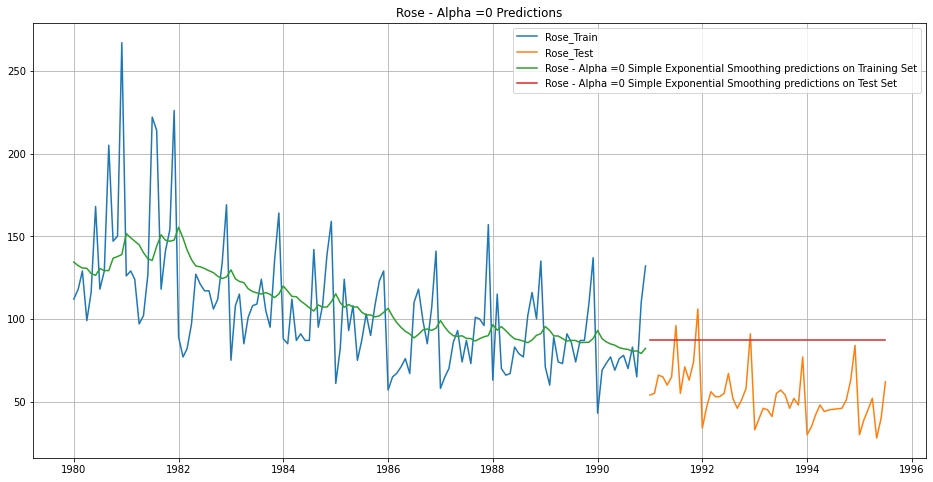

In [ ]:
## Plotting on both the Training and Test data

plt.figure(figsize=(16,8))
plt.plot(rose_SES_train['Rose_Sales'], label='Rose_Train')
plt.plot(rose_SES_test['Rose_Sales'], label='Rose_Test')

plt.plot(rose_SES_train['Predict'], label='Rose - Alpha =0 Simple Exponential Smoothing predictions on Training Set')
plt.plot(rose_SES_test['Predict'], label='Rose - Alpha =0 Simple Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Rose - Alpha =0 Predictions');

In [ ]:
rmse,mape=calculate_metrics(rose_SES_train['Rose_Sales'],rose_SES_train['Predict'])
rose_tempResultsDf_train = pd.DataFrame({'Train RMSE': [rmse], 'Train MAPE' : [mape]},index=['Rose - SES Alpha=0'])
rose_resultsDf_train = pd.concat([rose_resultsDf_train, rose_tempResultsDf_train])
rose_resultsDf_train

,Train RMSE,Train MAPE
Rose_RegressionOnTime,30.718135,21.22
Rose_Naive,45.063760,36.38
Rose_Simple_Average,36.034234,25.39
Rose - SES Alpha=0,31.500869,22.73


In [ ]:
rmse,mape=calculate_metrics(rose_SES_test['Rose_Sales'],rose_SES_test['Predict'])
rose_tempResultsDf = pd.DataFrame({'Test RMSE': [rmse], 'Test MAPE' : [mape]},index=['Rose - SES Alpha=0'])
rose_resultsDf = pd.concat([rose_resultsDf, rose_tempResultsDf])
rose_resultsDf

,Test RMSE,Test MAPE
Rose_RegressionOnTime,15.268955,22.82
Rose_Naive,17.740327,27.41
Rose_Simple_Average,15.759783,21.37
Rose_Trailing_MA_2,11.529278,13.54
Rose_Trailing_MA_3,14.451403,19.49
Rose_Trailing_MA_6,14.566327,20.82
Rose_Trailing_MA_9,14.727630,21.01
Rose - SES Alpha=0,36.796242,63.88


In [ ]:
## First we will define an empty dataframe to store our values from the loop

rose_resultsDf_SES = pd.DataFrame({'Alpha Values':[],'Train RMSE':[],'Train MAPE':[]
                                ,'Test RMSE': [],'Test MAPE': []})
rose_resultsDf_SES

,Alpha Values,Train RMSE,Train MAPE,Test RMSE,Test MAPE


In [ ]:
for i in np.arange(0,1,0.1):
    rose_model_SES_alpha_i = rose_model_SES.fit(smoothing_level=i,optimized=True,use_brute=True)
    rose_SES_train['Predict',i] = rose_model_SES_alpha_i.fittedvalues
    rose_SES_test['Predict',i] = rose_model_SES_alpha_i.forecast(steps=55)
    
    rmse_SES_train_i = metrics.mean_squared_error(rose_SES_train['Rose_Sales'],rose_SES_train['Predict',i],squared=False)
    mape_SES_train_i = MAPE(rose_SES_train['Rose_Sales'],rose_SES_train['Predict',i])
    
    rmse_SES_test_i = metrics.mean_squared_error(rose_SES_test['Rose_Sales'],rose_SES_test['Predict',i],squared=False)
    mape_SES_test_i = MAPE(rose_SES_test['Rose_Sales'],rose_SES_test['Predict',i])
    
    rose_resultsDf_SES = rose_resultsDf_SES.append({'Alpha Values':i,'Train RMSE':rmse_SES_train_i 
                                      ,'Train MAPE': mape_SES_train_i,'Test RMSE':rmse_SES_test_i
                                      ,'Test MAPE':mape_SES_test_i}, ignore_index=True)

In [ ]:
rose_resultsDf_SES.sort_values('Test RMSE').head()

,Alpha Values,Train RMSE,Train MAPE,Test RMSE,Test MAPE
1,0.1,31.501015,22.71,36.828051,63.94
2,0.2,31.898670,22.24,41.361876,72.21
3,0.3,32.448833,22.31,47.504821,83.71
0,0.0,36.034234,25.39,53.460570,94.93
4,0.4,33.028400,22.51,53.767406,95.50


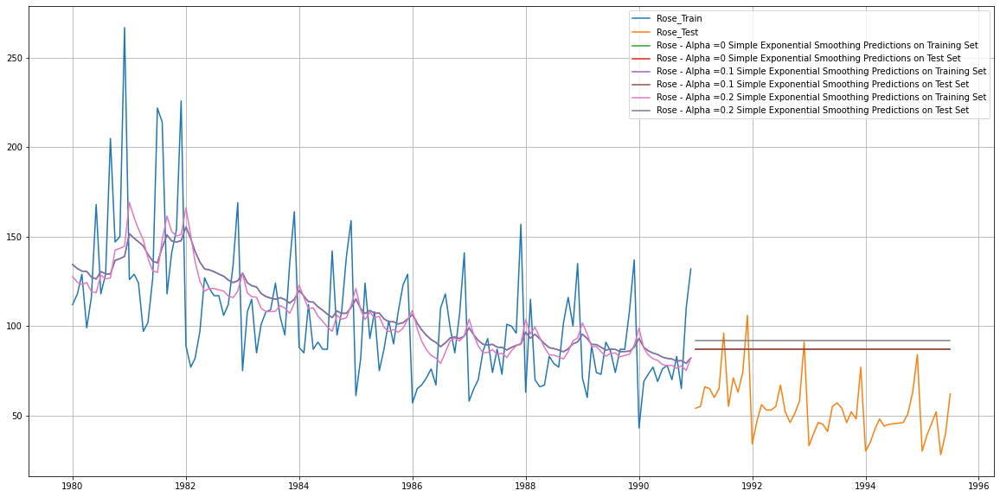

In [ ]:
## Plotting on both the Training and Test data

plt.figure(figsize=(20,10))
plt.plot(rose_SES_train['Rose_Sales'], label='Rose_Train')
plt.plot(rose_SES_test['Rose_Sales'], label='Rose_Test')

plt.plot(rose_SES_train['Predict'], label='Rose - Alpha =0 Simple Exponential Smoothing Predictions on Training Set')
plt.plot(rose_SES_test['Predict'], label='Rose - Alpha =0 Simple Exponential Smoothing Predictions on Test Set')

plt.plot(rose_SES_train['Predict', 0.1], label='Rose - Alpha =0.1 Simple Exponential Smoothing Predictions on Training Set')
plt.plot(rose_SES_test['Predict', 0.1], label='Rose - Alpha =0.1 Simple Exponential Smoothing Predictions on Test Set')

plt.plot(rose_SES_train['Predict', 0.2], label='Rose - Alpha =0.2 Simple Exponential Smoothing Predictions on Training Set')
plt.plot(rose_SES_test['Predict', 0.2], label='Rose - Alpha =0.2 Simple Exponential Smoothing Predictions on Test Set')


plt.legend(loc='best')
plt.grid();

In [ ]:
rose_resultsDf_SES_2 = pd.DataFrame({'Train RMSE': [rose_resultsDf_SES['Train RMSE'][0],rose_resultsDf_SES['Train RMSE'][1]]
                            ,'Train MAPE': [rose_resultsDf_SES['Train MAPE'][0],rose_resultsDf_SES['Train MAPE'][1]]}
                           ,index=['Rose_Alpha=0.1,SimpleExponentialSmoothing','Rose_Alpha=0.2,SimpleExponentialSmoothing'])

rose_resultsDf_train = pd.concat([rose_resultsDf_train, rose_resultsDf_SES_2])
rose_resultsDf_train

,Train RMSE,Train MAPE
Rose_RegressionOnTime,30.718135,21.22
Rose_Naive,45.063760,36.38
Rose_Simple_Average,36.034234,25.39
Rose - SES Alpha=0,31.500869,22.73
"Rose_Alpha=0.1,SimpleExponentialSmoothing",36.034234,25.39
"Rose_Alpha=0.2,SimpleExponentialSmoothing",31.501015,22.71


In [ ]:
rose_resultsDf_train.iloc[3:]

,Train RMSE,Train MAPE
Rose - SES Alpha=0,31.500869,22.73
"Rose_Alpha=0.1,SimpleExponentialSmoothing",36.034234,25.39
"Rose_Alpha=0.2,SimpleExponentialSmoothing",31.501015,22.71


In [ ]:
rose_resultsDf_SES_1 = pd.DataFrame({'Test RMSE': [rose_resultsDf_SES['Test RMSE'][0],rose_resultsDf_SES['Test RMSE'][1]]
                            ,'Test MAPE': [rose_resultsDf_SES['Test MAPE'][0],rose_resultsDf_SES['Test MAPE'][1]]}
                           ,index=['Rose_Alpha=0.1,SimpleExponentialSmoothing','Rose_Alpha=0.2,SimpleExponentialSmoothing'])

rose_resultsDf = pd.concat([rose_resultsDf, rose_resultsDf_SES_1])
rose_resultsDf

,Test RMSE,Test MAPE
Rose_RegressionOnTime,15.268955,22.82
Rose_Naive,17.740327,27.41
Rose_Simple_Average,15.759783,21.37
Rose_Trailing_MA_2,11.529278,13.54
Rose_Trailing_MA_3,14.451403,19.49
Rose_Trailing_MA_6,14.566327,20.82
Rose_Trailing_MA_9,14.727630,21.01
Rose - SES Alpha=0,36.796242,63.88
"Rose_Alpha=0.1,SimpleExponentialSmoothing",53.460570,94.93
"Rose_Alpha=0.2,SimpleExponentialSmoothing",36.828051,63.94


In [ ]:
rose_resultsDf.iloc[7:]

,Test RMSE,Test MAPE
Rose - SES Alpha=0,36.796242,63.88
"Rose_Alpha=0.1,SimpleExponentialSmoothing",53.460570,94.93
"Rose_Alpha=0.2,SimpleExponentialSmoothing",36.828051,63.94


## **Model 6: Double Exponential Smoothing  - Holt's Model**

### **Sparkling**

In [ ]:
sparkling_DES_train = pd.DataFrame(sparkling_train.copy())
sparkling_DES_test = pd.DataFrame(sparkling_test.copy())

In [ ]:
sparkling_model_DES = Holt(sparkling_DES_train['Sparkling_Sales'])

In [ ]:
sparkling_model_DES_auto_fit=sparkling_model_DES.fit(optimized=True,use_brute=True)

In [ ]:
sparkling_model_DES_auto_fit.params

{'damping_trend': nan,
 'initial_level': 1686.0,
 'initial_seasons': array([], dtype=float64),
 'initial_trend': -95.0,
 'lamda': None,
 'remove_bias': False,
 'smoothing_level': 0.6885714285714285,
 'smoothing_seasonal': nan,
 'smoothing_trend': 9.999999999999999e-05,
 'use_boxcox': False}

In [ ]:
sparkling_resultsDf_DES = pd.DataFrame({'Alpha Values':[],'Beta Values':[],'Train RMSE':[],'Train MAPE':[]
                                ,'Test RMSE': [],'Test MAPE': []})
sparkling_resultsDf_DES

,Alpha Values,Beta Values,Train RMSE,Train MAPE,Test RMSE,Test MAPE


In [ ]:
sparkling_DES_train['Predict']=sparkling_model_DES_auto_fit.fittedvalues
sparkling_DES_test['Predict']=sparkling_model_DES_auto_fit.forecast(steps=55)

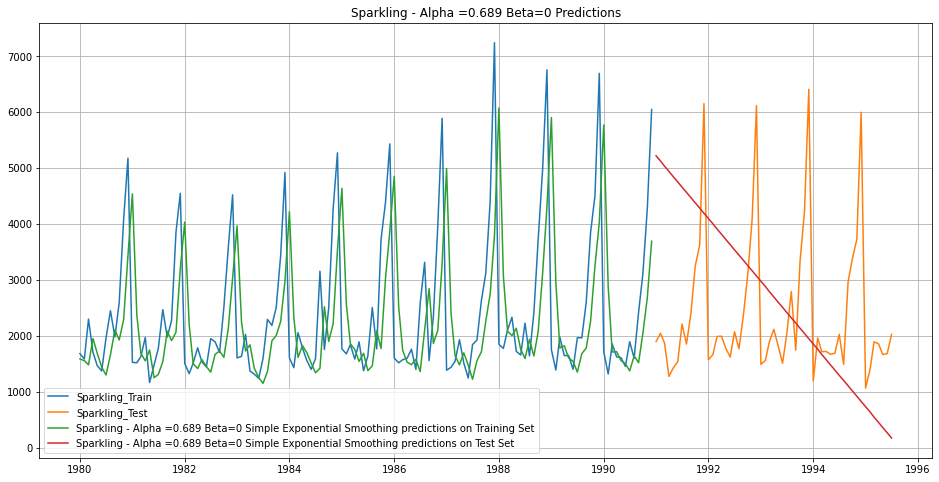

In [ ]:
## Plotting on both the Training and Test data

plt.figure(figsize=(16,8))
plt.plot(sparkling_DES_train['Sparkling_Sales'], label='Sparkling_Train')
plt.plot(sparkling_DES_test['Sparkling_Sales'], label='Sparkling_Test')

plt.plot(sparkling_DES_train['Predict'], label='Sparkling - Alpha =0.689 Beta=0 Simple Exponential Smoothing predictions on Training Set')
plt.plot(sparkling_DES_test['Predict'], label='Sparkling - Alpha =0.689 Beta=0 Simple Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Sparkling - Alpha =0.689 Beta=0 Predictions');

In [ ]:
rmse,mape=calculate_metrics(sparkling_DES_train['Sparkling_Sales'],sparkling_DES_train['Predict'])
sparkling_tempResultsDf_train = pd.DataFrame({'Train RMSE': [rmse], 'Train MAPE' : [mape]},index=['Sparkling_DES Alpha=0.689,Beta=0'])
sparkling_resultsDf_train = pd.concat([sparkling_resultsDf_train, sparkling_tempResultsDf_train])
sparkling_resultsDf_train

,Train RMSE,Train MAPE
Sparkling_RegressionOnTime,1279.322346,40.05
Sparkling_Naive,3867.700802,153.17
Sparkling_Simple_Average,1298.483628,40.36
Sparkling_SES Alpha=0,1315.232467,39.92
"Sparkling_Alpha=0.1,SimpleExponentialSmoothing",1298.483628,38.90
"Sparkling_Alpha=0.2,SimpleExponentialSmoothing",1331.786996,42.30
"Sparkling_DES Alpha=0.689,Beta=0",1349.650460,39.23


In [ ]:
rmse,mape=calculate_metrics(sparkling_DES_test['Sparkling_Sales'],sparkling_DES_test['Predict'])
sparkling_tempResultsDf = pd.DataFrame({'Test RMSE': [rmse], 'Test MAPE' : [mape]},index=['Sparkling_DES Alpha=0.689,Beta=0'])
sparkling_resultsDf = pd.concat([sparkling_resultsDf, sparkling_tempResultsDf])
sparkling_resultsDf

,Test RMSE,Test MAPE
Sparkling_RegressionOnTime,1389.135175,50.15
Sparkling_Naive,1327.156057,32.90
Sparkling_Simple_Average,1275.073380,38.81
Sparkling_Trailing_MA_2,813.400684,19.70
Sparkling_Trailing_MA_3,1156.589694,35.96
Sparkling_Trailing_MA_6,1283.927428,43.86
Sparkling_Trailing_MA_9,1346.278315,46.86
Sparkling_SES Alpha=0,1316.034674,45.47
"Sparkling_Alpha=0.1,SimpleExponentialSmoothing",1275.081797,38.90
"Sparkling_Alpha=0.2,SimpleExponentialSmoothing",1375.393526,49.53


In [ ]:
for i in np.arange(0,1.1,0.1):
    for j in np.arange(0,1.1,0.1):
        sparkling_model_DES_alpha_i_j = sparkling_model_DES.fit(smoothing_level=i,smoothing_slope=j,optimized=True,use_brute=True)
        sparkling_DES_train['predict',i,j] = sparkling_model_DES_alpha_i_j.fittedvalues
        sparkling_DES_test['predict',i,j] = sparkling_model_DES_alpha_i_j.forecast(steps=55)
        
        rmse_DES_train = metrics.mean_squared_error(sparkling_DES_train['Sparkling_Sales'],sparkling_DES_train['predict',i,j],squared=False)
        mape_DES_train = MAPE(sparkling_DES_train['Sparkling_Sales'],sparkling_DES_train['predict',i,j])
        
        rmse_DES_test = metrics.mean_squared_error(sparkling_DES_test['Sparkling_Sales'],sparkling_DES_test['predict',i,j],squared=False)
        mape_DES_test = MAPE(sparkling_DES_test['Sparkling_Sales'],sparkling_DES_test['predict',i,j])
        
        sparkling_resultsDf_DES = sparkling_resultsDf_DES.append({'Alpha Values':i,'Beta Values':j,'Train RMSE':rmse_DES_train
                                      ,'Train MAPE': mape_DES_train,'Test RMSE':rmse_DES_test
                                      ,'Test MAPE':mape_DES_test}, ignore_index=True)

In [ ]:
sparkling_resultsDf_DES.sort_values(by=['Test RMSE']).head(15)

,Alpha Values,Beta Values,Train RMSE,Train MAPE,Test RMSE,Test MAPE
1,0.0,0.1,1279.322346,40.05,1389.131293,50.15
2,0.0,0.2,1279.322346,40.05,1389.131293,50.15
3,0.0,0.3,1279.322346,40.05,1389.131293,50.15
0,0.0,0.0,1279.322346,40.05,1389.135667,50.15
10,0.0,1.0,1279.322346,40.05,1389.135827,50.15
4,0.0,0.4,1279.322346,40.05,1389.138837,50.15
5,0.0,0.5,1279.322346,40.05,1389.138837,50.15
6,0.0,0.6,1279.322346,40.05,1389.138837,50.15
7,0.0,0.7,1279.322346,40.05,1389.138837,50.15
8,0.0,0.8,1279.322346,40.05,1389.138837,50.15


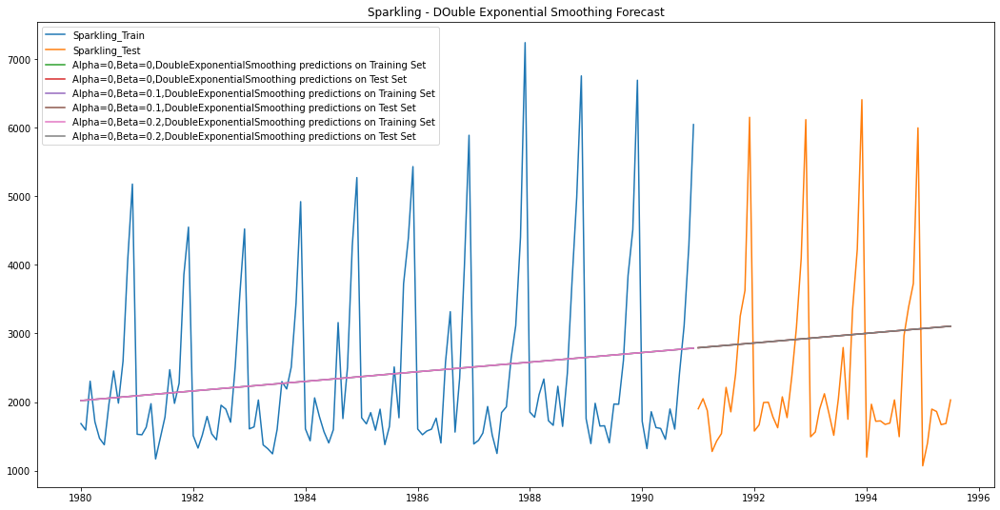

In [ ]:
plt.figure(figsize=(18,9))
plt.plot(sparkling_DES_train['Sparkling_Sales'], label='Sparkling_Train')
plt.plot(sparkling_DES_test['Sparkling_Sales'], label='Sparkling_Test')

plt.plot(sparkling_DES_train['predict', 0, 0], label='Alpha=0,Beta=0,DoubleExponentialSmoothing predictions on Training Set')
plt.plot(sparkling_DES_test['predict', 0, 0], label='Alpha=0,Beta=0,DoubleExponentialSmoothing predictions on Test Set')

plt.plot(sparkling_DES_train['predict', 0, 0.1], label='Alpha=0,Beta=0.1,DoubleExponentialSmoothing predictions on Training Set')
plt.plot(sparkling_DES_test['predict', 0, 0.1], label='Alpha=0,Beta=0.1,DoubleExponentialSmoothing predictions on Test Set')

plt.plot(sparkling_DES_train['predict', 0, 0.2], label='Alpha=0,Beta=0.2,DoubleExponentialSmoothing predictions on Training Set')
plt.plot(sparkling_DES_test['predict', 0, 0.2], label='Alpha=0,Beta=0.2,DoubleExponentialSmoothing predictions on Test Set')
plt.title('Sparkling - DOuble Exponential Smoothing Forecast')
plt.legend(loc='best')

Text(0.5, 1.0, 'Sparkling - Comparision of DES Models')

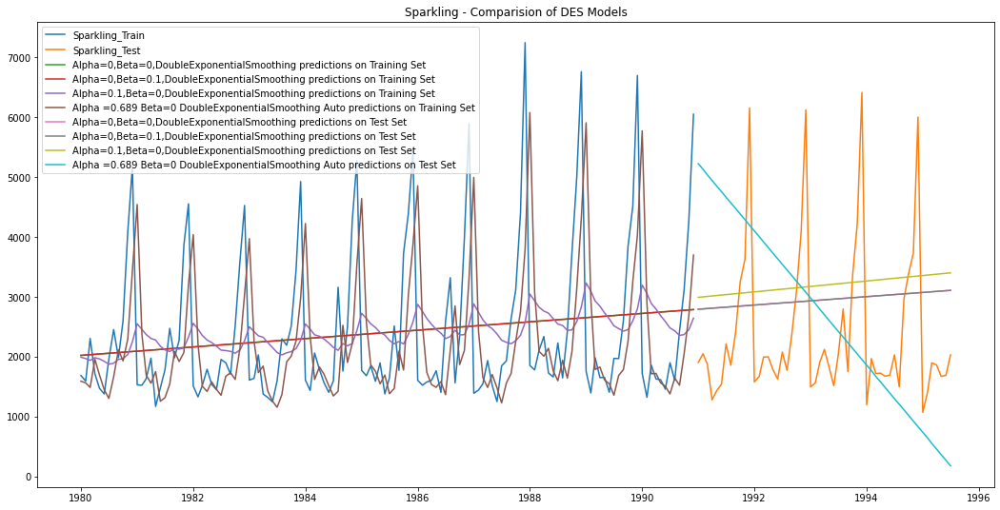

In [ ]:
plt.figure(figsize=(18,9))
plt.plot(sparkling_DES_train['Sparkling_Sales'], label='Sparkling_Train')
plt.plot(sparkling_DES_test['Sparkling_Sales'], label='Sparkling_Test')

plt.plot(sparkling_DES_train['predict', 0, 0], label='Alpha=0,Beta=0,DoubleExponentialSmoothing predictions on Training Set')
plt.plot(sparkling_DES_train['predict', 0, 0.1], label='Alpha=0,Beta=0.1,DoubleExponentialSmoothing predictions on Training Set')
plt.plot(sparkling_DES_train['predict', 0.1, 0], label='Alpha=0.1,Beta=0,DoubleExponentialSmoothing predictions on Training Set')
plt.plot(sparkling_DES_train['Predict'], label='Alpha =0.689 Beta=0 DoubleExponentialSmoothing Auto predictions on Training Set')


plt.plot(sparkling_DES_test['predict', 0, 0], label='Alpha=0,Beta=0,DoubleExponentialSmoothing predictions on Test Set')
plt.plot(sparkling_DES_test['predict', 0, 0.1], label='Alpha=0,Beta=0.1,DoubleExponentialSmoothing predictions on Test Set')
plt.plot(sparkling_DES_test['predict', 0.1, 0], label='Alpha=0.1,Beta=0,DoubleExponentialSmoothing predictions on Test Set')
plt.plot(sparkling_DES_test['Predict'], label='Alpha =0.689 Beta=0 DoubleExponentialSmoothing Auto predictions on Test Set')

plt.legend(loc='best')
plt.title('Sparkling - Comparision of DES Models')

In [ ]:
sparkling_resultsDf_DES_2 = pd.DataFrame({'Train RMSE': [sparkling_resultsDf_DES['Train RMSE'][2]],'Train MAPE':[sparkling_resultsDf_DES['Train MAPE'][2]]}
                           ,index=['Sparkling_Alpha=0,Beta=0.2,DoubleExponentialSmoothing'])

sparkling_resultsDf_train = pd.concat([sparkling_resultsDf_train, sparkling_resultsDf_DES_2])
sparkling_resultsDf_train

,Train RMSE,Train MAPE
Sparkling_RegressionOnTime,1279.322346,40.05
Sparkling_Naive,3867.700802,153.17
Sparkling_Simple_Average,1298.483628,40.36
Sparkling_SES Alpha=0,1315.232467,39.92
"Sparkling_Alpha=0.1,SimpleExponentialSmoothing",1298.483628,38.90
"Sparkling_Alpha=0.2,SimpleExponentialSmoothing",1331.786996,42.30
"Sparkling_DES Alpha=0.689,Beta=0",1349.650460,39.23
"Sparkling_Alpha=0,Beta=0.2,DoubleExponentialSmoothing",1279.322346,40.05


In [ ]:
sparkling_resultsDf_train[-2:]

,Train RMSE,Train MAPE
"Sparkling_DES Alpha=0.689,Beta=0",1349.650460,39.23
"Sparkling_Alpha=0,Beta=0.2,DoubleExponentialSmoothing",1279.322346,40.05


In [ ]:
sparkling_resultsDf_DES_1 = pd.DataFrame({'Test RMSE': [sparkling_resultsDf_DES['Test RMSE'][0]],'Test MAPE':[sparkling_resultsDf_DES['Test MAPE'][0]]}
                           ,index=['Alpha=0,Beta=0.1,DoubleExponentialSmoothing'])

sparkling_resultsDf = pd.concat([sparkling_resultsDf, sparkling_resultsDf_DES_1])
sparkling_resultsDf

,Test RMSE,Test MAPE
Sparkling_RegressionOnTime,1389.135175,50.15
Sparkling_Naive,1327.156057,32.90
Sparkling_Simple_Average,1275.073380,38.81
Sparkling_Trailing_MA_2,813.400684,19.70
Sparkling_Trailing_MA_3,1156.589694,35.96
Sparkling_Trailing_MA_6,1283.927428,43.86
Sparkling_Trailing_MA_9,1346.278315,46.86
Sparkling_SES Alpha=0,1316.034674,45.47
"Sparkling_Alpha=0.1,SimpleExponentialSmoothing",1275.081797,38.90
"Sparkling_Alpha=0.2,SimpleExponentialSmoothing",1375.393526,49.53


In [ ]:
sparkling_resultsDf[-2:]

,Test RMSE,Test MAPE
"Sparkling_DES Alpha=0.689,Beta=0",2007.238526,68.23
"Alpha=0,Beta=0.1,DoubleExponentialSmoothing",1389.135667,50.15


### **Rose**

In [ ]:
rose_DES_train = pd.DataFrame(rose_train.copy())
rose_DES_test = pd.DataFrame(rose_test.copy())

In [ ]:
rose_model_DES = Holt(rose_DES_train['Rose_Sales'])

In [ ]:
rose_model_DES_auto_fit=rose_model_DES.fit(optimized=True,use_brute=True)

In [ ]:
rose_model_DES_auto_fit.params

{'damping_trend': nan,
 'initial_level': 137.81555273182406,
 'initial_seasons': array([], dtype=float64),
 'initial_trend': -0.49437822071047205,
 'lamda': None,
 'remove_bias': False,
 'smoothing_level': 1.4903109413942238e-08,
 'smoothing_seasonal': nan,
 'smoothing_trend': 3.0715523798138926e-18,
 'use_boxcox': False}

In [ ]:
rose_resultsDf_DES = pd.DataFrame({'Alpha Values':[],'Beta Values':[],'Train RMSE':[],'Train MAPE':[]
                                ,'Test RMSE': [],'Test MAPE': []})
rose_resultsDf_DES

,Alpha Values,Beta Values,Train RMSE,Train MAPE,Test RMSE,Test MAPE


In [ ]:
rose_DES_train['Predict']=rose_model_DES_auto_fit.fittedvalues
rose_DES_test['Predict']=rose_model_DES_auto_fit.forecast(steps=55)

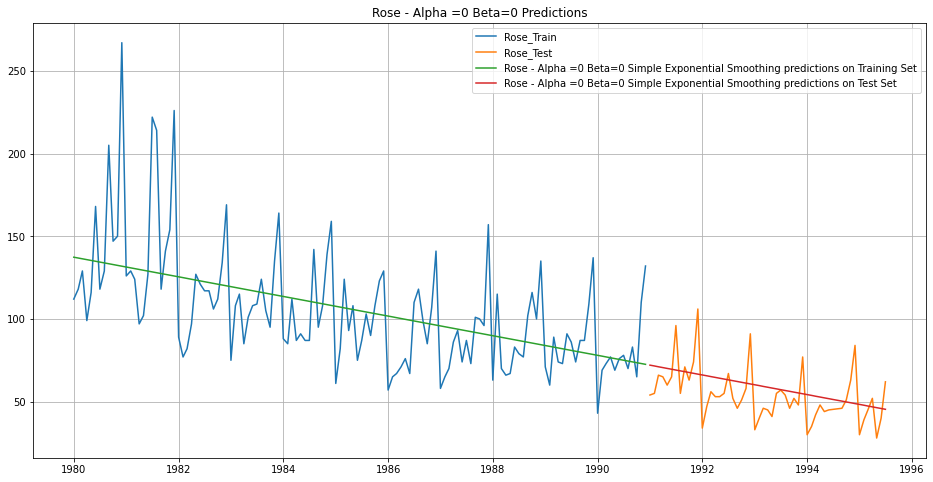

In [ ]:
## Plotting on both the Training and Test data

plt.figure(figsize=(16,8))
plt.plot(rose_DES_train['Rose_Sales'], label='Rose_Train')
plt.plot(rose_DES_test['Rose_Sales'], label='Rose_Test')

plt.plot(rose_DES_train['Predict'], label='Rose - Alpha =0 Beta=0 Simple Exponential Smoothing predictions on Training Set')
plt.plot(rose_DES_test['Predict'], label='Rose - Alpha =0 Beta=0 Simple Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Rose - Alpha =0 Beta=0 Predictions');

In [ ]:
rmse,mape=calculate_metrics(rose_DES_train['Rose_Sales'],sparkling_DES_train['Predict'])
rose_tempResultsDf_train = pd.DataFrame({'Train RMSE': [rmse], 'Train MAPE' : [mape]},index=['Rose_DES Alpha=0,Beta=0'])
rose_resultsDf_train = pd.concat([rose_resultsDf_train, rose_tempResultsDf_train])
rose_resultsDf_train

,Train RMSE,Train MAPE
Rose_RegressionOnTime,30.718135,21.22
Rose_Naive,45.063760,36.38
Rose_Simple_Average,36.034234,25.39
Rose - SES Alpha=0,31.500869,22.73
"Rose_Alpha=0.1,SimpleExponentialSmoothing",36.034234,25.39
"Rose_Alpha=0.2,SimpleExponentialSmoothing",31.501015,22.71
"Rose_DES Alpha=0,Beta=0",2353.979880,2022.06


In [ ]:
rmse,mape=calculate_metrics(rose_DES_test['Rose_Sales'],sparkling_DES_test['Predict'])
rose_tempResultsDf = pd.DataFrame({'Test RMSE': [rmse], 'Test MAPE' : [mape]},index=['Rose_DES Alpha=0,Beta=0'])
rose_resultsDf = pd.concat([rose_resultsDf, rose_tempResultsDf])
rose_resultsDf

,Test RMSE,Test MAPE
Rose_RegressionOnTime,15.268955,22.82
Rose_Naive,17.740327,27.41
Rose_Simple_Average,15.759783,21.37
Rose_Trailing_MA_2,11.529278,13.54
Rose_Trailing_MA_3,14.451403,19.49
Rose_Trailing_MA_6,14.566327,20.82
Rose_Trailing_MA_9,14.727630,21.01
Rose - SES Alpha=0,36.796242,63.88
"Rose_Alpha=0.1,SimpleExponentialSmoothing",53.460570,94.93
"Rose_Alpha=0.2,SimpleExponentialSmoothing",36.828051,63.94


In [ ]:
for i in np.arange(0,1.1,0.1):
    for j in np.arange(0,1.1,0.1):
        rose_model_DES_alpha_i_j = rose_model_DES.fit(smoothing_level=i,smoothing_slope=j,optimized=True,use_brute=True)
        rose_DES_train['predict',i,j] = rose_model_DES_alpha_i_j.fittedvalues
        rose_DES_test['predict',i,j] = rose_model_DES_alpha_i_j.forecast(steps=55)
        
        rmse_DES_train = metrics.mean_squared_error(rose_DES_train['Rose_Sales'],rose_DES_train['predict',i,j],squared=False)
        mape_DES_train = MAPE(rose_DES_train['Rose_Sales'],rose_DES_train['predict',i,j])
        
        rmse_DES_test = metrics.mean_squared_error(rose_DES_test['Rose_Sales'],rose_DES_test['predict',i,j],squared=False)
        mape_DES_test = MAPE(rose_DES_test['Rose_Sales'],rose_DES_test['predict',i,j])
        
        rose_resultsDf_DES = rose_resultsDf_DES.append({'Alpha Values':i,'Beta Values':j,'Train RMSE':rmse_DES_train
                                      ,'Train MAPE': mape_DES_train,'Test RMSE':rmse_DES_test
                                      ,'Test MAPE':mape_DES_test}, ignore_index=True)

In [ ]:
rose_resultsDf_DES.sort_values(by=['Test RMSE']).head(5)

,Alpha Values,Beta Values,Train RMSE,Train MAPE,Test RMSE,Test MAPE
4,0.0,0.4,30.718135,21.22,15.268948,22.82
5,0.0,0.5,30.718135,21.22,15.268952,22.82
6,0.0,0.6,30.718135,21.22,15.268952,22.82
7,0.0,0.7,30.718135,21.22,15.268952,22.82
8,0.0,0.8,30.718135,21.22,15.268952,22.82


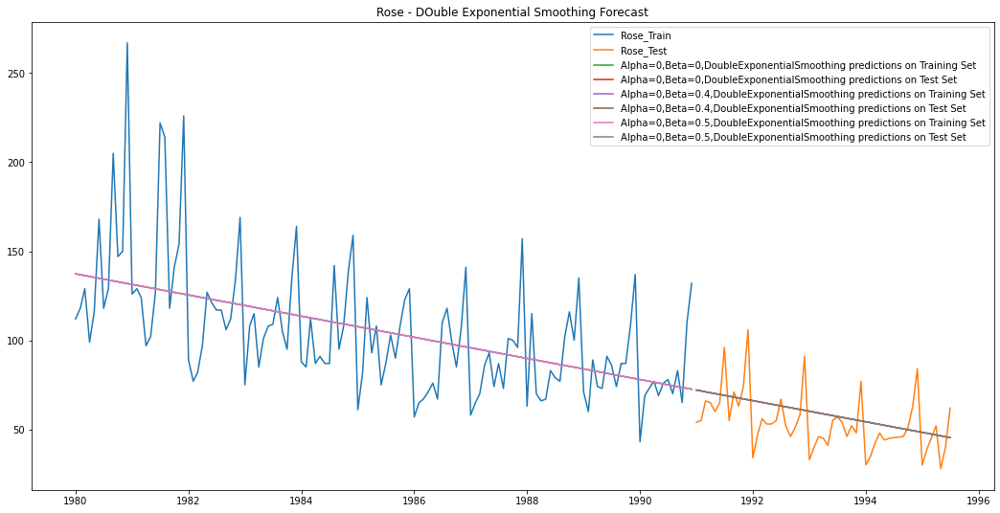

In [ ]:
plt.figure(figsize=(18,9))
plt.plot(rose_DES_train['Rose_Sales'], label='Rose_Train')
plt.plot(rose_DES_test['Rose_Sales'], label='Rose_Test')

plt.plot(rose_DES_train['predict', 0, 0], label='Alpha=0,Beta=0,DoubleExponentialSmoothing predictions on Training Set')
plt.plot(rose_DES_test['predict', 0, 0], label='Alpha=0,Beta=0,DoubleExponentialSmoothing predictions on Test Set')

plt.plot(rose_DES_train['predict', 0, 0.4], label='Alpha=0,Beta=0.4,DoubleExponentialSmoothing predictions on Training Set')
plt.plot(rose_DES_test['predict', 0, 0.4], label='Alpha=0,Beta=0.4,DoubleExponentialSmoothing predictions on Test Set')

plt.plot(rose_DES_train['predict', 0, 0.5], label='Alpha=0,Beta=0.5,DoubleExponentialSmoothing predictions on Training Set')
plt.plot(rose_DES_test['predict', 0, 0.5], label='Alpha=0,Beta=0.5,DoubleExponentialSmoothing predictions on Test Set')
plt.title('Rose - DOuble Exponential Smoothing Forecast')
plt.legend(loc='best')

Text(0.5, 1.0, 'Rose - Comparision of DES Models')

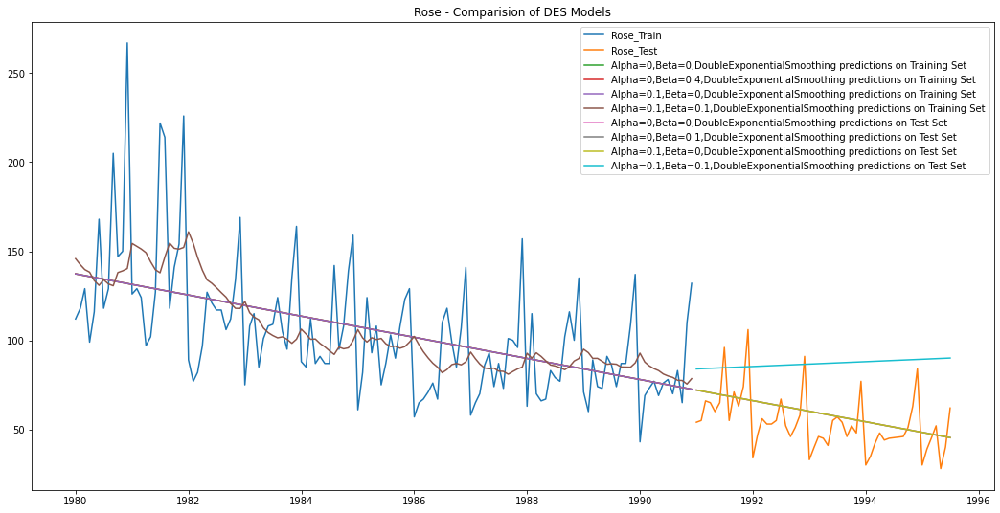

In [ ]:
plt.figure(figsize=(18,9))
plt.plot(rose_DES_train['Rose_Sales'], label='Rose_Train')
plt.plot(rose_DES_test['Rose_Sales'], label='Rose_Test')

plt.plot(rose_DES_train['predict', 0, 0], label='Alpha=0,Beta=0,DoubleExponentialSmoothing predictions on Training Set')
plt.plot(rose_DES_train['predict', 0, 0.4], label='Alpha=0,Beta=0.4,DoubleExponentialSmoothing predictions on Training Set')
plt.plot(rose_DES_train['predict', 0, 0.5], label='Alpha=0.1,Beta=0,DoubleExponentialSmoothing predictions on Training Set')
plt.plot(rose_DES_train['predict', 0.1, 0.1], label='Alpha=0.1,Beta=0.1,DoubleExponentialSmoothing predictions on Training Set')

plt.plot(rose_DES_test['predict', 0, 0], label='Alpha=0,Beta=0,DoubleExponentialSmoothing predictions on Test Set')
plt.plot(rose_DES_test['predict', 0, 0.4], label='Alpha=0,Beta=0.1,DoubleExponentialSmoothing predictions on Test Set')
plt.plot(rose_DES_test['predict', 0, 0.5], label='Alpha=0.1,Beta=0,DoubleExponentialSmoothing predictions on Test Set')
plt.plot(rose_DES_test['predict', 0.1, 0.1], label='Alpha=0.1,Beta=0.1,DoubleExponentialSmoothing predictions on Test Set')

plt.legend(loc='best')
plt.title('Rose - Comparision of DES Models')

In [ ]:
rose_resultsDf_DES_2 = pd.DataFrame({'Train RMSE': [rose_resultsDf_DES['Train RMSE'][2]],'Train MAPE':[rose_resultsDf_DES['Train MAPE'][2]]}
                           ,index=['Alpha=0,Beta=0.1,DoubleExponentialSmoothing'])

rose_resultsDf_train = pd.concat([rose_resultsDf_train, rose_resultsDf_DES_2])
rose_resultsDf_train

,Train RMSE,Train MAPE
Rose_RegressionOnTime,30.718135,21.22
Rose_Naive,45.063760,36.38
Rose_Simple_Average,36.034234,25.39
Rose - SES Alpha=0,31.500869,22.73
"Rose_Alpha=0.1,SimpleExponentialSmoothing",36.034234,25.39
"Rose_Alpha=0.2,SimpleExponentialSmoothing",31.501015,22.71
"Rose_DES Alpha=0,Beta=0",2353.979880,2022.06
"Alpha=0,Beta=0.1,DoubleExponentialSmoothing",30.718135,21.22


In [ ]:
rose_resultsDf_train[-2:]

,Train RMSE,Train MAPE
"Rose_DES Alpha=0,Beta=0",2353.979880,2022.06
"Alpha=0,Beta=0.1,DoubleExponentialSmoothing",30.718135,21.22


In [ ]:
rose_resultsDf_DES_1 = pd.DataFrame({'Test RMSE': [rose_resultsDf_DES['Test RMSE'][0]],'Test MAPE':[rose_resultsDf_DES['Test MAPE'][0]]}
                           ,index=['Alpha=0,Beta=0.1,DoubleExponentialSmoothing'])

rose_resultsDf = pd.concat([rose_resultsDf, rose_resultsDf_DES_1])
rose_resultsDf

,Test RMSE,Test MAPE
Rose_RegressionOnTime,15.268955,22.82
Rose_Naive,17.740327,27.41
Rose_Simple_Average,15.759783,21.37
Rose_Trailing_MA_2,11.529278,13.54
Rose_Trailing_MA_3,14.451403,19.49
Rose_Trailing_MA_6,14.566327,20.82
Rose_Trailing_MA_9,14.727630,21.01
Rose - SES Alpha=0,36.796242,63.88
"Rose_Alpha=0.1,SimpleExponentialSmoothing",53.460570,94.93
"Rose_Alpha=0.2,SimpleExponentialSmoothing",36.828051,63.94


In [ ]:
rose_resultsDf[-2:]

,Test RMSE,Test MAPE
"Rose_DES Alpha=0,Beta=0",3029.800343,4912.93
"Alpha=0,Beta=0.1,DoubleExponentialSmoothing",15.268956,22.82


## **Model 7: Triple Exponential Smoothing Model - Holt - Winter's Model**

### **Sparkling**

In [ ]:
sparkling_TES_train = pd.DataFrame(sparkling_train.copy())
sparkling_TES_test = pd.DataFrame(sparkling_test.copy())

In [ ]:
sparkling_model_TES = ExponentialSmoothing(sparkling_TES_train['Sparkling_Sales'],seasonal_periods = 12 ,trend='additive',seasonal='additive')
sparkling_model_TES_autofit = sparkling_model_TES.fit()

In [ ]:
sparkling_model_TES_autofit.params

{'damping_trend': nan,
 'initial_level': 2356.5782517136004,
 'initial_seasons': array([-636.23349242, -722.98346428, -398.64355436, -473.43073177,
        -808.42519866, -815.35019304, -384.23066986,   72.99513707,
        -237.44267263,  272.325902  , 1541.3781538 , 2590.07753857]),
 'initial_trend': -0.018538851390909272,
 'lamda': None,
 'remove_bias': False,
 'smoothing_level': 0.11127217852798801,
 'smoothing_seasonal': 0.4607177642916477,
 'smoothing_trend': 0.012360783280973953,
 'use_boxcox': False}

In [ ]:
sparkling_TES_train['Predict'] = sparkling_model_TES_autofit.fittedvalues
sparkling_TES_test['Predict'] = sparkling_model_TES_autofit.forecast(steps=55)

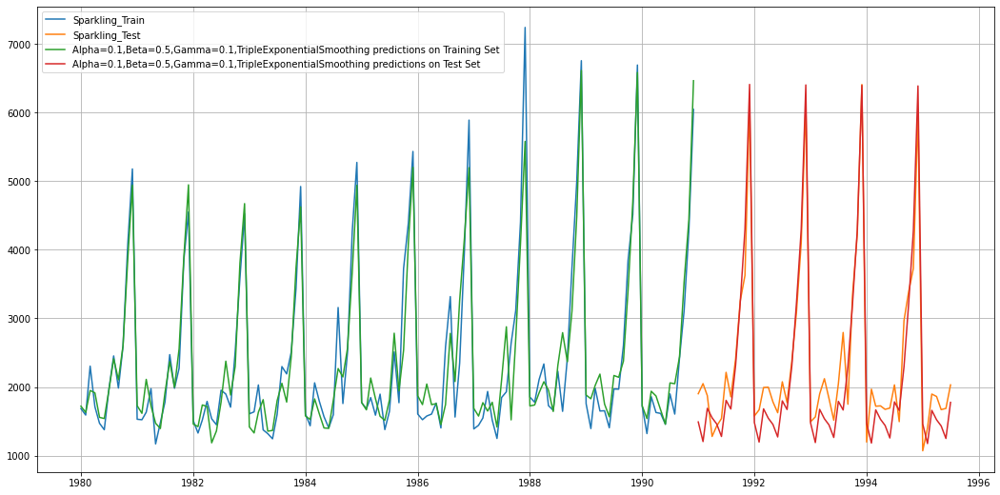

In [ ]:
## Plotting on both the Training and Test using autofit

plt.figure(figsize=(18,9))
plt.plot(sparkling_TES_train['Sparkling_Sales'], label='Sparkling_Train')
plt.plot(sparkling_TES_test['Sparkling_Sales'], label='Sparkling_Test')

plt.plot(sparkling_TES_train['Predict'], label='Alpha=0.1,Beta=0.5,Gamma=0.1,TripleExponentialSmoothing predictions on Training Set')
plt.plot(sparkling_TES_test['Predict'], label='Alpha=0.1,Beta=0.5,Gamma=0.1,TripleExponentialSmoothing predictions on Test Set')


plt.legend(loc='best')
plt.grid();

In [ ]:
rmse,mape=calculate_metrics(sparkling_TES_train['Sparkling_Sales'],sparkling_TES_train['Predict'])
sparkling_tempResultsDf_train = pd.DataFrame({'Train RMSE': [rmse], 'Train MAPE' : [mape]},index=['Sparkling - Triple Exponential Smoothing Alpha=0.1,Beta=0.5,Gamma=0.1'])
sparkling_resultsDf_train = pd.concat([sparkling_resultsDf_train, sparkling_tempResultsDf_train])
sparkling_resultsDf_train

,Train RMSE,Train MAPE
Sparkling_RegressionOnTime,1279.322346,40.05
Sparkling_Naive,3867.700802,153.17
Sparkling_Simple_Average,1298.483628,40.36
Sparkling_SES Alpha=0,1315.232467,39.92
"Sparkling_Alpha=0.1,SimpleExponentialSmoothing",1298.483628,38.90
"Sparkling_Alpha=0.2,SimpleExponentialSmoothing",1331.786996,42.30
"Sparkling_DES Alpha=0.689,Beta=0",1349.650460,39.23
"Sparkling_Alpha=0,Beta=0.2,DoubleExponentialSmoothing",1279.322346,40.05
"Sparkling - Triple Exponential Smoothing Alpha=0.1,Beta=0.5,Gamma=0.1",373.779531,11.03


In [ ]:
rmse,mape=calculate_metrics(sparkling_TES_test['Sparkling_Sales'],sparkling_TES_test['Predict'])
sparkling_tempResultsDf = pd.DataFrame({'Test RMSE': [rmse], 'Test MAPE' : [mape]},index=['Sparkling - Triple Exponential Smoothing Alpha=0.1,Beta=0.5,Gamma=0.1'])
sparkling_resultsDf = pd.concat([sparkling_resultsDf, sparkling_tempResultsDf])
sparkling_resultsDf

,Test RMSE,Test MAPE
Sparkling_RegressionOnTime,1389.135175,50.15
Sparkling_Naive,1327.156057,32.90
Sparkling_Simple_Average,1275.073380,38.81
Sparkling_Trailing_MA_2,813.400684,19.70
Sparkling_Trailing_MA_3,1156.589694,35.96
Sparkling_Trailing_MA_6,1283.927428,43.86
Sparkling_Trailing_MA_9,1346.278315,46.86
Sparkling_SES Alpha=0,1316.034674,45.47
"Sparkling_Alpha=0.1,SimpleExponentialSmoothing",1275.081797,38.90
"Sparkling_Alpha=0.2,SimpleExponentialSmoothing",1375.393526,49.53


In [ ]:
## First we will define an empty dataframe to store our values from the loop

sparkling_resultsDf_TES = pd.DataFrame({'Alpha Values':[],'Beta Values':[],'Gamma Values':[],'Train RMSE':[],'Train MAPE':[]
                                ,'Test RMSE': [],'Test MAPE': []})
sparkling_resultsDf_TES

,Alpha Values,Beta Values,Gamma Values,Train RMSE,Train MAPE,Test RMSE,Test MAPE


In [ ]:
for i in np.arange(0,1.1,0.1):
    for j in np.arange(0.0,0.1,0.1):
        for k in np.arange(0,1.1,0.1):
            sparkling_model_TES_alpha_i_j_k = sparkling_model_TES.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=True,use_brute=True)
            sparkling_TES_train['predict',i,j,k] = sparkling_model_TES_alpha_i_j_k.fittedvalues
            sparkling_TES_test['predict',i,j,k] = sparkling_model_TES_alpha_i_j_k.forecast(steps=55)
        
            rmse_TES_train = metrics.mean_squared_error(sparkling_TES_train['Sparkling_Sales'],sparkling_TES_train['predict',i,j,k],squared=False)
            mape_TES_train = MAPE(sparkling_TES_train['Sparkling_Sales'],sparkling_TES_train['predict',i,j,k])
        
            rmse_TES_test = metrics.mean_squared_error(sparkling_TES_test['Sparkling_Sales'],sparkling_TES_test['predict',i,j,k],squared=False)
            mape_TES_test = MAPE(sparkling_TES_test['Sparkling_Sales'],sparkling_TES_test['predict',i,j,k])
        
            sparkling_resultsDf_TES = sparkling_resultsDf_TES.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,'Train RMSE':rmse_TES_train
                                      ,'Train MAPE': mape_TES_train,'Test RMSE':rmse_TES_test
                                      ,'Test MAPE':mape_TES_test}, ignore_index=True)

In [ ]:
sparkling_resultsDf_TES.sort_values('Test RMSE').head()

,Alpha Values,Beta Values,Gamma Values,Train RMSE,Train MAPE,Test RMSE,Test MAPE
13,0.1,0.0,0.2,388.128817,11.46,304.271535,9.44
101,0.9,0.0,0.2,462.287163,13.61,314.589055,9.50
79,0.7,0.0,0.2,435.919439,12.87,314.679904,9.37
68,0.6,0.0,0.2,425.815069,12.68,314.992990,9.55
90,0.8,0.0,0.2,447.965511,13.09,315.126473,9.41


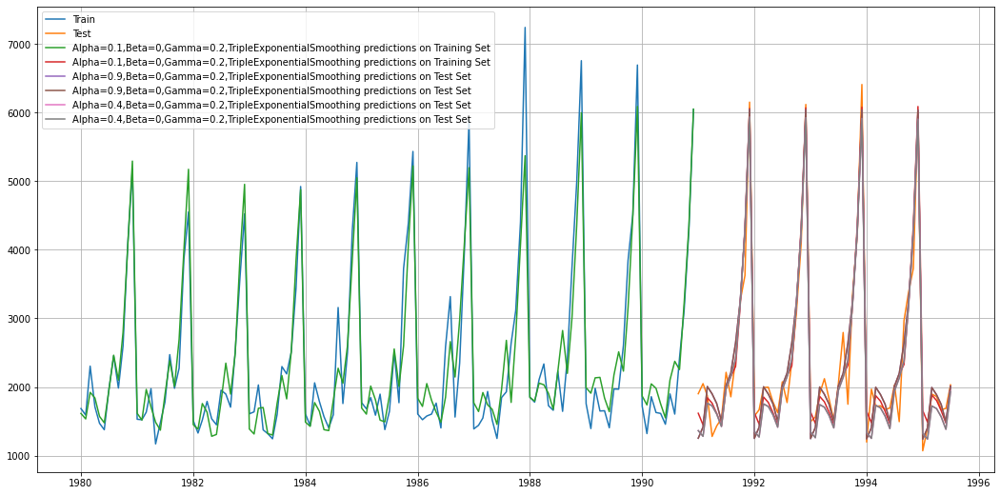

In [ ]:
## Plotting on both the Training and Test data using brute force alpha, beta and gamma determination

plt.figure(figsize=(18,9))
plt.plot(sparkling_TES_train['Sparkling_Sales'], label='Train')
plt.plot(sparkling_TES_test['Sparkling_Sales'], label='Test')

plt.plot(sparkling_TES_train['predict', 0.1, 0.0, 0.2], label='Alpha=0.1,Beta=0,Gamma=0.2,TripleExponentialSmoothing predictions on Training Set')
plt.plot(sparkling_TES_test['predict', 0.1, 0.0, 0.2], label='Alpha=0.1,Beta=0,Gamma=0.2,TripleExponentialSmoothing predictions on Training Set')

plt.plot(sparkling_TES_test['predict', 0.9, 0.0, 0.2], label='Alpha=0.9,Beta=0,Gamma=0.2,TripleExponentialSmoothing predictions on Test Set')
plt.plot(sparkling_TES_test['predict', 0.9, 0.0, 0.2], label='Alpha=0.9,Beta=0,Gamma=0.2,TripleExponentialSmoothing predictions on Test Set')

plt.plot(sparkling_TES_test['predict', 0.4, 0.0, 0.2], label='Alpha=0.4,Beta=0,Gamma=0.2,TripleExponentialSmoothing predictions on Test Set')
plt.plot(sparkling_TES_test['predict', 0.4, 0.0, 0.2], label='Alpha=0.4,Beta=0,Gamma=0.2,TripleExponentialSmoothing predictions on Test Set')


plt.legend(loc='best')
plt.grid();

In [ ]:
sparkling_resultsDf_TES_2 = pd.DataFrame({'Train RMSE': [sparkling_resultsDf_TES['Train RMSE'][13],sparkling_resultsDf_TES['Train RMSE'][101],sparkling_resultsDf_TES['Train RMSE'][79]],
                                'Train MAPE':[sparkling_resultsDf_TES['Train MAPE'][13],sparkling_resultsDf_TES['Train MAPE'][101],sparkling_resultsDf_TES['Train MAPE'][79]]}
                           ,index=['Sparkling_Alpha=0.1,Beta=0,Gamma=0.2,TripleExponentialSmoothing','Sparkling_Alpha=0.9,Beta=0,Gamma=0.2,TripleExponentialSmoothing','Sparkling_Alpha=0.7,Beta=0,Gamma=0.2,TripleExponentialSmoothing'])

sparkling_resultsDf_train = pd.concat([sparkling_resultsDf_train, sparkling_resultsDf_TES_2])
sparkling_resultsDf_train

,Train RMSE,Train MAPE
Sparkling_RegressionOnTime,1279.322346,40.05
Sparkling_Naive,3867.700802,153.17
Sparkling_Simple_Average,1298.483628,40.36
Sparkling_SES Alpha=0,1315.232467,39.92
"Sparkling_Alpha=0.1,SimpleExponentialSmoothing",1298.483628,38.90
"Sparkling_Alpha=0.2,SimpleExponentialSmoothing",1331.786996,42.30
"Sparkling_DES Alpha=0.689,Beta=0",1349.650460,39.23
"Sparkling_Alpha=0,Beta=0.2,DoubleExponentialSmoothing",1279.322346,40.05
"Sparkling - Triple Exponential Smoothing Alpha=0.1,Beta=0.5,Gamma=0.1",373.779531,11.03
"Sparkling_Alpha=0.1,Beta=0,Gamma=0.2,TripleExponentialSmoothing",388.128817,11.46


In [ ]:
sparkling_resultsDf_train[-4:]

,Train RMSE,Train MAPE
"Sparkling - Triple Exponential Smoothing Alpha=0.1,Beta=0.5,Gamma=0.1",373.779531,11.03
"Sparkling_Alpha=0.1,Beta=0,Gamma=0.2,TripleExponentialSmoothing",388.128817,11.46
"Sparkling_Alpha=0.9,Beta=0,Gamma=0.2,TripleExponentialSmoothing",462.287163,13.61
"Sparkling_Alpha=0.7,Beta=0,Gamma=0.2,TripleExponentialSmoothing",435.919439,12.87


In [ ]:
sparkling_resultsDf_TES_1 = pd.DataFrame({'Test RMSE': [sparkling_resultsDf_TES['Test RMSE'][13],sparkling_resultsDf_TES['Test RMSE'][101],sparkling_resultsDf_TES['Test RMSE'][79]],
                                'Test MAPE':[sparkling_resultsDf_TES['Test MAPE'][13],sparkling_resultsDf_TES['Test MAPE'][101],sparkling_resultsDf_TES['Test MAPE'][79]]}
                           ,index=['Sparkling_Alpha=0.1,Beta=0,Gamma=0.2,TripleExponentialSmoothing','Sparkling_Alpha=0.9,Beta=0,Gamma=0.2,TripleExponentialSmoothing','Sparkling_Alpha=0.7,Beta=0,Gamma=0.2,TripleExponentialSmoothing'])

sparkling_resultsDf = pd.concat([sparkling_resultsDf, sparkling_resultsDf_TES_1])
sparkling_resultsDf

,Test RMSE,Test MAPE
Sparkling_RegressionOnTime,1389.135175,50.15
Sparkling_Naive,1327.156057,32.90
Sparkling_Simple_Average,1275.073380,38.81
Sparkling_Trailing_MA_2,813.400684,19.70
Sparkling_Trailing_MA_3,1156.589694,35.96
Sparkling_Trailing_MA_6,1283.927428,43.86
Sparkling_Trailing_MA_9,1346.278315,46.86
Sparkling_SES Alpha=0,1316.034674,45.47
"Sparkling_Alpha=0.1,SimpleExponentialSmoothing",1275.081797,38.90
"Sparkling_Alpha=0.2,SimpleExponentialSmoothing",1375.393526,49.53


In [ ]:
sparkling_resultsDf[-4:]

,Test RMSE,Test MAPE
"Sparkling - Triple Exponential Smoothing Alpha=0.1,Beta=0.5,Gamma=0.1",378.626253,12.87
"Sparkling_Alpha=0.1,Beta=0,Gamma=0.2,TripleExponentialSmoothing",304.271535,9.44
"Sparkling_Alpha=0.9,Beta=0,Gamma=0.2,TripleExponentialSmoothing",314.589055,9.50
"Sparkling_Alpha=0.7,Beta=0,Gamma=0.2,TripleExponentialSmoothing",314.679904,9.37


In [ ]:
sparkling_resultsDf.sort_values('Test RMSE')

,Test RMSE,Test MAPE
"Sparkling_Alpha=0.1,Beta=0,Gamma=0.2,TripleExponentialSmoothing",304.271535,9.44
"Sparkling_Alpha=0.9,Beta=0,Gamma=0.2,TripleExponentialSmoothing",314.589055,9.50
"Sparkling_Alpha=0.7,Beta=0,Gamma=0.2,TripleExponentialSmoothing",314.679904,9.37
"Sparkling - Triple Exponential Smoothing Alpha=0.1,Beta=0.5,Gamma=0.1",378.626253,12.87
Sparkling_Trailing_MA_2,813.400684,19.70
Sparkling_Trailing_MA_3,1156.589694,35.96
Sparkling_Simple_Average,1275.073380,38.81
"Sparkling_Alpha=0.1,SimpleExponentialSmoothing",1275.081797,38.90
Sparkling_Trailing_MA_6,1283.927428,43.86
Sparkling_SES Alpha=0,1316.034674,45.47


### **Rose**

In [ ]:
rose_TES_train = pd.DataFrame(rose_train.copy())
rose_TES_test = pd.DataFrame(rose_test.copy())

In [ ]:
rose_model_TES = ExponentialSmoothing(rose_TES_train['Rose_Sales'],seasonal_periods = 12 ,trend='additive',seasonal='additive')
rose_model_TES_autofit = rose_model_TES.fit()

In [ ]:
rose_model_TES_autofit.params

{'damping_trend': nan,
 'initial_level': 146.72359680653128,
 'initial_seasons': array([-31.13634521, -18.79327248, -10.80624493, -21.43547465,
        -12.66357129,  -7.30556737,   2.72635441,   8.7648348 ,
          4.8294732 ,   2.92205213,  21.01164922,  63.33451243]),
 'initial_trend': -0.5487452779666323,
 'lamda': None,
 'remove_bias': False,
 'smoothing_level': 0.08875976396819463,
 'smoothing_seasonal': 0.004148764561426112,
 'smoothing_trend': 0.00027794750770920027,
 'use_boxcox': False}

In [ ]:
rose_TES_train['Predict'] = rose_model_TES_autofit.fittedvalues
rose_TES_test['Predict'] = rose_model_TES_autofit.forecast(steps=55)

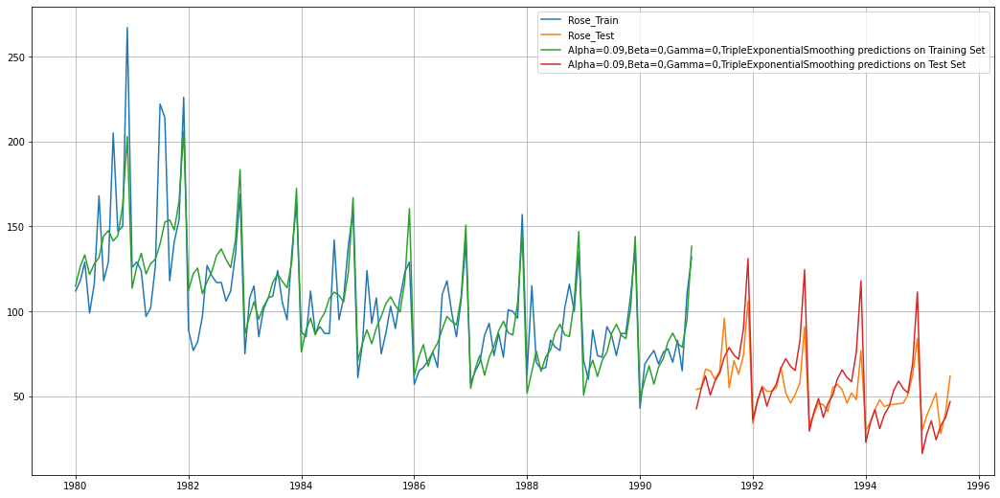

In [ ]:
## Plotting on both the Training and Test using autofit

plt.figure(figsize=(18,9))
plt.plot(rose_TES_train['Rose_Sales'], label='Rose_Train')
plt.plot(rose_TES_test['Rose_Sales'], label='Rose_Test')

plt.plot(rose_TES_train['Predict'], label='Alpha=0.09,Beta=0,Gamma=0,TripleExponentialSmoothing predictions on Training Set')
plt.plot(rose_TES_test['Predict'], label='Alpha=0.09,Beta=0,Gamma=0,TripleExponentialSmoothing predictions on Test Set')


plt.legend(loc='best')
plt.grid();

In [ ]:
rmse,mape=calculate_metrics(rose_TES_train['Rose_Sales'],rose_TES_train['Predict'])
rose_tempResultsDf_train = pd.DataFrame({'Train RMSE': [rmse], 'Train MAPE' : [mape]},index=['Rose_Triple Exponential Smoothing Alpha=0.08,Beta=0,Gamma=0.47'])
rose_resultsDf_train = pd.concat([rose_resultsDf_train, rose_tempResultsDf_train])
rose_resultsDf_train

,Train RMSE,Train MAPE
Rose_RegressionOnTime,30.718135,21.22
Rose_Naive,45.063760,36.38
Rose_Simple_Average,36.034234,25.39
Rose - SES Alpha=0,31.500869,22.73
"Rose_Alpha=0.1,SimpleExponentialSmoothing",36.034234,25.39
"Rose_Alpha=0.2,SimpleExponentialSmoothing",31.501015,22.71
"Rose_DES Alpha=0,Beta=0",2353.979880,2022.06
"Alpha=0,Beta=0.1,DoubleExponentialSmoothing",30.718135,21.22
"Rose_Triple Exponential Smoothing Alpha=0.08,Beta=0,Gamma=0.47",19.515361,13.31


In [ ]:
rmse,mape=calculate_metrics(rose_TES_test['Rose_Sales'],rose_TES_test['Predict'])
rose_tempResultsDf = pd.DataFrame({'Test RMSE': [rmse], 'Test MAPE' : [mape]},index=['Rose_Triple Exponential Smoothing Alpha=0.08,Beta=0,Gamma=0.47'])
rose_resultsDf = pd.concat([rose_resultsDf, rose_tempResultsDf])
rose_resultsDf

,Test RMSE,Test MAPE
Rose_RegressionOnTime,15.268955,22.82
Rose_Naive,17.740327,27.41
Rose_Simple_Average,15.759783,21.37
Rose_Trailing_MA_2,11.529278,13.54
Rose_Trailing_MA_3,14.451403,19.49
Rose_Trailing_MA_6,14.566327,20.82
Rose_Trailing_MA_9,14.727630,21.01
Rose - SES Alpha=0,36.796242,63.88
"Rose_Alpha=0.1,SimpleExponentialSmoothing",53.460570,94.93
"Rose_Alpha=0.2,SimpleExponentialSmoothing",36.828051,63.94


In [ ]:
## First we will define an empty dataframe to store our values from the loop

rose_resultsDf_TES = pd.DataFrame({'Alpha Values':[],'Beta Values':[],'Gamma Values':[],'Train RMSE':[],'Train MAPE':[]
                                ,'Test RMSE': [],'Test MAPE': []})
rose_resultsDf_TES

,Alpha Values,Beta Values,Gamma Values,Train RMSE,Train MAPE,Test RMSE,Test MAPE


In [ ]:
for i in np.arange(0,1.1,0.1):
    for j in np.arange(0.0,1.1,0.1):
        for k in np.arange(0,1.1,0.1):
            rose_model_TES_alpha_i_j_k = rose_model_TES.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=True,use_brute=True)
            rose_TES_train['predict',i,j,k] = rose_model_TES_alpha_i_j_k.fittedvalues
            rose_TES_test['predict',i,j,k] = rose_model_TES_alpha_i_j_k.forecast(steps=55)
        
            rmse_TES_train = metrics.mean_squared_error(rose_TES_train['Rose_Sales'],rose_TES_train['predict',i,j,k],squared=False)
            mape_TES_train = MAPE(rose_TES_train['Rose_Sales'],rose_TES_train['predict',i,j,k])
        
            rmse_TES_test = metrics.mean_squared_error(rose_TES_test['Rose_Sales'],rose_TES_test['predict',i,j,k],squared=False)
            mape_TES_test = MAPE(rose_TES_test['Rose_Sales'],rose_TES_test['predict',i,j,k])
        
            rose_resultsDf_TES = rose_resultsDf_TES.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,'Train RMSE':rmse_TES_train
                                      ,'Train MAPE': mape_TES_train,'Test RMSE':rmse_TES_test
                                      ,'Test MAPE':mape_TES_test}, ignore_index=True)

In [ ]:
rose_resultsDf_TES.sort_values('Test RMSE').head()

,Alpha Values,Beta Values,Gamma Values,Train RMSE,Train MAPE,Test RMSE,Test MAPE
81,0.0,0.7,0.4,21.799323,15.28,11.637434,15.38
48,0.0,0.4,0.4,21.799323,15.28,11.637435,15.38
37,0.0,0.3,0.4,21.799323,15.28,11.637436,15.38
103,0.0,0.9,0.4,21.799323,15.28,11.637436,15.38
70,0.0,0.6,0.4,21.799323,15.28,11.637436,15.38


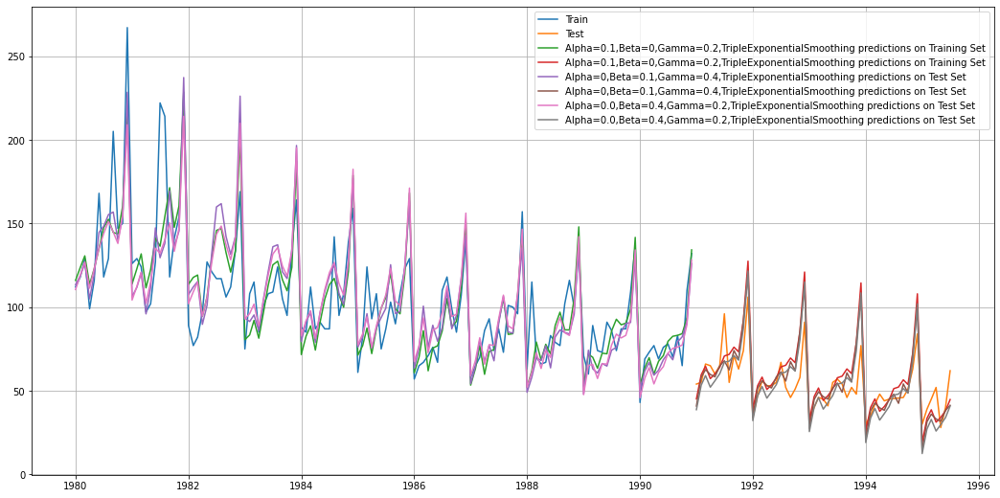

In [ ]:
## Plotting on both the Training and Test data using brute force alpha, beta and gamma determination

plt.figure(figsize=(18,9))
plt.plot(rose_TES_train['Rose_Sales'], label='Train')
plt.plot(rose_TES_test['Rose_Sales'], label='Test')

plt.plot(rose_TES_train['predict', 0.1, 0.0, 0.2], label='Alpha=0.1,Beta=0,Gamma=0.2,TripleExponentialSmoothing predictions on Training Set')
plt.plot(rose_TES_test['predict', 0.1, 0.0, 0.2], label='Alpha=0.1,Beta=0,Gamma=0.2,TripleExponentialSmoothing predictions on Training Set')

plt.plot(rose_TES_train['predict', 0.0, 0.1, 0.4], label='Alpha=0,Beta=0.1,Gamma=0.4,TripleExponentialSmoothing predictions on Test Set')
plt.plot(rose_TES_test['predict', 0.0, 0.1, 0.4], label='Alpha=0,Beta=0.1,Gamma=0.4,TripleExponentialSmoothing predictions on Test Set')

plt.plot(rose_TES_train['predict', 0.0, 0.4, 0.2], label='Alpha=0.0,Beta=0.4,Gamma=0.2,TripleExponentialSmoothing predictions on Test Set')
plt.plot(rose_TES_test['predict', 0.0, 0.4, 0.2], label='Alpha=0.0,Beta=0.4,Gamma=0.2,TripleExponentialSmoothing predictions on Test Set')


plt.legend(loc='best')
plt.grid();

In [ ]:
rose_resultsDf_TES=rose_resultsDf_TES.sort_values('Test RMSE', ascending=True)
rose_resultsDf_TES

,Alpha Values,Beta Values,Gamma Values,Train RMSE,Train MAPE,Test RMSE,Test MAPE
81,0.0,0.7,0.4,21.799323,15.28,11.637434,15.38
48,0.0,0.4,0.4,21.799323,15.28,11.637435,15.38
37,0.0,0.3,0.4,21.799323,15.28,11.637436,15.38
103,0.0,0.9,0.4,21.799323,15.28,11.637436,15.38
70,0.0,0.6,0.4,21.799323,15.28,11.637436,15.38
...,...,...,...,...,...,...,...
952,0.7,0.9,0.6,44.281806,33.24,1177.530905,1918.68
1085,0.8,1.0,0.7,43.293442,30.91,1188.779653,1939.73
1084,0.8,1.0,0.6,45.896866,33.27,1212.035421,1979.64
962,0.7,1.0,0.5,43.752137,32.21,1234.954161,2013.52


In [ ]:
rose_resultsDf_TES_2 = pd.DataFrame({'Train RMSE': [rose_resultsDf_TES['Train RMSE'][81],rose_resultsDf_TES['Train RMSE'][48],rose_resultsDf_TES['Train RMSE'][37]],
                                'Train MAPE':[rose_resultsDf_TES['Train MAPE'][81],rose_resultsDf_TES['Train MAPE'][48],rose_resultsDf_TES['Train MAPE'][37]]}
                           ,index=['Alpha=0,Beta=0.7,Gamma=0.4,TripleExponentialSmoothing','Alpha=0,Beta=0.4,Gamma=0.4,TripleExponentialSmoothing','Alpha=0,Beta=0.3,Gamma=0.4,TripleExponentialSmoothing'])

rose_resultsDf_train = pd.concat([rose_resultsDf_train, rose_resultsDf_TES_2])
rose_resultsDf_train

,Train RMSE,Train MAPE
Rose_RegressionOnTime,30.718135,21.22
Rose_Naive,45.063760,36.38
Rose_Simple_Average,36.034234,25.39
Rose - SES Alpha=0,31.500869,22.73
"Rose_Alpha=0.1,SimpleExponentialSmoothing",36.034234,25.39
"Rose_Alpha=0.2,SimpleExponentialSmoothing",31.501015,22.71
"Rose_DES Alpha=0,Beta=0",2353.979880,2022.06
"Alpha=0,Beta=0.1,DoubleExponentialSmoothing",30.718135,21.22
"Rose_Triple Exponential Smoothing Alpha=0.08,Beta=0,Gamma=0.47",19.515361,13.31
"Alpha=0,Beta=0.7,Gamma=0.4,TripleExponentialSmoothing",21.799323,15.28


In [ ]:
rose_resultsDf_train[-4:]

,Train RMSE,Train MAPE
"Rose_Triple Exponential Smoothing Alpha=0.08,Beta=0,Gamma=0.47",19.515361,13.31
"Alpha=0,Beta=0.7,Gamma=0.4,TripleExponentialSmoothing",21.799323,15.28
"Alpha=0,Beta=0.4,Gamma=0.4,TripleExponentialSmoothing",21.799323,15.28
"Alpha=0,Beta=0.3,Gamma=0.4,TripleExponentialSmoothing",21.799323,15.28


In [ ]:
rose_resultsDf_TES_1 = pd.DataFrame({'Test RMSE': [rose_resultsDf_TES['Test RMSE'][81],rose_resultsDf_TES['Test RMSE'][48],rose_resultsDf_TES['Test RMSE'][37]],
                                'Test MAPE':[rose_resultsDf_TES['Test MAPE'][81],rose_resultsDf_TES['Test MAPE'][48],rose_resultsDf_TES['Test MAPE'][37]]}
                           ,index=['Alpha=0,Beta=0.7,Gamma=0.4,TripleExponentialSmoothing','Alpha=0,Beta=0.4,Gamma=0.4,TripleExponentialSmoothing','Alpha=0,Beta=0.3,Gamma=0.4,TripleExponentialSmoothing'])

rose_resultsDf = pd.concat([rose_resultsDf, rose_resultsDf_TES_1])
rose_resultsDf

,Test RMSE,Test MAPE
Rose_RegressionOnTime,15.268955,22.82
Rose_Naive,17.740327,27.41
Rose_Simple_Average,15.759783,21.37
Rose_Trailing_MA_2,11.529278,13.54
Rose_Trailing_MA_3,14.451403,19.49
Rose_Trailing_MA_6,14.566327,20.82
Rose_Trailing_MA_9,14.727630,21.01
Rose - SES Alpha=0,36.796242,63.88
"Rose_Alpha=0.1,SimpleExponentialSmoothing",53.460570,94.93
"Rose_Alpha=0.2,SimpleExponentialSmoothing",36.828051,63.94


In [ ]:
rose_resultsDf[-4:]

,Test RMSE,Test MAPE
"Rose_Triple Exponential Smoothing Alpha=0.08,Beta=0,Gamma=0.47",14.259408,19.25
"Alpha=0,Beta=0.7,Gamma=0.4,TripleExponentialSmoothing",11.637434,15.38
"Alpha=0,Beta=0.4,Gamma=0.4,TripleExponentialSmoothing",11.637435,15.38
"Alpha=0,Beta=0.3,Gamma=0.4,TripleExponentialSmoothing",11.637436,15.38


In [ ]:
rose_resultsDf.sort_values('Test RMSE')

,Test RMSE,Test MAPE
Rose_Trailing_MA_2,11.529278,13.54
"Alpha=0,Beta=0.7,Gamma=0.4,TripleExponentialSmoothing",11.637434,15.38
"Alpha=0,Beta=0.4,Gamma=0.4,TripleExponentialSmoothing",11.637435,15.38
"Alpha=0,Beta=0.3,Gamma=0.4,TripleExponentialSmoothing",11.637436,15.38
"Rose_Triple Exponential Smoothing Alpha=0.08,Beta=0,Gamma=0.47",14.259408,19.25
Rose_Trailing_MA_3,14.451403,19.49
Rose_Trailing_MA_6,14.566327,20.82
Rose_Trailing_MA_9,14.727630,21.01
Rose_RegressionOnTime,15.268955,22.82
"Alpha=0,Beta=0.1,DoubleExponentialSmoothing",15.268956,22.82


## **5. Check for the stationarity of the data on which the model is being built on using appropriate statistical tests and also mention the hypothesis for the statistical test. If the data is found to be non-stationary, take appropriate steps to make it stationary. Check the new data for stationarity and comment. Note: Stationarity should be checked at alpha = 0.05**

Augmented Dickey Fuller Test Null hypothesis : TS is non-stationary. Alternate hypothesis : Time Series is Stationary

In [ ]:
## Test for stationarity of the series - Dicky Fuller test

def test_stationarity(timeseries, color):
    
    #Determing rolling statistics
    rolmean = timeseries.rolling(window=2).mean() #determining the rolling mean
    rolstd = timeseries.rolling(window=2).std()   #determining the rolling standard deviation

    #Plot rolling statistics:
    orig = plt.plot(timeseries, color=color,label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    #Perform Dickey-Fuller test:
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput,'\n')

## **Sparkling**

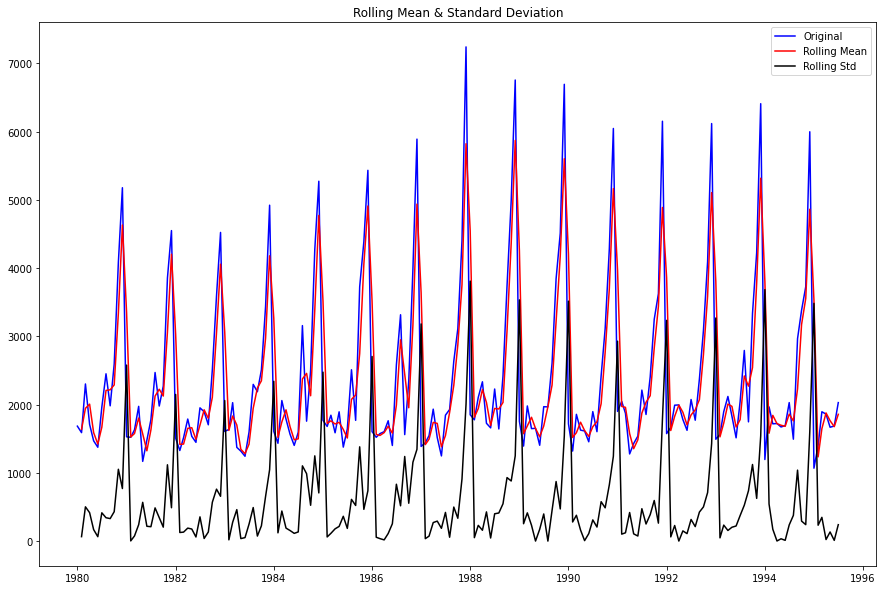

Results of Dickey-Fuller Test:
Test Statistic                  -1.360497
p-value                          0.601061
#Lags Used                      11.000000
Number of Observations Used    175.000000
Critical Value (1%)             -3.468280
Critical Value (5%)             -2.878202
Critical Value (10%)            -2.575653
dtype: float64 



In [ ]:
plt.figure(figsize=(15,10))
test_stationarity(sparkling['Sparkling_Sales'], 'blue')

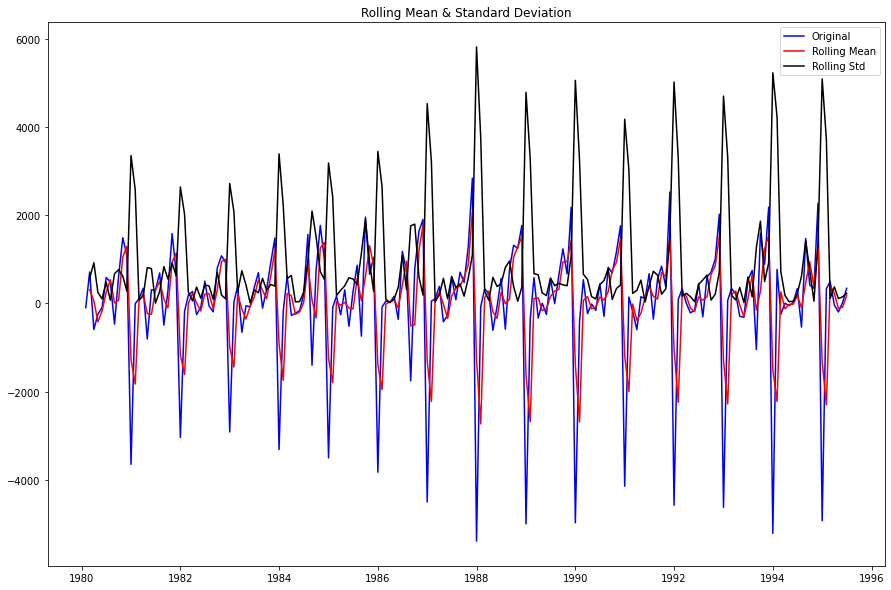

Results of Dickey-Fuller Test:
Test Statistic                 -45.050301
p-value                          0.000000
#Lags Used                      10.000000
Number of Observations Used    175.000000
Critical Value (1%)             -3.468280
Critical Value (5%)             -2.878202
Critical Value (10%)            -2.575653
dtype: float64 



In [ ]:
plt.figure(figsize=(15,10))
test_stationarity(sparkling['Sparkling_Sales'].diff().dropna(), 'blue')

## **Rose**

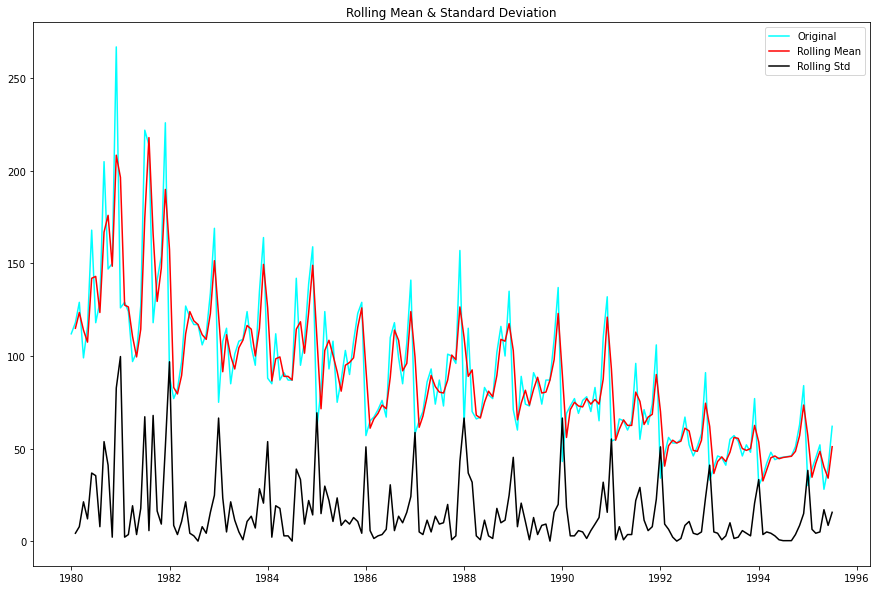

Results of Dickey-Fuller Test:
Test Statistic                  -1.876699
p-value                          0.343101
#Lags Used                      13.000000
Number of Observations Used    173.000000
Critical Value (1%)             -3.468726
Critical Value (5%)             -2.878396
Critical Value (10%)            -2.575756
dtype: float64 



In [ ]:
plt.figure(figsize=(15,10))
test_stationarity(rose['Rose_Sales'], 'cyan')

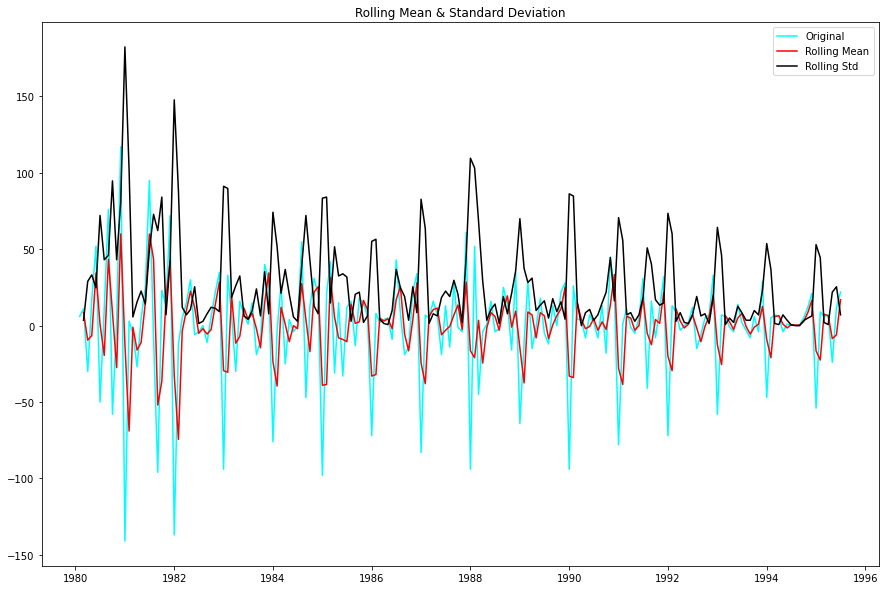

Results of Dickey-Fuller Test:
Test Statistic                -8.044392e+00
p-value                        1.810895e-12
#Lags Used                     1.200000e+01
Number of Observations Used    1.730000e+02
Critical Value (1%)           -3.468726e+00
Critical Value (5%)           -2.878396e+00
Critical Value (10%)          -2.575756e+00
dtype: float64 



In [ ]:
plt.figure(figsize=(15,10))
test_stationarity(rose['Rose_Sales'].diff().dropna(), 'cyan')

## **6. Build an automated version of the ARIMA/SARIMA model in which the parameters are selected using the lowest Akaike Information Criteria (AIC) on the training data and evaluate this model on the test data using RMSE**

## **ARIMA**

## **Sparkling**

In [ ]:
sparkling_ARIMA_train=sparkling[sparkling.index.year<1991]
sparkling_ARIMA_test=sparkling[sparkling.index.year>1990]

In [ ]:
## The following loop helps us in getting a combination of different parameters of p and q in the range of 0 and 2
## We have kept the value of d as 1 as we need to take a difference of the series to make it stationary.

import itertools
p = q = range(0, 3)
d= range(1,2)
pdq = list(itertools.product(p, d, q))
print('Some parameter combinations for the Model...')
for i in range(1,len(pdq)):
    print('Model: {}'.format(pdq[i]))

Some parameter combinations for the Model...
Model: (0, 1, 1)
Model: (0, 1, 2)
Model: (1, 1, 0)
Model: (1, 1, 1)
Model: (1, 1, 2)
Model: (2, 1, 0)
Model: (2, 1, 1)
Model: (2, 1, 2)


In [ ]:
# Creating an empty Dataframe with column names only
sparkling_ARIMA_AIC = pd.DataFrame(columns=['param', 'AIC'])
sparkling_ARIMA_AIC

,param,AIC


In [ ]:
for param in pdq:
    sparkling_ARIMA_model = ARIMA(sparkling_ARIMA_train['Sparkling_Sales'].values,order=param,).fit()
    sparkling_ARIMA_AIC = sparkling_ARIMA_AIC.append({'param':param, 'AIC': sparkling_ARIMA_model.aic}, ignore_index=True)

In [ ]:
## Sort the above AIC values in the ascending order to get the parameters for the minimum AIC value

sparkling_ARIMA_AIC.sort_values(by='AIC',ascending=True)

,param,AIC
8,"(2, 1, 2)",2213.509214
7,"(2, 1, 1)",2233.777626
2,"(0, 1, 2)",2234.408323
5,"(1, 1, 2)",2234.527200
4,"(1, 1, 1)",2235.755095
6,"(2, 1, 0)",2260.365744
1,"(0, 1, 1)",2263.060016
3,"(1, 1, 0)",2266.608539
0,"(0, 1, 0)",2267.663036


In [ ]:
sparkling_auto_ARIMA = ARIMA(sparkling_ARIMA_train['Sparkling_Sales'], order=(2,1,2),freq='MS')
sparkling_results_auto_ARIMA = sparkling_auto_ARIMA.fit()

sparkling_results_auto_ARIMA.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:        Sparkling_Sales   No. Observations:                  132
Model:                 ARIMA(2, 1, 2)   Log Likelihood               -1101.755
Date:                Sat, 12 Feb 2022   AIC                           2213.509
Time:                        12:16:16   BIC                           2227.885
Sample:                    01-01-1980   HQIC                          2219.351
                         - 12-01-1990                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.3121      0.046     28.782      0.000       1.223       1.401
ar.L2         -0.5593      0.072     -7.737      0.000      -0.701      -0.418
ma.L1         -1.9917      0.109    -18.205      0.000      -2.206      -1.777
ma.L2          0.9999      0.110      9.103      0.000       0.785       1.215
sigma2      1.099e+06      2e-07    5.5e+12      0.000     1.1e+06     1.1e+06
===================================================================================
Ljung-Box (L1) (Q):                   0.19   Jarque-Bera (JB):                14.46
Prob(Q):                              0.67   Prob(JB):                         0.00
Heteroskedasticity (H):               2.43   Skew:                             0.61
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.08
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 6.58e+28. Standard errors may be unstable.
"""

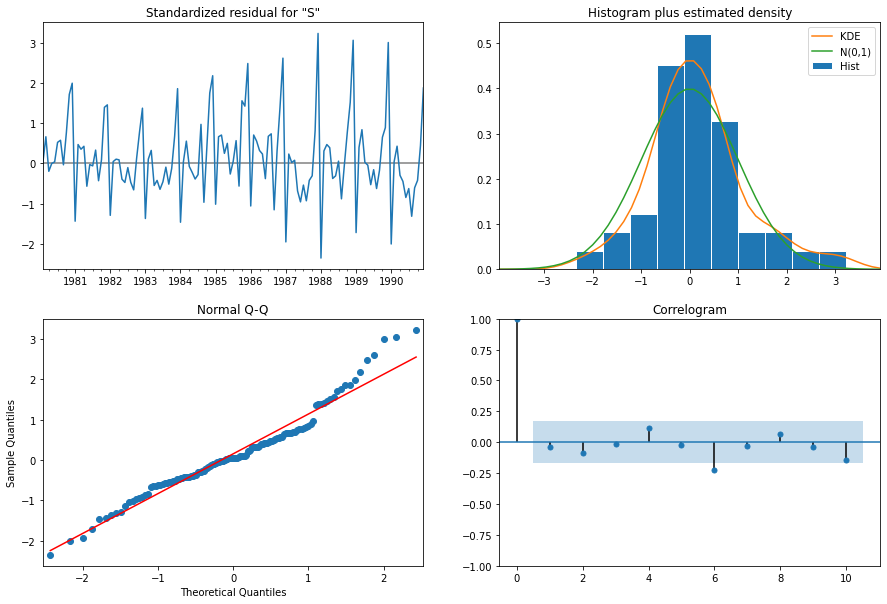

In [ ]:
sparkling_results_auto_ARIMA.plot_diagnostics(figsize=(15,10));

In [ ]:
sparkling_ARIMA_test['Predicted'] = sparkling_results_auto_ARIMA.forecast(steps=len(sparkling_ARIMA_test))

In [ ]:
rmse,mape=calculate_metrics(sparkling_ARIMA_test['Sparkling_Sales'],sparkling_ARIMA_test['Predicted'])
sparkling_tempResultsDf = pd.DataFrame({'Test RMSE': [rmse],
                                'Test MAPE':[mape]}
                           ,index=['Sparkling_Auto ARIMA (2,1,2)'])

sparkling_resultsDf = pd.concat([sparkling_resultsDf, sparkling_tempResultsDf])
sparkling_resultsDf

,Test RMSE,Test MAPE
Sparkling_RegressionOnTime,1389.135175,50.15
Sparkling_Naive,1327.156057,32.90
Sparkling_Simple_Average,1275.073380,38.81
Sparkling_Trailing_MA_2,813.400684,19.70
Sparkling_Trailing_MA_3,1156.589694,35.96
Sparkling_Trailing_MA_6,1283.927428,43.86
Sparkling_Trailing_MA_9,1346.278315,46.86
Sparkling_SES Alpha=0,1316.034674,45.47
"Sparkling_Alpha=0.1,SimpleExponentialSmoothing",1275.081797,38.90
"Sparkling_Alpha=0.2,SimpleExponentialSmoothing",1375.393526,49.53


In [ ]:
sparkling_resultsDf[-1:]

,Test RMSE,Test MAPE
"Sparkling_Auto ARIMA (2,1,2)",1299.97877,43.2


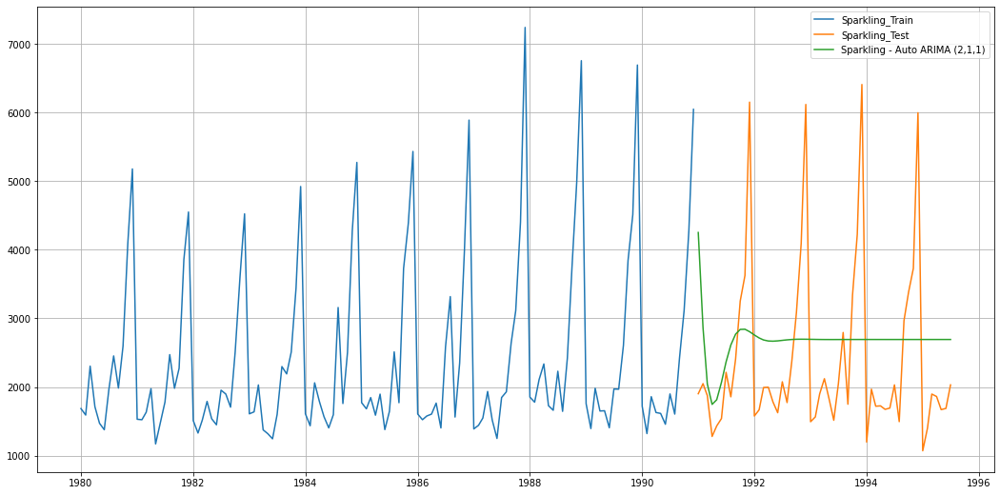

In [ ]:
## Plotting on both the Training and Test using autofit

plt.figure(figsize=(18,9))
plt.plot(sparkling_ARIMA_train['Sparkling_Sales'], label='Sparkling_Train')
plt.plot(sparkling_ARIMA_test['Sparkling_Sales'], label='Sparkling_Test')

plt.plot(sparkling_ARIMA_test['Predicted'], label='Sparkling - Auto ARIMA (2,1,1)')


plt.legend(loc='best')
plt.grid();

## **Rose**

In [ ]:
rose_ARIMA_train=rose[rose.index.year<1991]
rose_ARIMA_test=rose[rose.index.year>1990]

In [ ]:
## The following loop helps us in getting a combination of different parameters of p and q in the range of 0 and 2
## We have kept the value of d as 1 as we need to take a difference of the series to make it stationary.

import itertools
p = q = range(0, 3)
d= range(1,2)
pdq = list(itertools.product(p, d, q))
print('Some parameter combinations for the Model...')
for i in range(1,len(pdq)):
    print('Model: {}'.format(pdq[i]))

Some parameter combinations for the Model...
Model: (0, 1, 1)
Model: (0, 1, 2)
Model: (1, 1, 0)
Model: (1, 1, 1)
Model: (1, 1, 2)
Model: (2, 1, 0)
Model: (2, 1, 1)
Model: (2, 1, 2)


In [ ]:
# Creating an empty Dataframe with column names only
rose_ARIMA_AIC = pd.DataFrame(columns=['param', 'AIC'])
rose_ARIMA_AIC

,param,AIC


In [ ]:
for param in pdq:
    rose_ARIMA_model = ARIMA(rose_ARIMA_train['Rose_Sales'].values,order=param,).fit()
    rose_ARIMA_AIC = rose_ARIMA_AIC.append({'param':param, 'AIC': rose_ARIMA_model.aic}, ignore_index=True)

In [ ]:
## Sort the above AIC values in the ascending order to get the parameters for the minimum AIC value

rose_ARIMA_AIC.sort_values(by='AIC',ascending=True)

,param,AIC
2,"(0, 1, 2)",1279.671529
5,"(1, 1, 2)",1279.870723
4,"(1, 1, 1)",1280.574230
7,"(2, 1, 1)",1281.507862
8,"(2, 1, 2)",1281.870722
1,"(0, 1, 1)",1282.309832
6,"(2, 1, 0)",1298.611034
3,"(1, 1, 0)",1317.350311
0,"(0, 1, 0)",1333.154673


In [ ]:
rose_auto_ARIMA = ARIMA(rose_ARIMA_train['Rose_Sales'], order=(0,1,2),freq='MS')
rose_results_auto_ARIMA = rose_auto_ARIMA.fit()

rose_results_auto_ARIMA.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:             Rose_Sales   No. Observations:                  132
Model:                 ARIMA(0, 1, 2)   Log Likelihood                -636.836
Date:                Sat, 12 Feb 2022   AIC                           1279.672
Time:                        12:16:19   BIC                           1288.297
Sample:                    01-01-1980   HQIC                          1283.176
                         - 12-01-1990                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.6970      0.072     -9.689      0.000      -0.838      -0.556
ma.L2         -0.2042      0.073     -2.794      0.005      -0.347      -0.061
sigma2       965.8407     88.305     10.938      0.000     792.766    1138.915
===================================================================================
Ljung-Box (L1) (Q):                   0.14   Jarque-Bera (JB):                39.24
Prob(Q):                              0.71   Prob(JB):                         0.00
Heteroskedasticity (H):               0.36   Skew:                             0.82
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.13
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

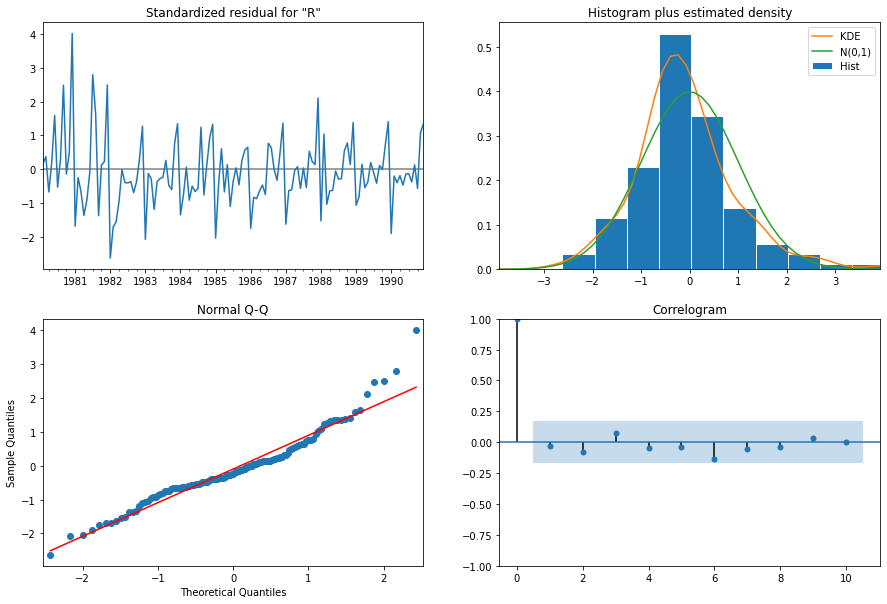

In [ ]:
rose_results_auto_ARIMA.plot_diagnostics(figsize=(15,10));

In [ ]:
rose_ARIMA_test['Predicted'] = rose_results_auto_ARIMA.forecast(steps=len(rose_ARIMA_test))

In [ ]:
rmse,mape=calculate_metrics(rose_ARIMA_test['Rose_Sales'],rose_ARIMA_test['Predicted'])
rose_tempResultsDf = pd.DataFrame({'Test RMSE': [rmse],
                                'Test MAPE':[mape]}
                           ,index=['Rose_Auto ARIMA (0,1,2)'])

rose_resultsDf = pd.concat([rose_resultsDf, rose_tempResultsDf])
rose_resultsDf

,Test RMSE,Test MAPE
Rose_RegressionOnTime,15.268955,22.82
Rose_Naive,17.740327,27.41
Rose_Simple_Average,15.759783,21.37
Rose_Trailing_MA_2,11.529278,13.54
Rose_Trailing_MA_3,14.451403,19.49
Rose_Trailing_MA_6,14.566327,20.82
Rose_Trailing_MA_9,14.727630,21.01
Rose - SES Alpha=0,36.796242,63.88
"Rose_Alpha=0.1,SimpleExponentialSmoothing",53.460570,94.93
"Rose_Alpha=0.2,SimpleExponentialSmoothing",36.828051,63.94


In [ ]:
rose_resultsDf[-1:]

,Test RMSE,Test MAPE
"Rose_Auto ARIMA (0,1,2)",37.30648,64.81


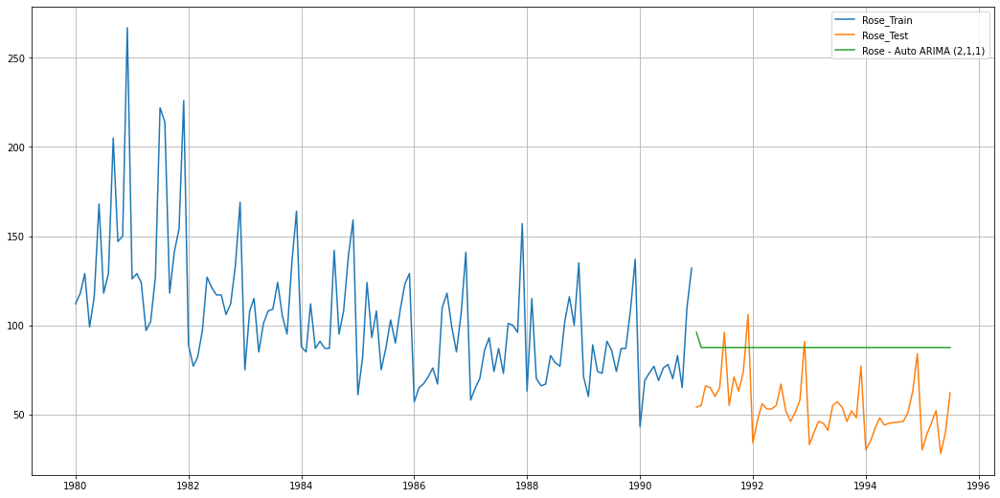

In [ ]:
## Plotting on both the Training and Test using autofit

plt.figure(figsize=(18,9))
plt.plot(rose_ARIMA_train['Rose_Sales'], label='Rose_Train')
plt.plot(rose_ARIMA_test['Rose_Sales'], label='Rose_Test')

plt.plot(rose_ARIMA_test['Predicted'], label='Rose - Auto ARIMA (2,1,1)')


plt.legend(loc='best')
plt.grid();

## **SARIMA**

## **Sparkling**

In [ ]:
sparkling_SARIMA_train=sparkling[sparkling.index.year<1991]
sparkling_SARIMA_test=sparkling[sparkling.index.year>1990]

In [ ]:
### As the dataset has seasonality.. Let's build the model with SARIMA
sparkling_SARIMA_result_df = pd.DataFrame(columns=['param','seasonal', 'AIC'])
sparkling_SARIMA_result_df

,param,seasonal,AIC


In [ ]:
import itertools
p = q = range(0, 3)
d= range(1,2)
D=range(0,2)
pdq = list(itertools.product(p, d, q))

PDQ = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, D, q))]
print('Examples of parameter combinations for Model...')
for i in range(1,len(pdq)):
    print('Model: {}{}'.format(pdq[i], PDQ[i]))

Examples of parameter combinations for Model...
Model: (0, 1, 1)(0, 0, 1, 12)
Model: (0, 1, 2)(0, 0, 2, 12)
Model: (1, 1, 0)(0, 1, 0, 12)
Model: (1, 1, 1)(0, 1, 1, 12)
Model: (1, 1, 2)(0, 1, 2, 12)
Model: (2, 1, 0)(1, 0, 0, 12)
Model: (2, 1, 1)(1, 0, 1, 12)
Model: (2, 1, 2)(1, 0, 2, 12)


In [ ]:
import statsmodels.api as sm
for param in pdq:
    for param_seasonal in PDQ:
        sparkling_mod = sm.tsa.statespace.SARIMAX(sparkling_SARIMA_train['Sparkling_Sales'],
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False,freq='MS')
            
        sparkling_SARIMA_model_result = sparkling_mod.fit()
        sparkling_SARIMA_result_df = sparkling_SARIMA_result_df.append({'param':param,'seasonal':param_seasonal ,'AIC': sparkling_SARIMA_model_result.aic}, ignore_index=True)

In [ ]:
sparkling_SARIMA_result_df.sort_values("AIC")

,param,seasonal,AIC
95,"(1, 1, 2)","(0, 1, 2, 12)",1382.347780
41,"(0, 1, 2)","(0, 1, 2, 12)",1382.484254
101,"(1, 1, 2)","(1, 1, 2, 12)",1384.137874
149,"(2, 1, 2)","(0, 1, 2, 12)",1384.317618
47,"(0, 1, 2)","(1, 1, 2, 12)",1384.398867
...,...,...,...
72,"(1, 1, 1)","(0, 0, 0, 12)",2204.934049
108,"(2, 1, 0)","(0, 0, 0, 12)",2227.302762
18,"(0, 1, 1)","(0, 0, 0, 12)",2230.162908
54,"(1, 1, 0)","(0, 0, 0, 12)",2250.318127


In [ ]:
sparkling_auto_SARIMA=sm.tsa.statespace.SARIMAX(sparkling_SARIMA_train['Sparkling_Sales'],
                                            order=(1,1,2),
                                            seasonal_order=(0,1,2,12),
                                            enforce_stationarity=False,
                                            enforce_invertibility=False,freq='MS')
sparkling_results_auto_SARIMA = sparkling_auto_SARIMA.fit(maxiter=1000)
sparkling_results_auto_SARIMA.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                    Sparkling_Sales   No. Observations:                  132
Model:             SARIMAX(1, 1, 2)x(0, 1, 2, 12)   Log Likelihood                -685.174
Date:                            Sat, 12 Feb 2022   AIC                           1382.348
Time:                                    12:18:25   BIC                           1397.479
Sample:                                01-01-1980   HQIC                          1388.455
                                     - 12-01-1990                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5507      0.287     -1.922      0.055      -1.112       0.011
ma.L1         -0.1612      0.235     -0.687      0.492      -0.621       0.299
ma.L2         -0.7218      0.175     -4.132      0.000      -1.064      -0.379
ma.S.L12      -0.4062      0.092     -4.401      0.000      -0.587      -0.225
ma.S.L24      -0.0274      0.138     -0.198      0.843      -0.298       0.243
sigma2      1.705e+05   2.45e+04      6.956      0.000    1.22e+05    2.19e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                13.48
Prob(Q):                              0.95   Prob(JB):                         0.00
Heteroskedasticity (H):               0.89   Skew:                             0.60
Prob(H) (two-sided):                  0.75   Kurtosis:                         4.44
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

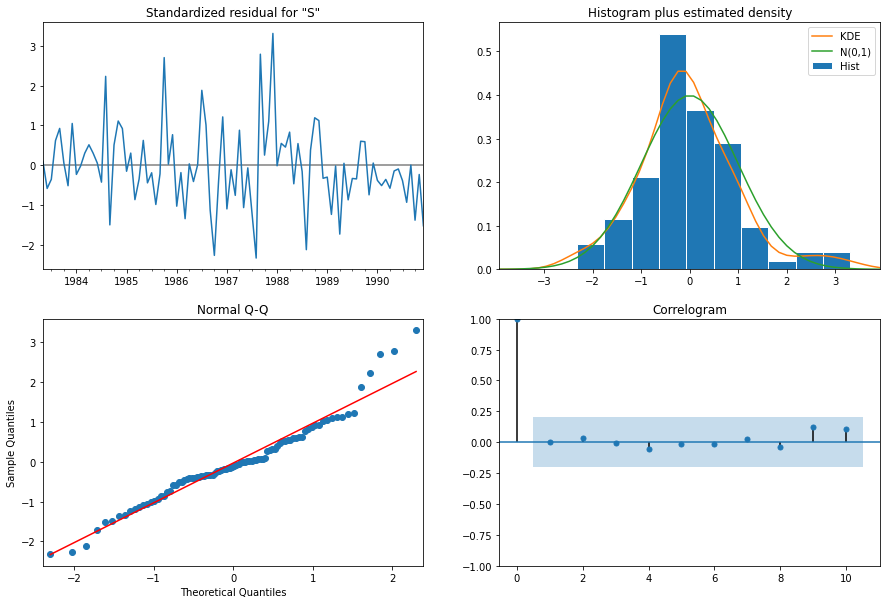

In [ ]:
sparkling_results_auto_SARIMA.plot_diagnostics(figsize=(15,10));

In [ ]:
sparkling_SARIMA_test['Predicted'] = sparkling_results_auto_SARIMA.forecast(steps=len(sparkling_SARIMA_test))

In [ ]:
rmse,mape=calculate_metrics(sparkling_SARIMA_test['Sparkling_Sales'],sparkling_SARIMA_test['Predicted'])
sparkling_tempResultsDf = pd.DataFrame({'Test RMSE': [rmse],
                                'Test MAPE':[mape]}
                           ,index=['Sparkling_Auto SARIMA (1,1,2), (0, 1,2),12'])

sparkling_resultsDf = pd.concat([sparkling_resultsDf, sparkling_tempResultsDf])
sparkling_resultsDf

,Test RMSE,Test MAPE
Sparkling_RegressionOnTime,1389.135175,50.15
Sparkling_Naive,1327.156057,32.90
Sparkling_Simple_Average,1275.073380,38.81
Sparkling_Trailing_MA_2,813.400684,19.70
Sparkling_Trailing_MA_3,1156.589694,35.96
Sparkling_Trailing_MA_6,1283.927428,43.86
Sparkling_Trailing_MA_9,1346.278315,46.86
Sparkling_SES Alpha=0,1316.034674,45.47
"Sparkling_Alpha=0.1,SimpleExponentialSmoothing",1275.081797,38.90
"Sparkling_Alpha=0.2,SimpleExponentialSmoothing",1375.393526,49.53


In [ ]:
sparkling_resultsDf[-1:]

,Test RMSE,Test MAPE
"Sparkling_Auto SARIMA (1,1,2), (0, 1,2),12",382.576713,12.87


In [ ]:
sparkling_resultsDf.sort_values('Test RMSE')

,Test RMSE,Test MAPE
"Sparkling_Alpha=0.1,Beta=0,Gamma=0.2,TripleExponentialSmoothing",304.271535,9.44
"Sparkling_Alpha=0.9,Beta=0,Gamma=0.2,TripleExponentialSmoothing",314.589055,9.50
"Sparkling_Alpha=0.7,Beta=0,Gamma=0.2,TripleExponentialSmoothing",314.679904,9.37
"Sparkling - Triple Exponential Smoothing Alpha=0.1,Beta=0.5,Gamma=0.1",378.626253,12.87
"Sparkling_Auto SARIMA (1,1,2), (0, 1,2),12",382.576713,12.87
Sparkling_Trailing_MA_2,813.400684,19.70
Sparkling_Trailing_MA_3,1156.589694,35.96
Sparkling_Simple_Average,1275.073380,38.81
"Sparkling_Alpha=0.1,SimpleExponentialSmoothing",1275.081797,38.90
Sparkling_Trailing_MA_6,1283.927428,43.86


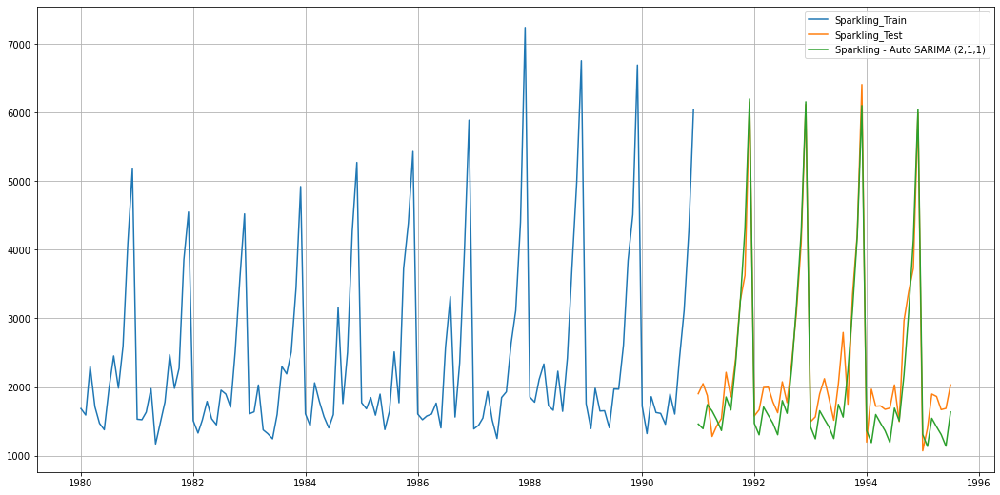

In [ ]:
## Plotting on both the Training and Test using autofit

plt.figure(figsize=(18,9))
plt.plot(sparkling_SARIMA_train['Sparkling_Sales'], label='Sparkling_Train')
plt.plot(sparkling_ARIMA_test['Sparkling_Sales'], label='Sparkling_Test')

plt.plot(sparkling_SARIMA_test['Predicted'], label='Sparkling - Auto SARIMA (2,1,1)')


plt.legend(loc='best')
plt.grid();

## **Rose**

In [ ]:
rose_SARIMA_train=rose[rose.index.year<1991]
rose_SARIMA_test=rose[rose.index.year>1990]

In [ ]:
### As the dataset has seasonality.. Let's build the model with SARIMA
rose_SARIMA_result_df = pd.DataFrame(columns=['param','seasonal', 'AIC'])
rose_SARIMA_result_df

,param,seasonal,AIC


In [ ]:
import itertools
p = q = range(0, 3)
d= range(1,2)
D=range(0,2)
pdq = list(itertools.product(p, d, q))

PDQ = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, D, q))]
print('Examples of parameter combinations for Model...')
for i in range(1,len(pdq)):
    print('Model: {}{}'.format(pdq[i], PDQ[i]))

Examples of parameter combinations for Model...
Model: (0, 1, 1)(0, 0, 1, 12)
Model: (0, 1, 2)(0, 0, 2, 12)
Model: (1, 1, 0)(0, 1, 0, 12)
Model: (1, 1, 1)(0, 1, 1, 12)
Model: (1, 1, 2)(0, 1, 2, 12)
Model: (2, 1, 0)(1, 0, 0, 12)
Model: (2, 1, 1)(1, 0, 1, 12)
Model: (2, 1, 2)(1, 0, 2, 12)


In [ ]:
import statsmodels.api as sm
for param in pdq:
    for param_seasonal in PDQ:
        rose_mod = sm.tsa.statespace.SARIMAX(rose_SARIMA_train['Rose_Sales'],
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False,freq='MS')
            
        rose_SARIMA_model_result = rose_mod.fit()
        rose_SARIMA_result_df = rose_SARIMA_result_df.append({'param':param,'seasonal':param_seasonal ,'AIC': rose_SARIMA_model_result.aic}, ignore_index=True)

In [ ]:
rose_SARIMA_result_df.sort_values("AIC").head()

,param,seasonal,AIC
53,"(0, 1, 2)","(2, 1, 2, 12)",774.969119
107,"(1, 1, 2)","(2, 1, 2, 12)",776.940194
161,"(2, 1, 2)","(2, 1, 2, 12)",777.649629
35,"(0, 1, 1)","(2, 1, 2, 12)",782.153872
160,"(2, 1, 2)","(2, 1, 1, 12)",783.703652


In [ ]:
rose_auto_SARIMA=sm.tsa.statespace.SARIMAX(rose_SARIMA_train['Rose_Sales'],
                                            order=(0,1,2),
                                            seasonal_order=(2,1,2,12),
                                            enforce_stationarity=False,
                                            enforce_invertibility=False,freq='MS')
rose_results_auto_SARIMA = rose_auto_SARIMA.fit(maxiter=1000)
rose_results_auto_SARIMA.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                         Rose_Sales   No. Observations:                  132
Model:             SARIMAX(0, 1, 2)x(2, 1, 2, 12)   Log Likelihood                -380.485
Date:                            Sat, 12 Feb 2022   AIC                            774.969
Time:                                    12:20:22   BIC                            792.622
Sample:                                01-01-1980   HQIC                           782.094
                                     - 12-01-1990                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9524      0.184     -5.166      0.000      -1.314      -0.591
ma.L2         -0.0764      0.126     -0.605      0.545      -0.324       0.171
ar.S.L12       0.0480      0.177      0.271      0.786      -0.299       0.395
ar.S.L24      -0.0419      0.028     -1.513      0.130      -0.096       0.012
ma.S.L12      -0.7526      0.301     -2.503      0.012      -1.342      -0.163
ma.S.L24      -0.0721      0.204     -0.354      0.723      -0.471       0.327
sigma2       187.8671     45.275      4.149      0.000      99.130     276.604
===================================================================================
Ljung-Box (L1) (Q):                   0.06   Jarque-Bera (JB):                 4.86
Prob(Q):                              0.81   Prob(JB):                         0.09
Heteroskedasticity (H):               0.91   Skew:                             0.41
Prob(H) (two-sided):                  0.79   Kurtosis:                         3.77
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

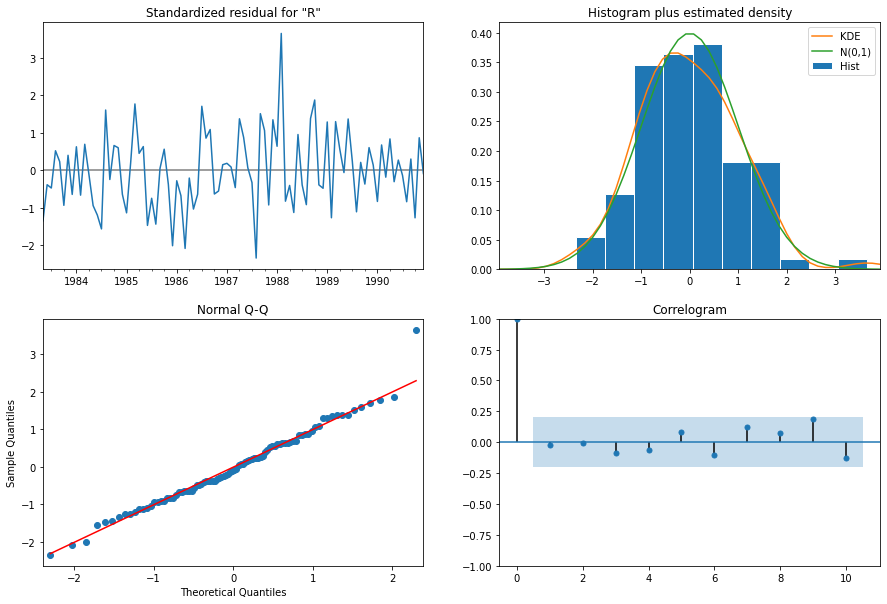

In [ ]:
rose_results_auto_SARIMA.plot_diagnostics(figsize=(15,10));

In [ ]:
rose_SARIMA_test['Predicted'] = rose_results_auto_SARIMA.forecast(steps=len(rose_SARIMA_test))

In [ ]:
rmse,mape=calculate_metrics(rose_SARIMA_test['Rose_Sales'],rose_SARIMA_test['Predicted'])
rose_tempResultsDf = pd.DataFrame({'Test RMSE': [rmse],
                                'Test MAPE':[mape]}
                           ,index=['Rose_Auto SARIMA (0,1,2),(2,1,2),12'])

rose_resultsDf = pd.concat([rose_resultsDf, rose_tempResultsDf])
rose_resultsDf

,Test RMSE,Test MAPE
Rose_RegressionOnTime,15.268955,22.82
Rose_Naive,17.740327,27.41
Rose_Simple_Average,15.759783,21.37
Rose_Trailing_MA_2,11.529278,13.54
Rose_Trailing_MA_3,14.451403,19.49
Rose_Trailing_MA_6,14.566327,20.82
Rose_Trailing_MA_9,14.727630,21.01
Rose - SES Alpha=0,36.796242,63.88
"Rose_Alpha=0.1,SimpleExponentialSmoothing",53.460570,94.93
"Rose_Alpha=0.2,SimpleExponentialSmoothing",36.828051,63.94


In [ ]:
rose_resultsDf[-1:]

,Test RMSE,Test MAPE
"Rose_Auto SARIMA (0,1,2),(2,1,2),12",16.500138,24.77


In [ ]:
rose_resultsDf.sort_values('Test RMSE')

,Test RMSE,Test MAPE
Rose_Trailing_MA_2,11.529278,13.54
"Alpha=0,Beta=0.7,Gamma=0.4,TripleExponentialSmoothing",11.637434,15.38
"Alpha=0,Beta=0.4,Gamma=0.4,TripleExponentialSmoothing",11.637435,15.38
"Alpha=0,Beta=0.3,Gamma=0.4,TripleExponentialSmoothing",11.637436,15.38
"Rose_Triple Exponential Smoothing Alpha=0.08,Beta=0,Gamma=0.47",14.259408,19.25
Rose_Trailing_MA_3,14.451403,19.49
Rose_Trailing_MA_6,14.566327,20.82
Rose_Trailing_MA_9,14.727630,21.01
Rose_RegressionOnTime,15.268955,22.82
"Alpha=0,Beta=0.1,DoubleExponentialSmoothing",15.268956,22.82


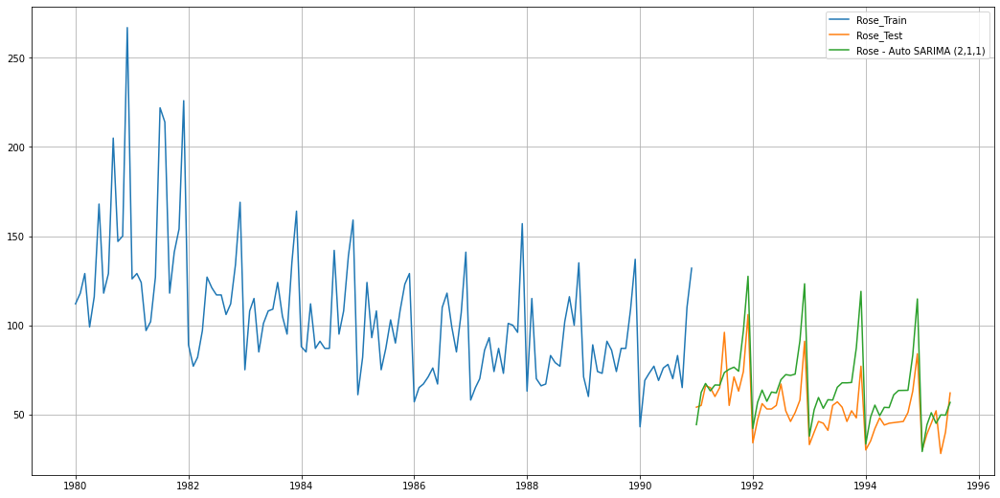

In [ ]:
## Plotting on both the Training and Test using autofit

plt.figure(figsize=(18,9))
plt.plot(rose_SARIMA_train['Rose_Sales'], label='Rose_Train')
plt.plot(rose_ARIMA_test['Rose_Sales'], label='Rose_Test')

plt.plot(rose_SARIMA_test['Predicted'], label='Rose - Auto SARIMA (2,1,1)')


plt.legend(loc='best')
plt.grid();

## **7. Build ARIMA/SARIMA models based on the cut-off points of ACF and PACF on the training data and evaluate this model on the test data using RMSE**

## **Manual ARIMA**

## **Sparkling**

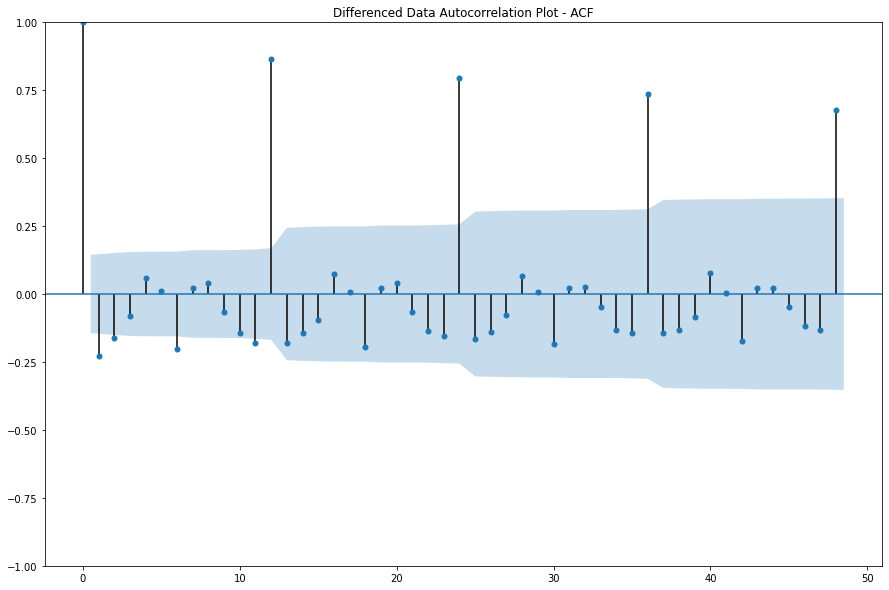

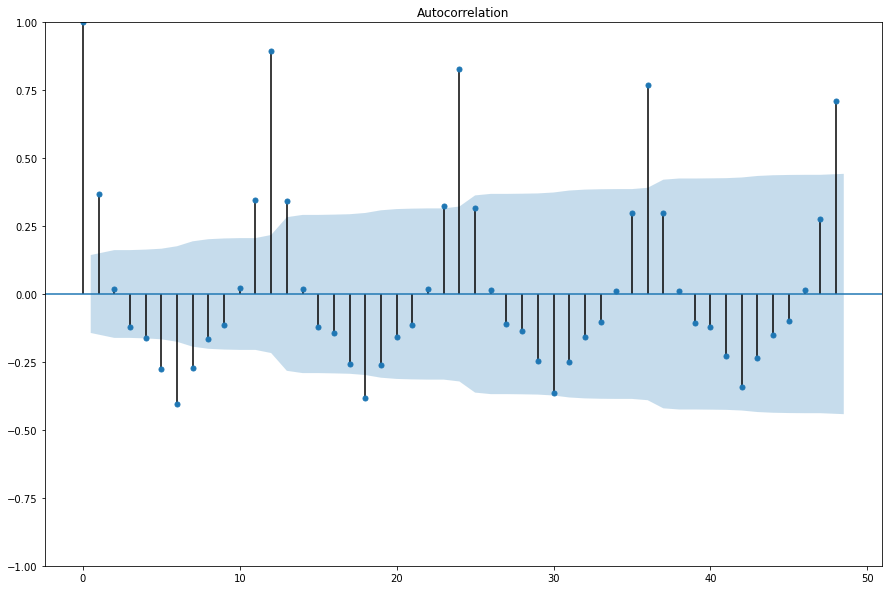

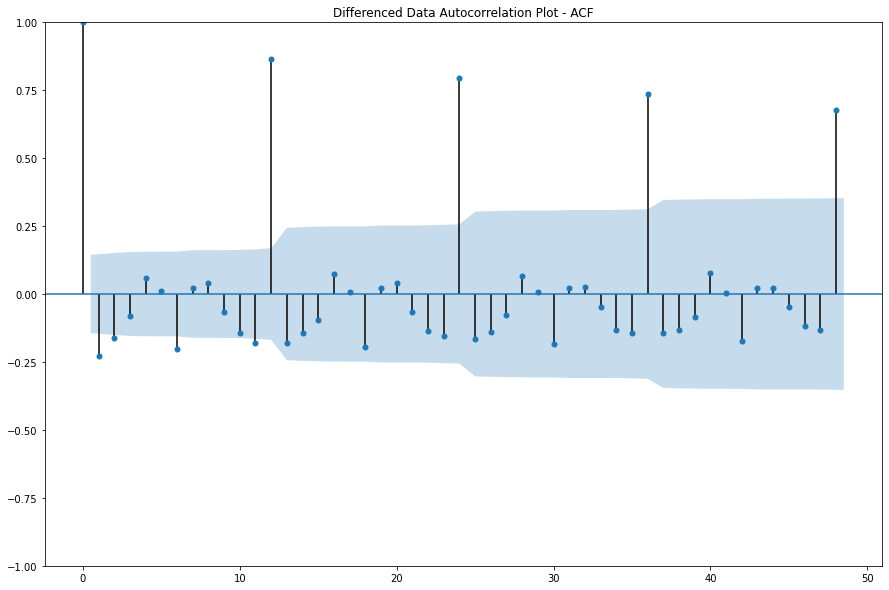

In [ ]:
plot_acf(sparkling,alpha=0.05, lags=48);
plot_acf(sparkling.Sparkling_Sales.diff().dropna(),lags=48,title='Differenced Data Autocorrelation Plot - ACF')

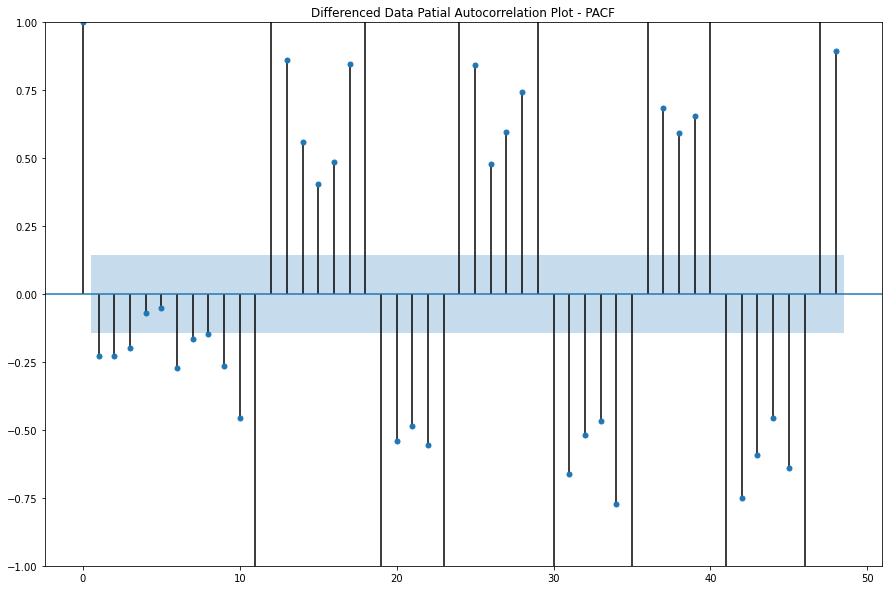

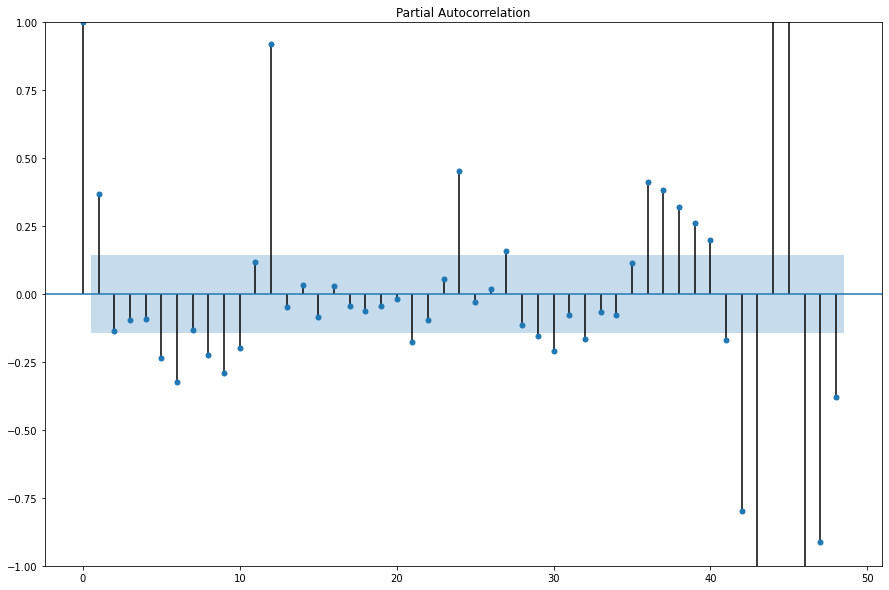

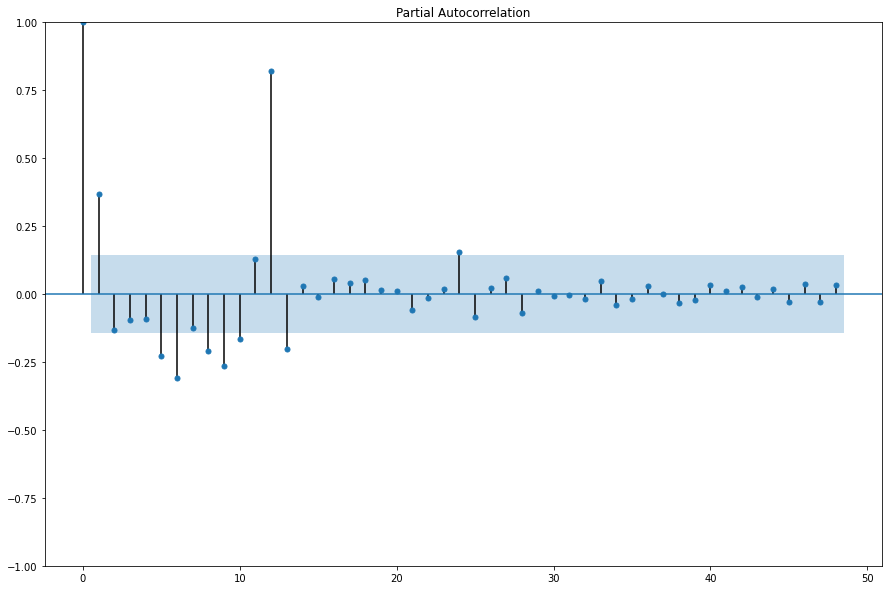

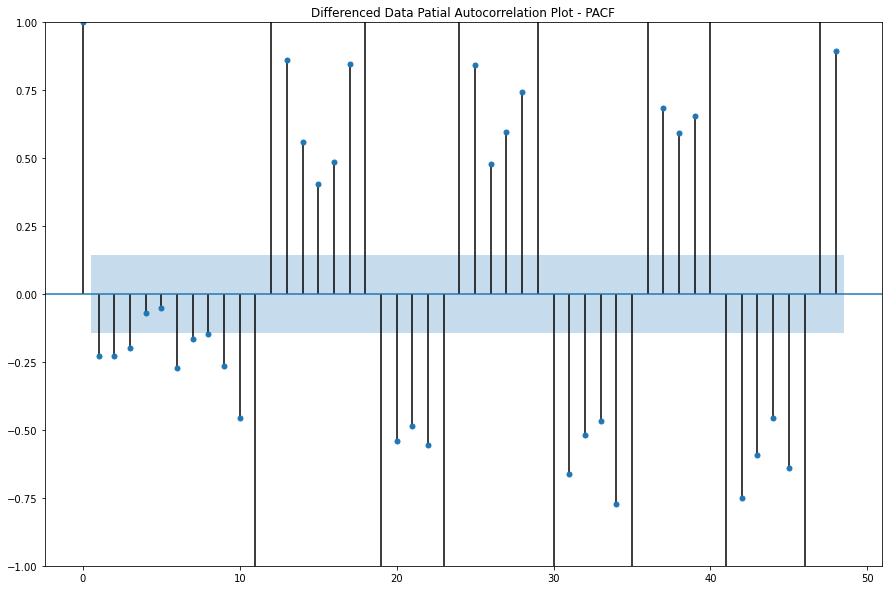

In [ ]:
plot_pacf(sparkling,alpha=0.05, lags=48);
plot_pacf(sparkling,alpha=0.05,lags=48, method='ywmle');
plot_pacf(sparkling.Sparkling_Sales.diff().dropna(),lags=48,title='Differenced Data Patial Autocorrelation Plot - PACF')

In [ ]:
sparkling_manual_ARIMA = ARIMA(sparkling_ARIMA_train['Sparkling_Sales'], order=(3,1,2),freq='MS')

sparkling_results_manual_ARIMA = sparkling_manual_ARIMA.fit()

sparkling_results_manual_ARIMA.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:        Sparkling_Sales   No. Observations:                  132
Model:                 ARIMA(3, 1, 2)   Log Likelihood               -1109.383
Date:                Sat, 12 Feb 2022   AIC                           2230.765
Time:                        12:20:26   BIC                           2248.016
Sample:                    01-01-1980   HQIC                          2237.775
                         - 12-01-1990                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4296      0.047     -9.123      0.000      -0.522      -0.337
ar.L2          0.3350      0.107      3.125      0.002       0.125       0.545
ar.L3         -0.2355      0.060     -3.916      0.000      -0.353      -0.118
ma.L1          0.0175      0.127      0.138      0.890      -0.232       0.267
ma.L2         -0.9823      0.134     -7.330      0.000      -1.245      -0.720
sigma2      1.261e+06   1.94e-07    6.5e+12      0.000    1.26e+06    1.26e+06
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):                 4.40
Prob(Q):                              0.87   Prob(JB):                         0.11
Heteroskedasticity (H):               2.72   Skew:                             0.35
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.55
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.38e+29. Standard errors may be unstable.
"""

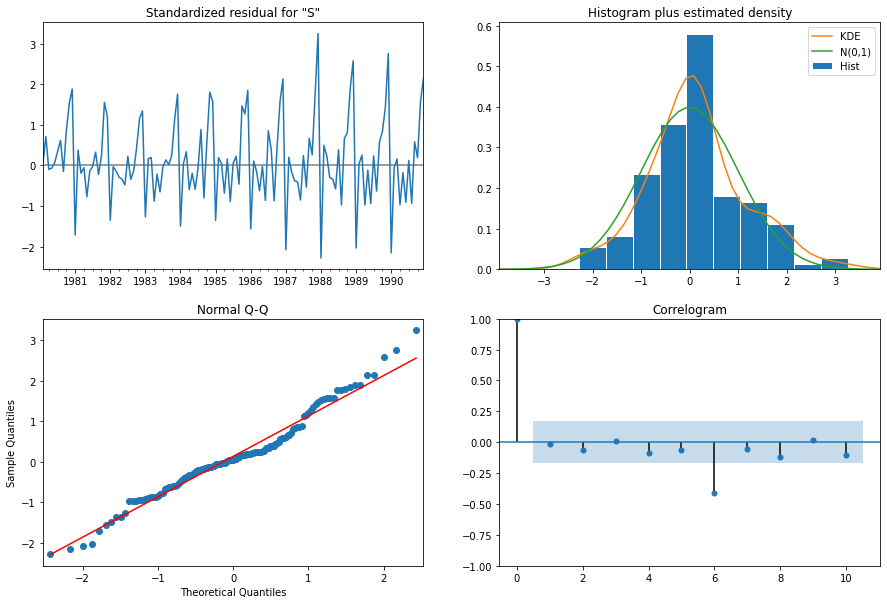

In [ ]:
sparkling_results_manual_ARIMA.plot_diagnostics(figsize=(15,10));

In [ ]:
sparkling_ARIMA_test['Man_Predicted'] = sparkling_results_manual_ARIMA.forecast(steps=len(sparkling_ARIMA_test))

In [ ]:
rmse,mape=calculate_metrics(sparkling_ARIMA_test['Sparkling_Sales'],sparkling_ARIMA_test['Man_Predicted'])
sparkling_tempResultsDf = pd.DataFrame({'Test RMSE': [rmse],
                                'Test MAPE':[mape]}
                           ,index=['Sparkling_Manual ARIMA (3,1,2)'])

sparkling_resultsDf = pd.concat([sparkling_resultsDf, sparkling_tempResultsDf])
sparkling_resultsDf

,Test RMSE,Test MAPE
Sparkling_RegressionOnTime,1389.135175,50.15
Sparkling_Naive,1327.156057,32.90
Sparkling_Simple_Average,1275.073380,38.81
Sparkling_Trailing_MA_2,813.400684,19.70
Sparkling_Trailing_MA_3,1156.589694,35.96
Sparkling_Trailing_MA_6,1283.927428,43.86
Sparkling_Trailing_MA_9,1346.278315,46.86
Sparkling_SES Alpha=0,1316.034674,45.47
"Sparkling_Alpha=0.1,SimpleExponentialSmoothing",1275.081797,38.90
"Sparkling_Alpha=0.2,SimpleExponentialSmoothing",1375.393526,49.53


In [ ]:
sparkling_resultsDf[-1:]

,Test RMSE,Test MAPE
"Sparkling_Manual ARIMA (3,1,2)",1282.052927,41.3


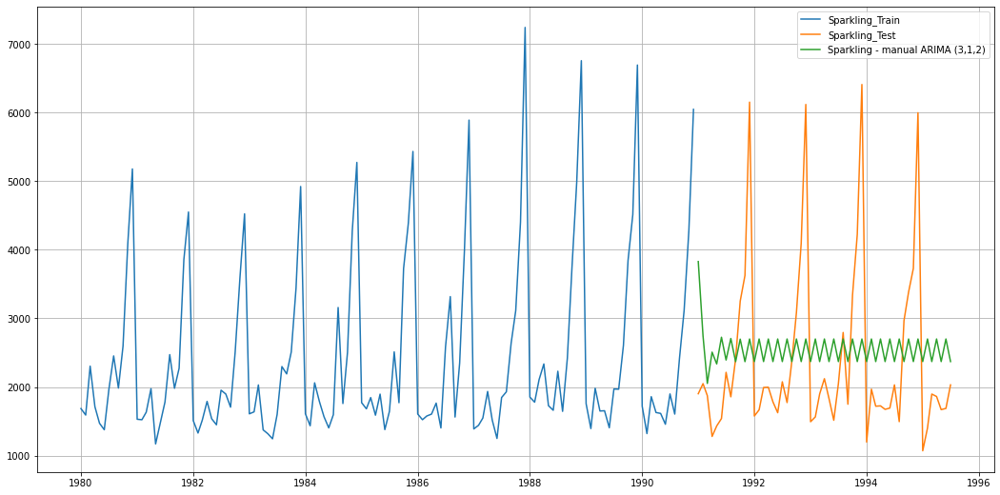

In [ ]:
## Plotting on both the Training and Test using autofit

plt.figure(figsize=(18,9))
plt.plot(sparkling_ARIMA_train['Sparkling_Sales'], label='Sparkling_Train')
plt.plot(sparkling_ARIMA_test['Sparkling_Sales'], label='Sparkling_Test')

plt.plot(sparkling_ARIMA_test['Man_Predicted'], label='Sparkling - manual ARIMA (3,1,2)')


plt.legend(loc='best')
plt.grid();

## **Rose**

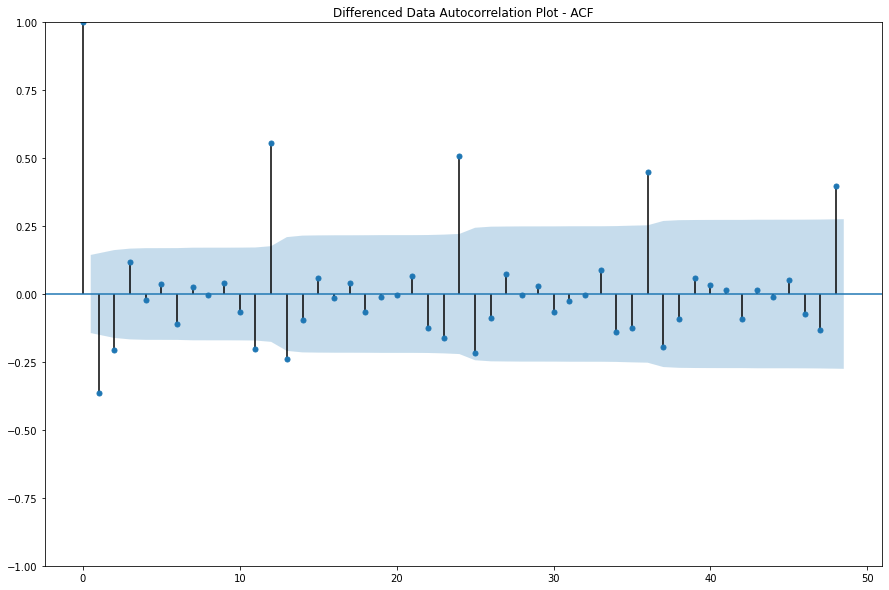

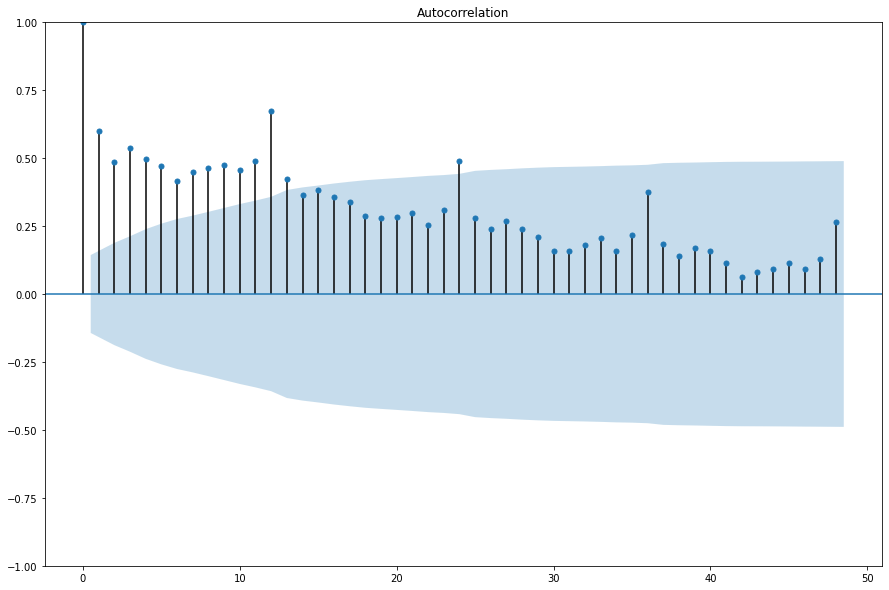

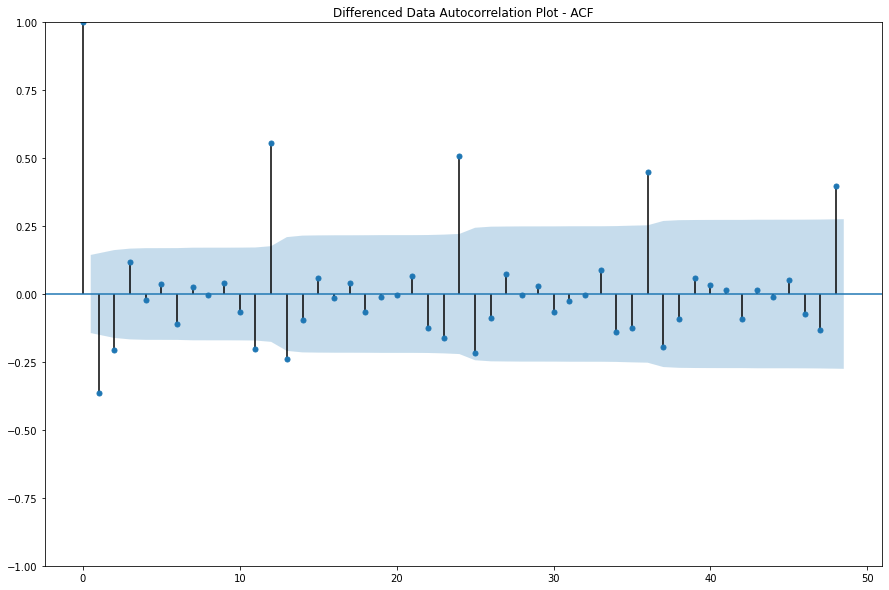

In [ ]:
plot_acf(rose,alpha=0.05, lags=48);
plot_acf(rose.Rose_Sales.diff().dropna(),lags=48,title='Differenced Data Autocorrelation Plot - ACF')

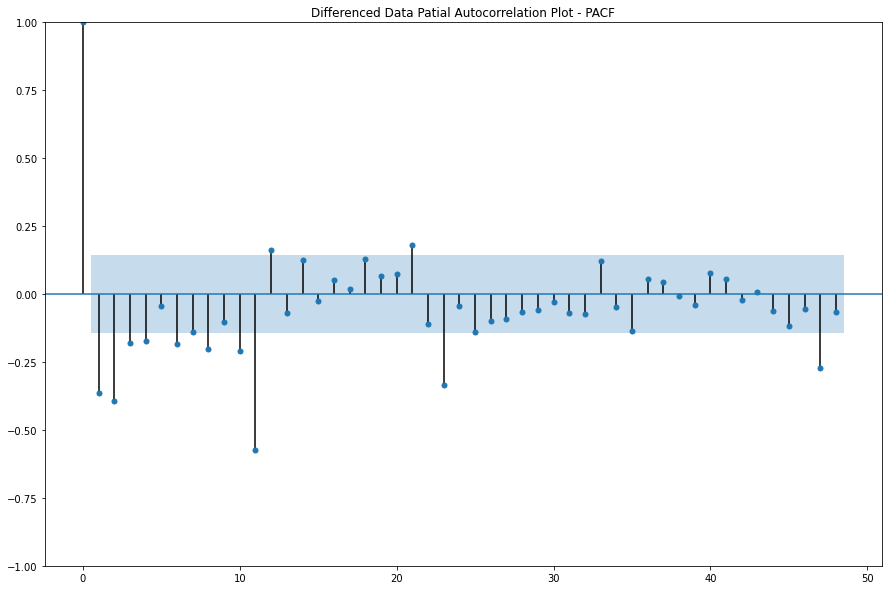

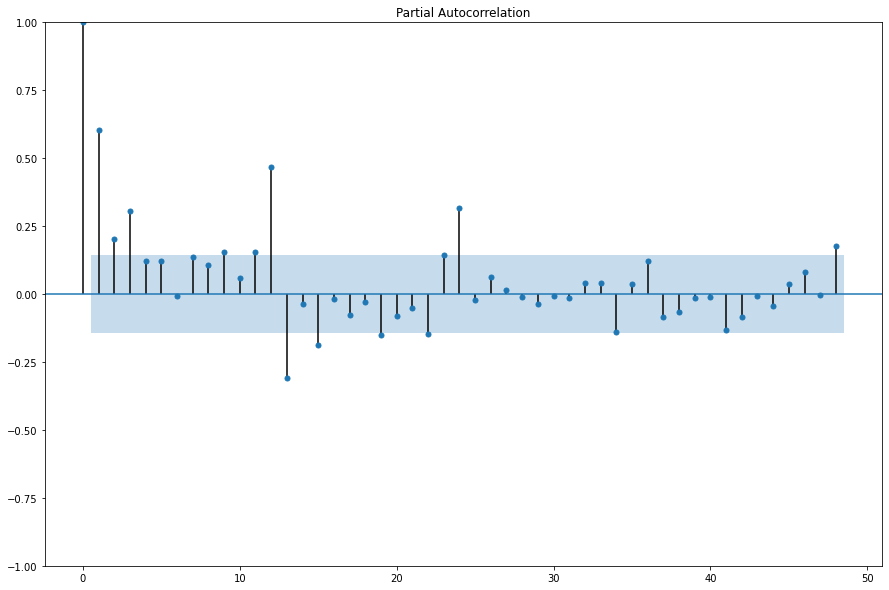

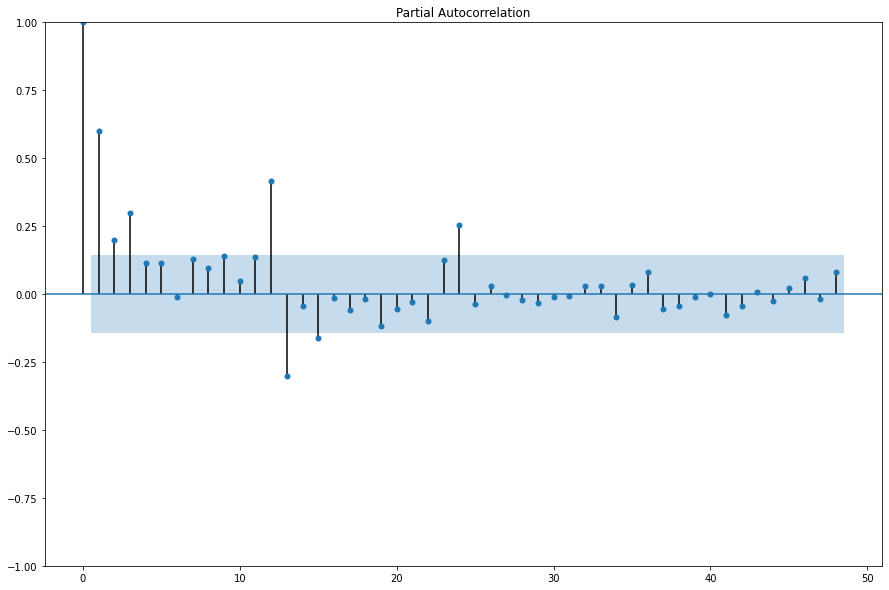

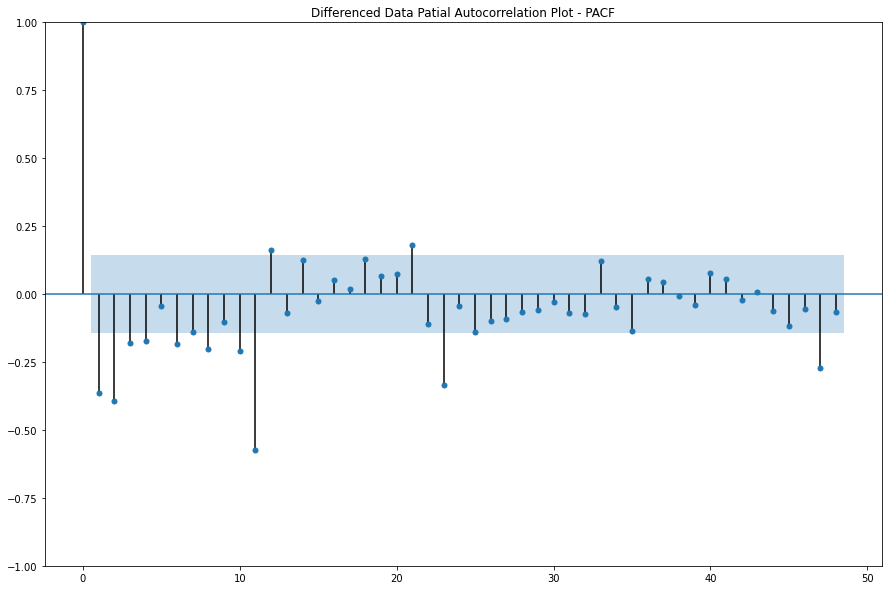

In [ ]:
plot_pacf(rose,alpha=0.05, lags=48);
plot_pacf(rose,alpha=0.05,lags=48, method='ywmle');
plot_pacf(rose.Rose_Sales.diff().dropna(),lags=48,title='Differenced Data Patial Autocorrelation Plot - PACF')

In [ ]:
rose_manual_ARIMA = ARIMA(rose_ARIMA_train['Rose_Sales'], order=(4,1,2),freq='MS')

rose_results_manual_ARIMA = rose_manual_ARIMA.fit()

rose_results_manual_ARIMA.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:             Rose_Sales   No. Observations:                  132
Model:                 ARIMA(4, 1, 2)   Log Likelihood                -635.859
Date:                Sat, 12 Feb 2022   AIC                           1285.718
Time:                        12:20:30   BIC                           1305.845
Sample:                    01-01-1980   HQIC                          1293.896
                         - 12-01-1990                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3838      0.923     -0.416      0.677      -2.192       1.425
ar.L2          0.0046      0.258      0.018      0.986      -0.502       0.511
ar.L3          0.0414      0.113      0.366      0.714      -0.180       0.263
ar.L4         -0.0054      0.177     -0.031      0.976      -0.353       0.342
ma.L1         -0.3239      0.933     -0.347      0.729      -2.153       1.505
ma.L2         -0.5407      0.874     -0.619      0.536      -2.254       1.172
sigma2       951.1524     93.870     10.133      0.000     767.170    1135.135
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                32.85
Prob(Q):                              0.88   Prob(JB):                         0.00
Heteroskedasticity (H):               0.37   Skew:                             0.77
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.91
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

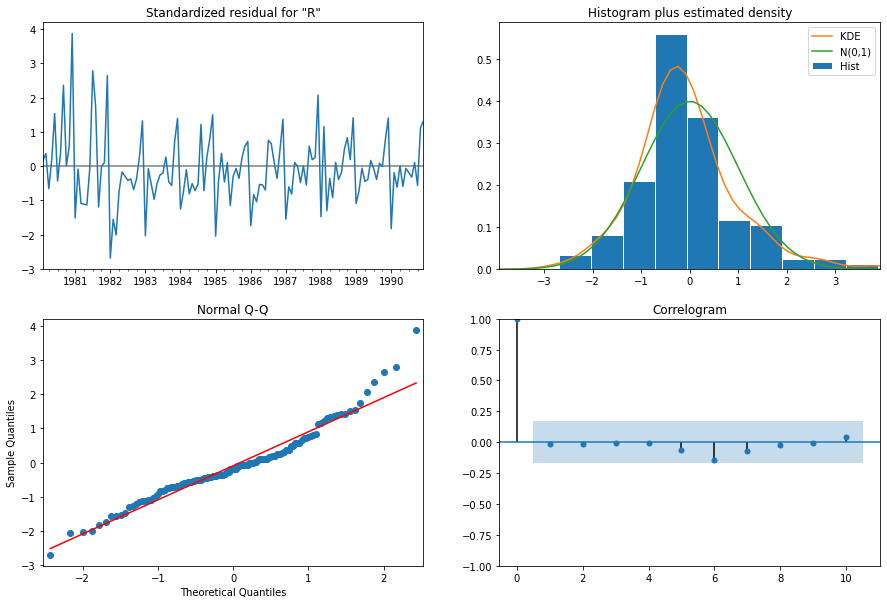

In [ ]:
rose_results_manual_ARIMA.plot_diagnostics(figsize=(15,10));

In [ ]:
rose_ARIMA_test['Man_Predicted'] = rose_results_manual_ARIMA.forecast(steps=len(rose_ARIMA_test))

In [ ]:
rmse,mape=calculate_metrics(rose_ARIMA_test['Rose_Sales'],rose_ARIMA_test['Man_Predicted'])
rose_tempResultsDf = pd.DataFrame({'Test RMSE': [rmse],
                                'Test MAPE':[mape]}
                           ,index=['Rose_Manual ARIMA (4,1,2)'])

rose_resultsDf = pd.concat([rose_resultsDf, rose_tempResultsDf])
rose_resultsDf

,Test RMSE,Test MAPE
Rose_RegressionOnTime,15.268955,22.82
Rose_Naive,17.740327,27.41
Rose_Simple_Average,15.759783,21.37
Rose_Trailing_MA_2,11.529278,13.54
Rose_Trailing_MA_3,14.451403,19.49
Rose_Trailing_MA_6,14.566327,20.82
Rose_Trailing_MA_9,14.727630,21.01
Rose - SES Alpha=0,36.796242,63.88
"Rose_Alpha=0.1,SimpleExponentialSmoothing",53.460570,94.93
"Rose_Alpha=0.2,SimpleExponentialSmoothing",36.828051,63.94


In [ ]:
rose_resultsDf[-1:]

,Test RMSE,Test MAPE
"Rose_Manual ARIMA (4,1,2)",37.037639,64.35


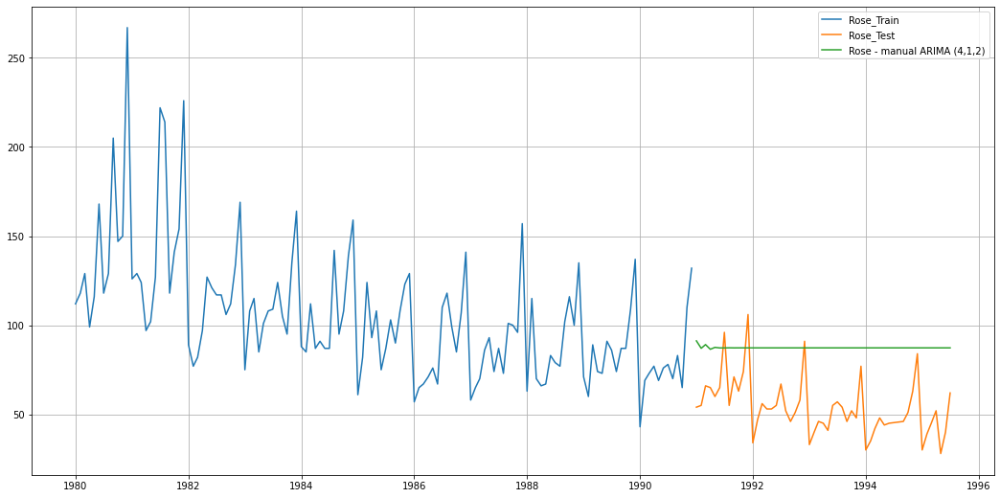

In [ ]:
## Plotting on both the Training and Test using autofit

plt.figure(figsize=(18,9))
plt.plot(rose_ARIMA_train['Rose_Sales'], label='Rose_Train')
plt.plot(rose_ARIMA_test['Rose_Sales'], label='Rose_Test')

plt.plot(rose_ARIMA_test['Man_Predicted'], label='Rose - manual ARIMA (4,1,2)')


plt.legend(loc='best')
plt.grid();

## **Manual SARIMA**

## **Sparkling**

In [ ]:
sparkling_manual_SARIMA=sm.tsa.statespace.SARIMAX(sparkling_SARIMA_train['Sparkling_Sales'],
                                            order=(2,1,2),
                                            seasonal_order=(2,1,1,12),
                                            enforce_stationarity=False,
                                            enforce_invertibility=False,freq='MS')
sparkling_results_manual_SARIMA = sparkling_manual_SARIMA.fit(maxiter=1000)
sparkling_results_manual_SARIMA.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                      Sparkling_Sales   No. Observations:                  132
Model:             SARIMAX(2, 1, 2)x(2, 1, [1], 12)   Log Likelihood                -692.592
Date:                              Sat, 12 Feb 2022   AIC                           1401.183
Time:                                      12:20:34   BIC                           1421.444
Sample:                                  01-01-1980   HQIC                          1409.364
                                       - 12-01-1990                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5780      0.317     -1.824      0.068      -1.199       0.043
ar.L2          0.0176      0.159      0.111      0.912      -0.294       0.330
ma.L1         -0.1453      0.278     -0.522      0.602      -0.691       0.400
ma.L2         -0.7617      0.244     -3.122      0.002      -1.240      -0.284
ar.S.L12      -0.1735      0.575     -0.302      0.763      -1.300       0.953
ar.S.L24      -0.0989      0.179     -0.552      0.581      -0.450       0.252
ma.S.L12      -0.2355      0.563     -0.418      0.676      -1.339       0.868
sigma2      1.712e+05    2.5e+04      6.860      0.000    1.22e+05     2.2e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                12.76
Prob(Q):                              0.97   Prob(JB):                         0.00
Heteroskedasticity (H):               0.89   Skew:                             0.59
Prob(H) (two-sided):                  0.74   Kurtosis:                         4.39
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

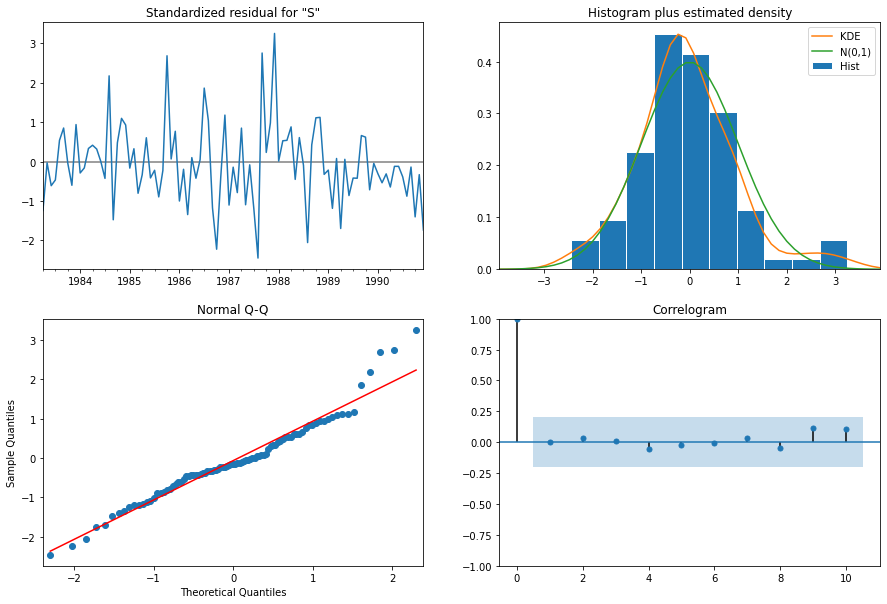

In [ ]:
sparkling_results_manual_SARIMA.plot_diagnostics(figsize=(15,10));

In [ ]:
sparkling_SARIMA_test['Man_Predicted'] = sparkling_results_manual_SARIMA.forecast(steps=len(sparkling_SARIMA_test))

In [ ]:
rmse,mape=calculate_metrics(sparkling_SARIMA_test['Sparkling_Sales'],sparkling_SARIMA_test['Man_Predicted'])
sparkling_tempResultsDf = pd.DataFrame({'Test RMSE': [rmse],
                                'Test MAPE':[mape]}
                           ,index=['Sparkling_Manual SARIMA (3,1,2), (2,1,1)12'])

sparkling_resultsDf = pd.concat([sparkling_resultsDf, sparkling_tempResultsDf])
sparkling_resultsDf

,Test RMSE,Test MAPE
Sparkling_RegressionOnTime,1389.135175,50.15
Sparkling_Naive,1327.156057,32.90
Sparkling_Simple_Average,1275.073380,38.81
Sparkling_Trailing_MA_2,813.400684,19.70
Sparkling_Trailing_MA_3,1156.589694,35.96
Sparkling_Trailing_MA_6,1283.927428,43.86
Sparkling_Trailing_MA_9,1346.278315,46.86
Sparkling_SES Alpha=0,1316.034674,45.47
"Sparkling_Alpha=0.1,SimpleExponentialSmoothing",1275.081797,38.90
"Sparkling_Alpha=0.2,SimpleExponentialSmoothing",1375.393526,49.53


In [ ]:
sparkling_resultsDf[-1:]

,Test RMSE,Test MAPE
"Sparkling_Manual SARIMA (3,1,2), (2,1,1)12",353.176881,11.57


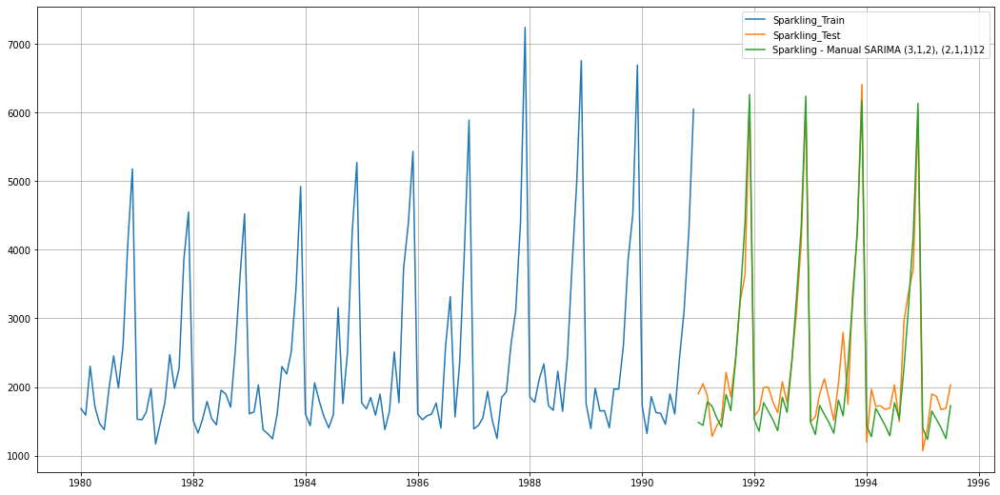

In [ ]:
## Plotting on both the Training and Test using autofit

plt.figure(figsize=(18,9))
plt.plot(sparkling_SARIMA_train['Sparkling_Sales'], label='Sparkling_Train')
plt.plot(sparkling_SARIMA_test['Sparkling_Sales'], label='Sparkling_Test')

plt.plot(sparkling_SARIMA_test['Man_Predicted'], label='Sparkling - Manual SARIMA (3,1,2), (2,1,1)12')


plt.legend(loc='best')
plt.grid();

## **Rose**

In [ ]:
rose_manual_SARIMA=sm.tsa.statespace.SARIMAX(rose_SARIMA_train['Rose_Sales'],
                                            order=(4,1,2),
                                            seasonal_order=(0,1,2,12),
                                            enforce_stationarity=False,
                                            enforce_invertibility=False,freq='MS')
rose_results_manual_SARIMA = rose_manual_SARIMA.fit(maxiter=1000)
rose_results_manual_SARIMA.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                         Rose_Sales   No. Observations:                  132
Model:             SARIMAX(4, 1, 2)x(0, 1, 2, 12)   Log Likelihood                -384.369
Date:                            Sat, 12 Feb 2022   AIC                            786.737
Time:                                    12:20:38   BIC                            809.433
Sample:                                01-01-1980   HQIC                           795.898
                                     - 12-01-1990                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8967      0.132     -6.814      0.000      -1.155      -0.639
ar.L2          0.0165      0.171      0.097      0.923      -0.319       0.352
ar.L3         -0.1132      0.174     -0.650      0.515      -0.454       0.228
ar.L4         -0.1598      0.116     -1.380      0.168      -0.387       0.067
ma.L1          0.1508      0.174      0.866      0.387      -0.191       0.492
ma.L2         -0.8492      0.164     -5.166      0.000      -1.171      -0.527
ma.S.L12      -0.3907      0.102     -3.848      0.000      -0.590      -0.192
ma.S.L24      -0.0887      0.091     -0.977      0.329      -0.267       0.089
sigma2       238.9649      0.001   2.02e+05      0.000     238.963     238.967
===================================================================================
Ljung-Box (L1) (Q):                   0.06   Jarque-Bera (JB):                 0.01
Prob(Q):                              0.80   Prob(JB):                         0.99
Heteroskedasticity (H):               0.76   Skew:                            -0.01
Prob(H) (two-sided):                  0.46   Kurtosis:                         3.06
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 4.18e+20. Standard errors may be unstable.
"""

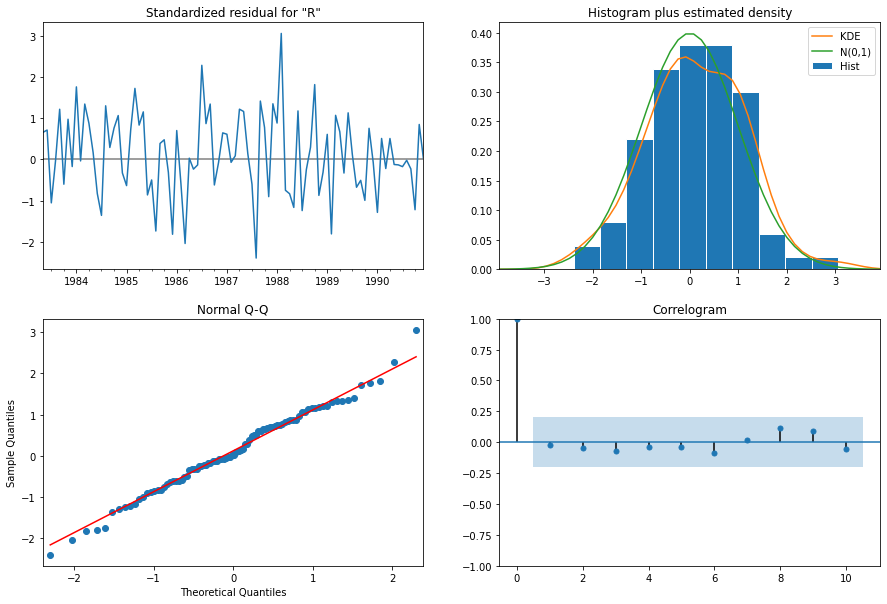

In [ ]:
rose_results_manual_SARIMA.plot_diagnostics(figsize=(15,10));

In [ ]:
rose_SARIMA_test['Man_Predicted'] = rose_results_manual_SARIMA.forecast(steps=len(rose_SARIMA_test))

In [ ]:
rmse,mape=calculate_metrics(rose_SARIMA_test['Rose_Sales'],rose_SARIMA_test['Man_Predicted'])
rose_tempResultsDf = pd.DataFrame({'Test RMSE': [rmse],
                                'Test MAPE':[mape]}
                           ,index=['Rose_Manual SARIMA (4,1,2), (0,1,2)12'])

rose_resultsDf = pd.concat([rose_resultsDf, rose_tempResultsDf])
rose_resultsDf

,Test RMSE,Test MAPE
Rose_RegressionOnTime,15.268955,22.82
Rose_Naive,17.740327,27.41
Rose_Simple_Average,15.759783,21.37
Rose_Trailing_MA_2,11.529278,13.54
Rose_Trailing_MA_3,14.451403,19.49
Rose_Trailing_MA_6,14.566327,20.82
Rose_Trailing_MA_9,14.727630,21.01
Rose - SES Alpha=0,36.796242,63.88
"Rose_Alpha=0.1,SimpleExponentialSmoothing",53.460570,94.93
"Rose_Alpha=0.2,SimpleExponentialSmoothing",36.828051,63.94


In [ ]:
rose_resultsDf[-1:]

,Test RMSE,Test MAPE
"Rose_Manual SARIMA (4,1,2), (0,1,2)12",15.377252,22.16


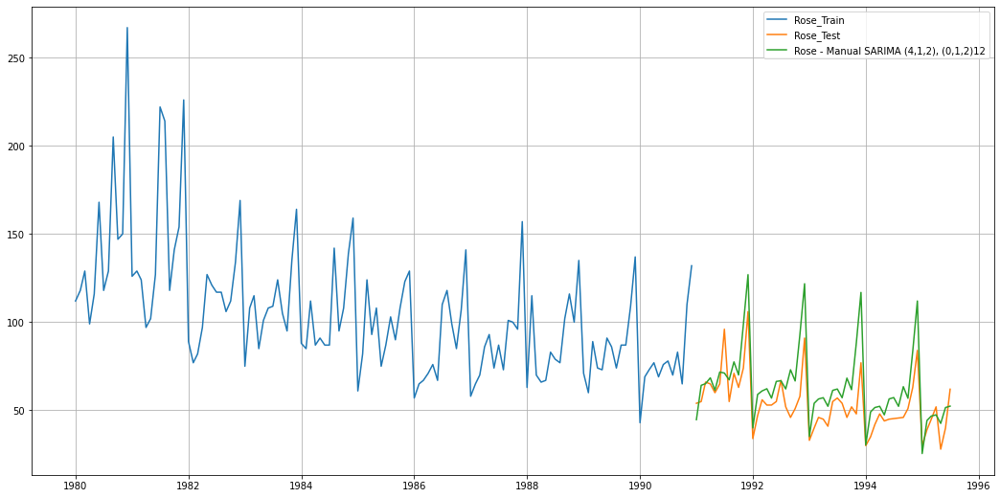

In [ ]:
## Plotting on both the Training and Test using autofit

plt.figure(figsize=(18,9))
plt.plot(rose_SARIMA_train['Rose_Sales'], label='Rose_Train')
plt.plot(rose_SARIMA_test['Rose_Sales'], label='Rose_Test')

plt.plot(rose_SARIMA_test['Man_Predicted'], label='Rose - Manual SARIMA (4,1,2), (0,1,2)12')


plt.legend(loc='best')
plt.grid();

## **8. Build a table (create a data frame) with all the models built along with their corresponding parameters and the respective RMSE values on the test data**

In [ ]:
sparkling_resultsDf.sort_values('Test RMSE')

,Test RMSE,Test MAPE
"Sparkling_Alpha=0.1,Beta=0,Gamma=0.2,TripleExponentialSmoothing",304.271535,9.44
"Sparkling_Alpha=0.9,Beta=0,Gamma=0.2,TripleExponentialSmoothing",314.589055,9.50
"Sparkling_Alpha=0.7,Beta=0,Gamma=0.2,TripleExponentialSmoothing",314.679904,9.37
"Sparkling_Manual SARIMA (3,1,2), (2,1,1)12",353.176881,11.57
"Sparkling - Triple Exponential Smoothing Alpha=0.1,Beta=0.5,Gamma=0.1",378.626253,12.87
"Sparkling_Auto SARIMA (1,1,2), (0, 1,2),12",382.576713,12.87
Sparkling_Trailing_MA_2,813.400684,19.70
Sparkling_Trailing_MA_3,1156.589694,35.96
Sparkling_Simple_Average,1275.073380,38.81
"Sparkling_Alpha=0.1,SimpleExponentialSmoothing",1275.081797,38.90


In [ ]:
rose_resultsDf.sort_values('Test RMSE')

,Test RMSE,Test MAPE
Rose_Trailing_MA_2,11.529278,13.54
"Alpha=0,Beta=0.7,Gamma=0.4,TripleExponentialSmoothing",11.637434,15.38
"Alpha=0,Beta=0.4,Gamma=0.4,TripleExponentialSmoothing",11.637435,15.38
"Alpha=0,Beta=0.3,Gamma=0.4,TripleExponentialSmoothing",11.637436,15.38
"Rose_Triple Exponential Smoothing Alpha=0.08,Beta=0,Gamma=0.47",14.259408,19.25
Rose_Trailing_MA_3,14.451403,19.49
Rose_Trailing_MA_6,14.566327,20.82
Rose_Trailing_MA_9,14.727630,21.01
Rose_RegressionOnTime,15.268955,22.82
"Alpha=0,Beta=0.1,DoubleExponentialSmoothing",15.268956,22.82


## **9. Based on the model-building exercise, build the most optimum model(s) on the complete data and predict 12 months into the future with appropriate confidence intervals/bands**

## **Sparkling**

In [ ]:
sparkling_best_model = ExponentialSmoothing(sparkling['Sparkling_Sales'],seasonal_periods = 12 ,trend='additive',seasonal='additive')
sparkling_best_model_fit = sparkling_best_model.fit(smoothing_level=0.1,smoothing_slope=0,smoothing_seasonal=0.2)

## Prediction 

sparkling_predict_12months= sparkling_best_model_fit.forecast(steps=12)
sparkling_best_model_fit.summary()

Dep. Variable:,Sparkling_Sales,No. Observations:,187
Model:,ExponentialSmoothing,SSE,25418228.714
Optimized:,True,AIC,2242.315
Trend:,Additive,BIC,2294.013
Seasonal:,Additive,AICC,2246.387
Seasonal Periods:,12,Date:,"Sat, 12 Feb 2022"
Box-Cox:,False,Time:,12:21:03
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.1000000,alpha,False
smoothing_trend,0.000000,beta,False


In [ ]:
sparkling_resid_std=sparkling_best_model_fit.resid.std()

In [ ]:
sparkling_sales_forecast=pd.DataFrame()
sparkling_sales_forecast['Predicted']=sparkling_predict_12months
sparkling_sales_forecast['CI_Lower']=sparkling_predict_12months-1.96*sparkling_resid_std
sparkling_sales_forecast['CI_Upper']=sparkling_predict_12months+1.96*sparkling_resid_std

In [ ]:
sparkling_sales_forecast

,Predicted,CI_Lower,CI_Upper
1995-08-01,2013.289972,1288.733499,2737.846445
1995-09-01,2344.691474,1620.135000,3069.247947
1995-10-01,3219.581005,2495.024531,3944.137478
1995-11-01,4061.187506,3336.631033,4785.743980
1995-12-01,6108.476294,5383.919820,6833.032767
1996-01-01,1432.821495,708.265022,2157.377968
1996-02-01,1616.669953,892.113480,2341.226427
1996-03-01,1859.936571,1135.380097,2584.493044
1996-04-01,1807.243781,1082.687308,2531.800254
1996-05-01,1660.830200,936.273727,2385.386674


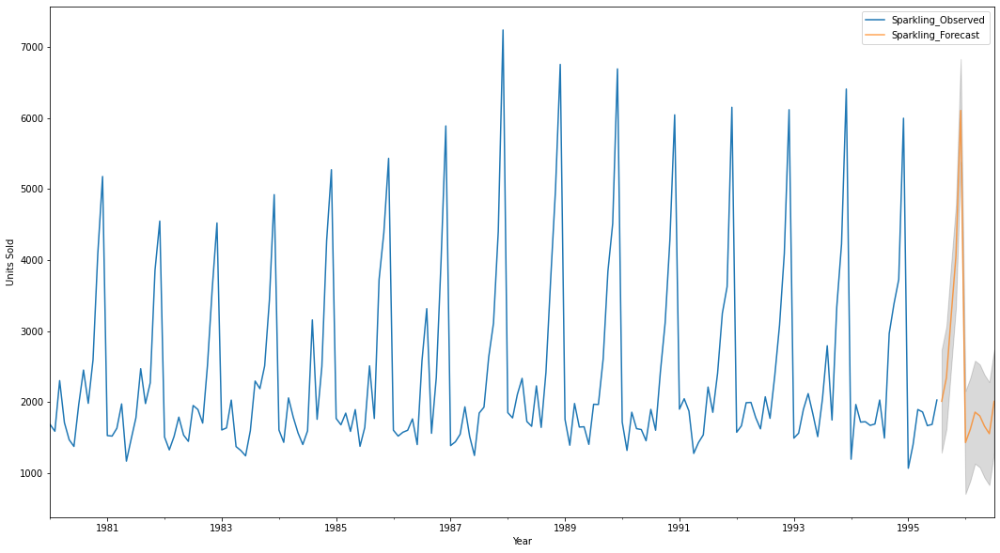

In [ ]:
# plot the forecast along with the confidence band
plt.figure(figsize=(18,10))
axis = sparkling['Sparkling_Sales'].plot(label='Sparkling_Observed')
sparkling_predict_12months.plot(ax=axis, label='Sparkling_Forecast', alpha=0.7)
axis.fill_between(sparkling_sales_forecast.index, sparkling_sales_forecast['CI_Lower'], 
                  sparkling_sales_forecast['CI_Upper'], color='k', alpha=.15)
axis.set_xlabel('Year')
axis.set_ylabel('Units Sold')
plt.legend(loc='best')
plt.show()

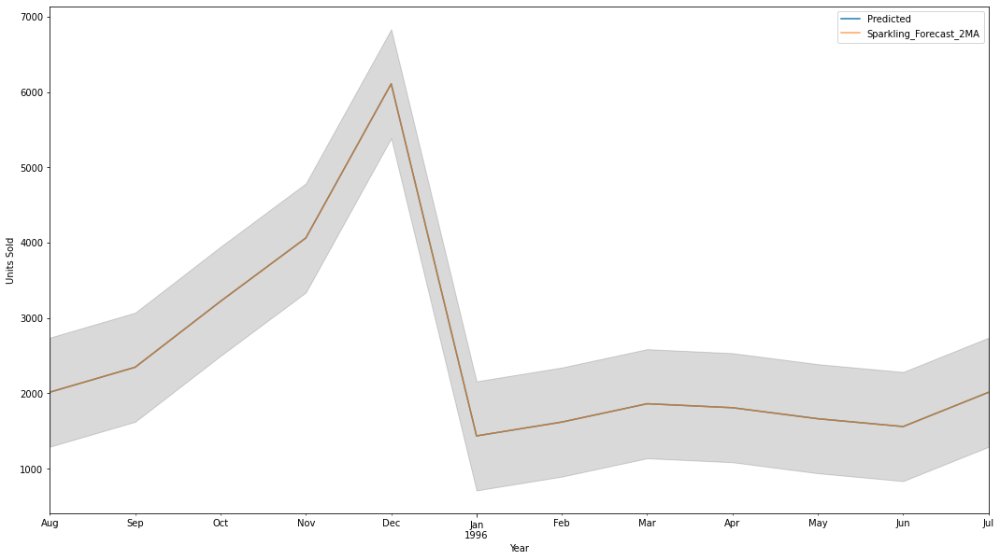

In [ ]:
# plot the forecast along with the confidence band
plt.figure(figsize=(18,10))
axis = sparkling_sales_forecast['Predicted'].plot()
sparkling_predict_12months.plot(ax=axis, label='Sparkling_Forecast_2MA', alpha=0.7)
axis.fill_between(sparkling_sales_forecast.index, sparkling_sales_forecast['CI_Lower'], 
                  sparkling_sales_forecast['CI_Upper'], color='k', alpha=.15)
axis.set_xlabel('Year')
axis.set_ylabel('Units Sold')
plt.legend(loc='best')
plt.show()

##**Rose**

In [ ]:
rose_best_model = ExponentialSmoothing(rose['Rose_Sales'],seasonal_periods = 12 ,trend='additive',seasonal='additive')
rose_best_model_fit = rose_best_model.fit(smoothing_level=0,smoothing_slope=0.7,smoothing_seasonal=0.4)

## Prediction 

rose_predict_12months= rose_best_model_fit.forecast(steps=12)
rose_best_model_fit.summary()

Dep. Variable:,Rose_Sales,No. Observations:,187
Model:,ExponentialSmoothing,SSE,67850.132
Optimized:,True,AIC,1134.168
Trend:,Additive,BIC,1185.866
Seasonal:,Additive,AICC,1138.240
Seasonal Periods:,12,Date:,"Sat, 12 Feb 2022"
Box-Cox:,False,Time:,12:21:05
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.000000,alpha,False
smoothing_trend,0.7000000,beta,False


In [ ]:
rose_resid_std=rose_best_model_fit.resid.std()

In [ ]:
rose_sales_forecast=pd.DataFrame()
rose_sales_forecast['Predicted']=rose_predict_12months
rose_sales_forecast['CI_Lower']=rose_predict_12months-1.96*rose_resid_std
rose_sales_forecast['CI_Upper']=rose_predict_12months+1.96*rose_resid_std

In [ ]:
rose_sales_forecast

,Predicted,CI_Lower,CI_Upper
1995-08-01,36.854631,-0.580120,74.289381
1995-09-01,37.088226,-0.346525,74.522977
1995-10-01,39.860636,2.425885,77.295386
1995-11-01,48.707269,11.272518,86.142020
1995-12-01,75.414637,37.979886,112.849388
1996-01-01,17.297320,-20.137430,54.732071
1996-02-01,25.617806,-11.816945,63.052556
1996-03-01,32.265041,-5.169710,69.699791
1996-04-01,35.823739,-1.611012,73.258490
1996-05-01,24.319974,-13.114777,61.754725


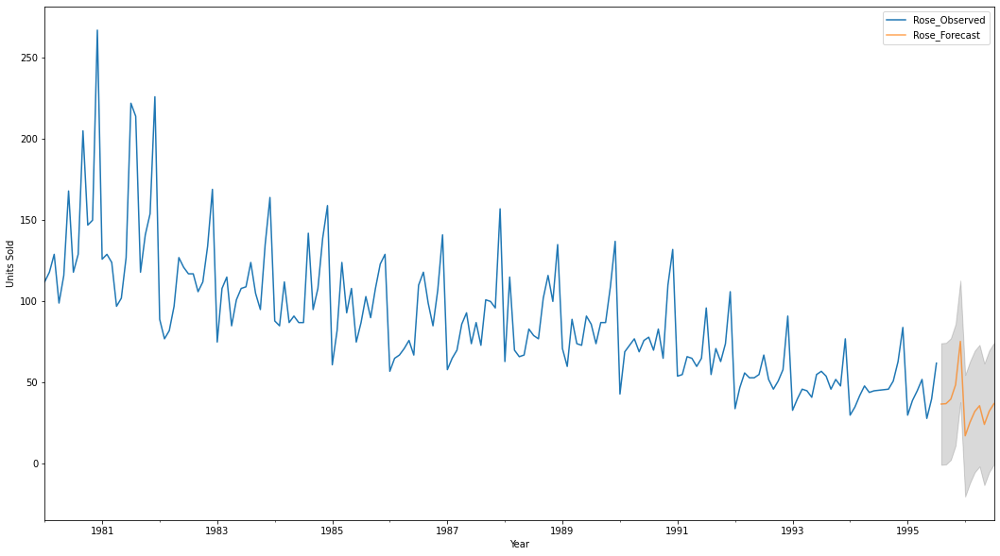

In [ ]:
# plot the forecast along with the confidence band
plt.figure(figsize=(18,10))
axis = rose['Rose_Sales'].plot(label='Rose_Observed')
rose_predict_12months.plot(ax=axis, label='Rose_Forecast', alpha=0.7)
axis.fill_between(rose_sales_forecast.index, rose_sales_forecast['CI_Lower'], 
                  rose_sales_forecast['CI_Upper'], color='k', alpha=.15)
axis.set_xlabel('Year')
axis.set_ylabel('Units Sold')
plt.legend(loc='best')
plt.show()

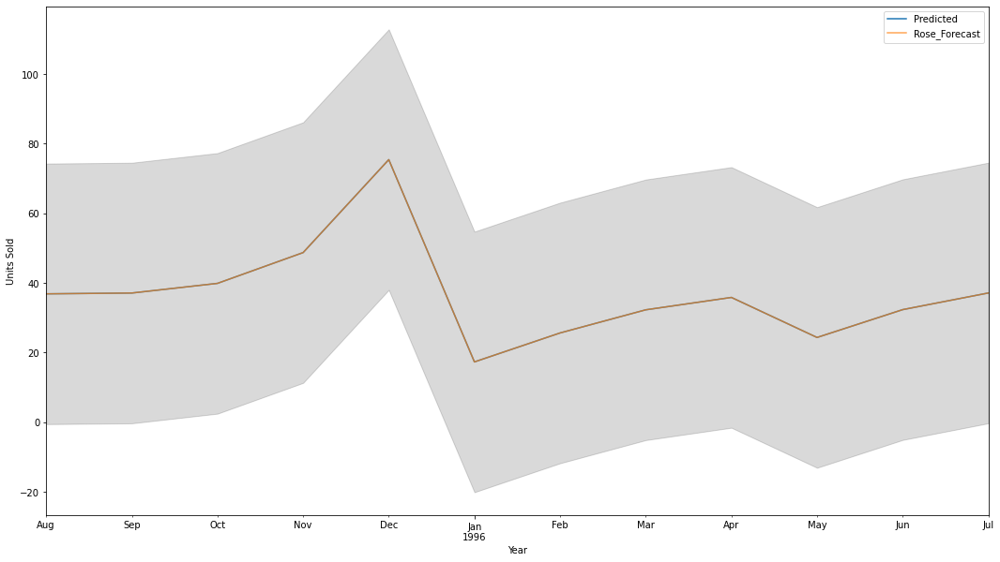

In [ ]:
# plot the forecast along with the confidence band
plt.figure(figsize=(18,10))
axis = rose_sales_forecast['Predicted'].plot()
rose_predict_12months.plot(ax=axis, label='Rose_Forecast', alpha=0.7)
axis.fill_between(rose_sales_forecast.index, rose_sales_forecast['CI_Lower'], 
                  rose_sales_forecast['CI_Upper'], color='k', alpha=.15)
axis.set_xlabel('Year')
axis.set_ylabel('Units Sold')
plt.legend(loc='best')
plt.show()

In [ ]:
rose_best_model1 = ExponentialSmoothing(rose['Rose_Sales'].rolling(2).mean().dropna(),seasonal_periods = 12 ,trend='additive',seasonal='additive')
rose_best_model_fit1 = rose_best_model1.fit(smoothing_level=0,smoothing_slope=0.7,smoothing_seasonal=0.4)

## Prediction 

rose_predict_12months1= rose_best_model_fit1.forecast(steps=12)
rose_best_model_fit1.summary()

Dep. Variable:,Rose_Sales,No. Observations:,186
Model:,ExponentialSmoothing,SSE,41444.360
Optimized:,True,AIC,1037.583
Trend:,Additive,BIC,1089.195
Seasonal:,Additive,AICC,1041.679
Seasonal Periods:,12,Date:,"Sat, 12 Feb 2022"
Box-Cox:,False,Time:,12:21:05
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.000000,alpha,False
smoothing_trend,0.7000000,beta,False


In [ ]:
rose_resid_std1=rose_best_model_fit1.resid.std()

In [ ]:
rose_sales_forecast1=pd.DataFrame()
rose_sales_forecast1['Predicted']=rose_predict_12months1
rose_sales_forecast1['CI_Lower']=rose_predict_12months1-1.96*rose_resid_std
rose_sales_forecast1['CI_Upper']=rose_predict_12months1+1.96*rose_resid_std

In [ ]:
rose_sales_forecast1

,Predicted,CI_Lower,CI_Upper
1995-08-01,40.277222,2.842471,77.711973
1995-09-01,36.896247,-0.538504,74.330998
1995-10-01,38.399250,0.964499,75.834000
1995-11-01,44.208771,6.774020,81.643522
1995-12-01,61.985772,24.551021,99.420523
1996-01-01,46.281194,8.846443,83.715945
1996-02-01,21.382359,-16.052392,58.817110
1996-03-01,28.866219,-8.568531,66.300970
1996-04-01,33.969186,-3.465565,71.403937
1996-05-01,29.996653,-7.438098,67.431404


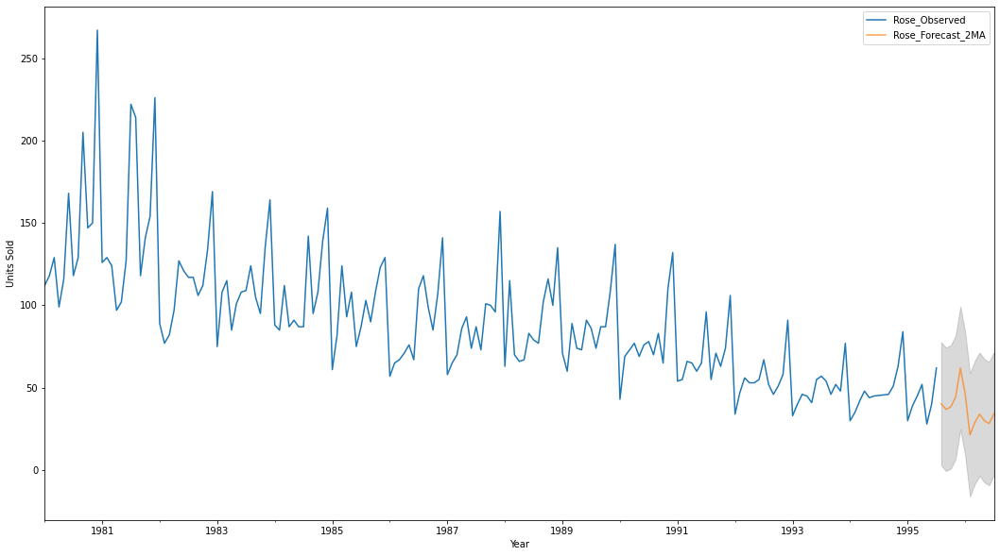

In [ ]:
# plot the forecast along with the confidence band
plt.figure(figsize=(18,10))
axis = rose['Rose_Sales'].plot(label='Rose_Observed')
rose_predict_12months1.plot(ax=axis, label='Rose_Forecast_2MA', alpha=0.7)
axis.fill_between(rose_sales_forecast1.index, rose_sales_forecast1['CI_Lower'], 
                  rose_sales_forecast1['CI_Upper'], color='k', alpha=.15)
axis.set_xlabel('Year')
axis.set_ylabel('Units Sold')
plt.legend(loc='best')
plt.show()

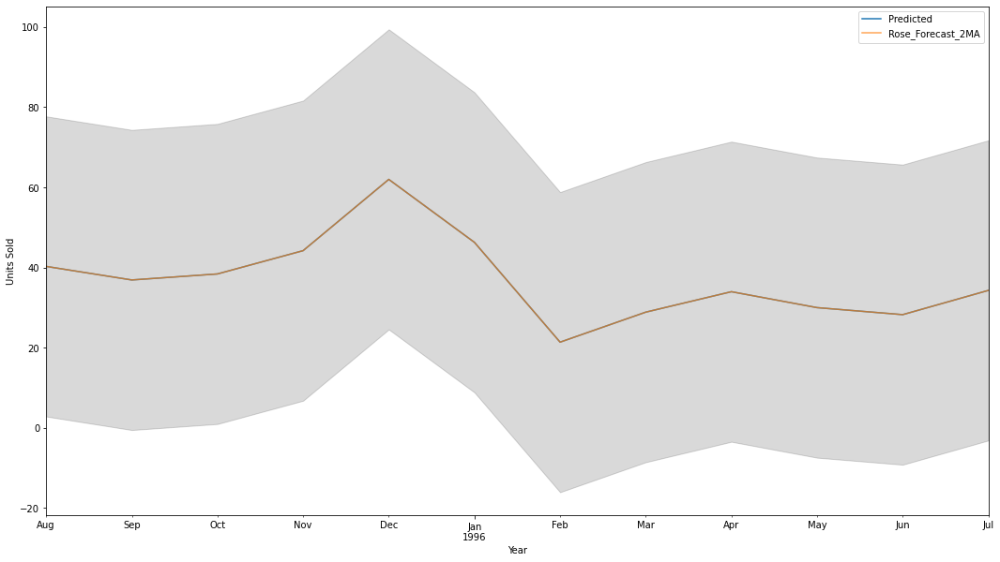

In [ ]:
# plot the forecast along with the confidence band
plt.figure(figsize=(18,10))
axis = rose_sales_forecast1['Predicted'].plot()
rose_predict_12months1.plot(ax=axis, label='Rose_Forecast_2MA', alpha=0.7)
axis.fill_between(rose_sales_forecast1.index, rose_sales_forecast1['CI_Lower'], 
                  rose_sales_forecast1['CI_Upper'], color='k', alpha=.15)
axis.set_xlabel('Year')
axis.set_ylabel('Units Sold')
plt.legend(loc='best')
plt.show()

## **10. Comment on the model thus built and report your findings and suggest the measures that the company should be taking for future sales.**
**Please explain and summarise the various steps performed in this project. There should be proper business interpretation and actionable insights present.**